In [1]:
#测试GPU可用性
import tensorflow as tf
print('GPU可用性:',tf.test.is_gpu_available())

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU可用性: True


数据读取集及数据预处理

In [2]:
#数据读取
import pandas as pd
Data=pd.read_excel('/mnt/workspace/Disease_class/Feature_Data_ClassDisease/ClassDisease_FeatureData_Nomal_ADA.xlsx')
Data=Data.iloc[:,1:]
Data.head(10)

,cg03130627,cg16378352,cg23651808,cg10096929,cg01922433,cg11447335,cg02770835,cg11027217,cg24828811,cg17916447,...,cg17926234,cg16053651,cg10744200,age,gender,sample_type,disease,disease_encode,sample_type_encode,gender_encode
0,-4.585271,-2.600812,-1.093021,-1.277029,2.163468,2.010774,0.519260,-1.945225,1.456115,2.482634,...,-3.256540,2.174329,4.112908,88.0,F,disease tissue,Alzheimer's disease,1,1,0.0
1,-3.374769,-2.427712,-1.077132,-2.020410,1.991711,1.502429,0.388746,-1.489058,1.592260,2.253116,...,-3.543689,2.174329,2.664729,92.0,F,disease tissue,Alzheimer's disease,1,1,0.0
2,-3.439160,-2.276579,-0.954183,-1.900305,2.648415,2.110522,0.708031,-2.039899,2.152700,2.570129,...,-3.580953,1.945225,2.785946,93.0,F,disease tissue,Alzheimer's disease,1,1,0.0
3,-3.837361,-3.076403,-0.914682,-2.401172,2.059685,3.149987,0.384596,-1.972920,1.839820,2.218738,...,-3.175661,2.069693,2.555085,96.0,F,disease tissue,Alzheimer's disease,1,1,0.0
4,-3.472874,-2.185284,-1.179996,-1.599394,2.131436,2.020410,0.184485,-1.436670,1.502429,2.079779,...,-3.580953,2.540233,4.178048,91.0,M,disease tissue,Alzheimer's disease,1,1,1.0
5,-3.938986,-2.525567,-0.974195,-2.079779,2.059685,2.110522,1.585160,-1.814692,1.330612,2.131436,...,-3.374769,1.726235,3.201956,80.0,M,disease tissue,Alzheimer's disease,1,1,1.0
6,-3.439160,-2.427712,-0.944243,-1.936120,2.207487,2.069693,0.758205,-1.695385,1.543240,2.163468,...,-3.472874,2.337277,3.343970,79.0,F,disease tissue,Alzheimer's disease,1,1,0.0
7,-2.823096,-2.511081,-0.632117,-1.529517,2.616463,2.253116,0.269567,-1.423834,1.806416,2.555085,...,-3.439160,2.264792,3.543689,77.0,M,disease tissue,Alzheimer's disease,1,1,1.0
8,-3.701353,-2.337277,-0.904911,-2.001208,2.253116,1.963624,-0.212757,-1.564056,1.734052,2.540233,...,-3.507691,2.276579,3.886935,85.0,F,disease tissue,Alzheimer's disease,1,1,0.0
9,-3.406479,-2.616463,-0.944243,-1.687774,2.120936,2.174329,-0.298130,-1.773795,1.475799,2.230092,...,-3.284902,2.039899,3.659672,80.0,M,disease tissue,Alzheimer's disease,1,1,1.0


In [3]:
Data.info()    #查看数据基本信息

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1967 entries, 0 to 1966
Data columns (total 27 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   cg03130627          1967 non-null   float64
 1   cg16378352          1967 non-null   float64
 2   cg23651808          1967 non-null   float64
 3   cg10096929          1967 non-null   float64
 4   cg01922433          1967 non-null   float64
 5   cg11447335          1967 non-null   float64
 6   cg02770835          1967 non-null   float64
 7   cg11027217          1967 non-null   float64
 8   cg24828811          1967 non-null   float64
 9   cg17916447          1967 non-null   float64
 10  cg06857865          1967 non-null   float64
 11  cg05845757          1967 non-null   float64
 12  cg11917413          1967 non-null   float64
 13  cg09227621          1967 non-null   float64
 14  cg04562683          1967 non-null   float64
 15  cg09681335          1967 non-null   float64
 16  cg0487

In [4]:
Data.isnull().sum() #统计空缺数据

cg03130627            0
cg16378352            0
cg23651808            0
cg10096929            0
cg01922433            0
cg11447335            0
cg02770835            0
cg11027217            0
cg24828811            0
cg17916447            0
cg06857865            0
cg05845757            0
cg11917413            0
cg09227621            0
cg04562683            0
cg09681335            0
cg04871364            0
cg17926234            0
cg16053651            0
cg10744200            0
age                   0
gender                1
sample_type           0
disease               0
disease_encode        0
sample_type_encode    0
gender_encode         1
dtype: int64

In [5]:
#填充空缺数据
Data['gender'].fillna('F',inplace=True)
Data['gender_encode'].fillna(0,inplace=True)
Data.isnull().sum()    #检验空缺数据

cg03130627            0
cg16378352            0
cg23651808            0
cg10096929            0
cg01922433            0
cg11447335            0
cg02770835            0
cg11027217            0
cg24828811            0
cg17916447            0
cg06857865            0
cg05845757            0
cg11917413            0
cg09227621            0
cg04562683            0
cg09681335            0
cg04871364            0
cg17926234            0
cg16053651            0
cg10744200            0
age                   0
gender                0
sample_type           0
disease               0
disease_encode        0
sample_type_encode    0
gender_encode         0
dtype: int64

查看统计学特征并去除异常数据

In [111]:
#查看数据统计学信息
Data_Stats=Data.describe()
Data_Stats.to_excel('/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Data_Stats.xlsx')

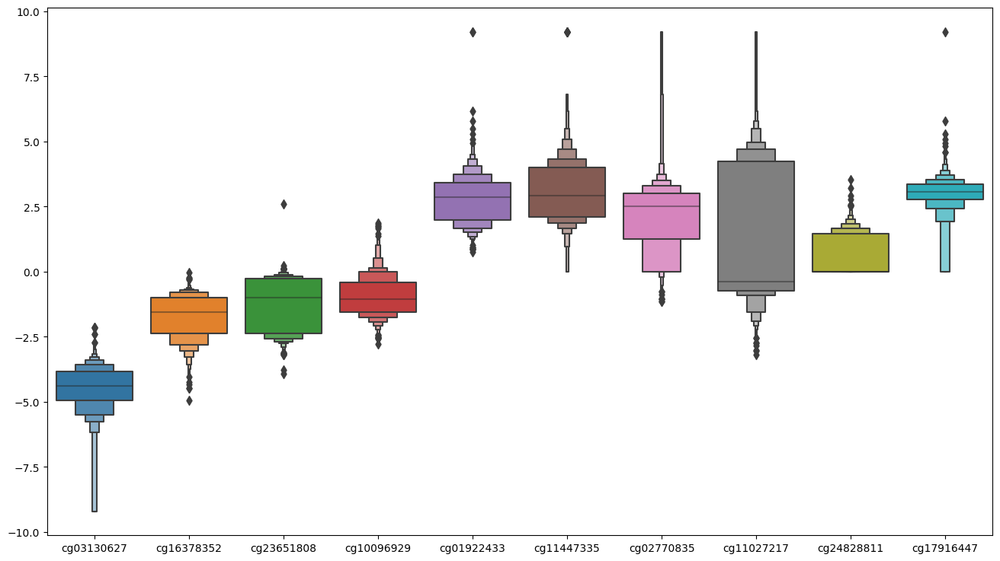

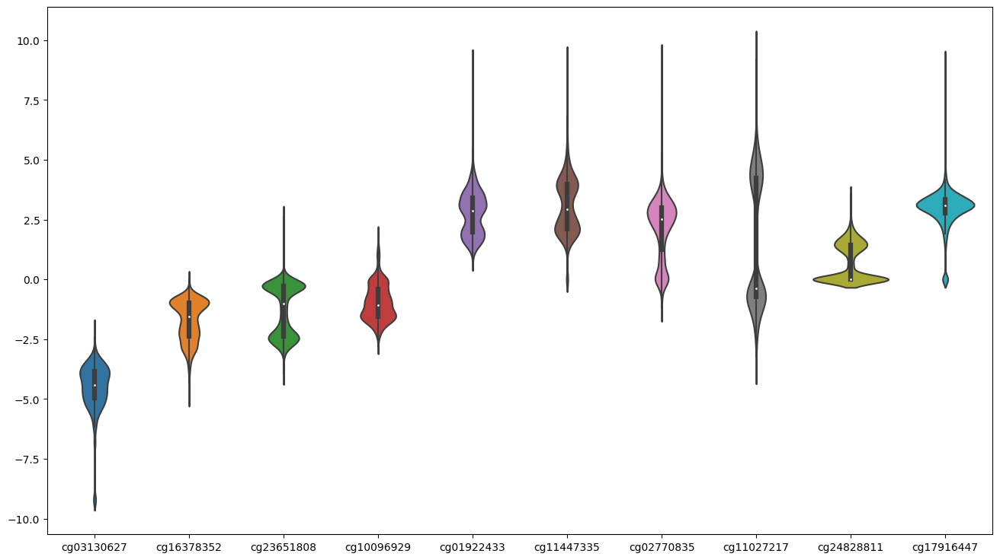

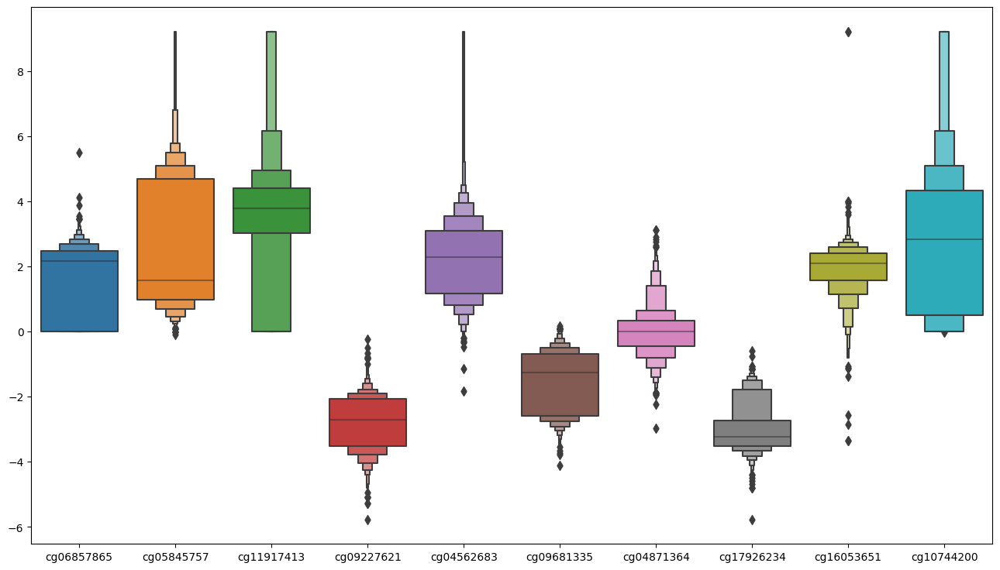

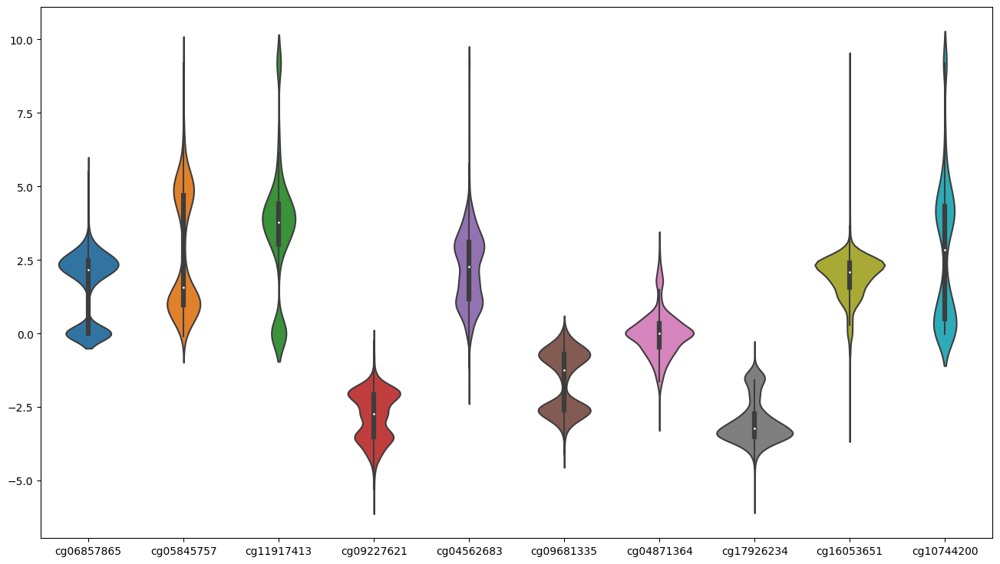

In [7]:
#绘制箱型图和小提琴图
import seaborn as sns
import matplotlib.pyplot as plt
Boxlist1=['cg03130627', 'cg16378352', 'cg23651808', 'cg10096929', 'cg01922433',
         'cg11447335', 'cg02770835', 'cg11027217', 'cg24828811', 'cg17916447']
Boxlist2=['cg06857865', 'cg05845757', 'cg11917413', 'cg09227621', 'cg04562683',
          'cg09681335', 'cg04871364', 'cg17926234', 'cg16053651', 'cg10744200']
Boxlist=[Boxlist1,Boxlist2]    #特征列表
for feature in Boxlist:
    boxplot=plt.figure(figsize=(16,9))
    sns.boxenplot(Data.loc[:,feature])
    plt.show()
    violinplot=plt.figure(figsize=(16,9))
    sns.violinplot(Data.loc[:,feature])
    plt.show()

In [8]:
#监测并替换异常数据
import numpy as np
ModeData=Data.mode().iloc[0,:]    #获取众数数据
CG_Feature=Data.columns[:-7]    #获取甲基化基因数据
for cg in CG_Feature:
    Monitor_data=Data.loc[:,cg]    #提取监测数据
    Q1=np.percentile(Monitor_data,25)    #计算Q1值
    Q3=np.percentile(Monitor_data,75)    #计算Q3值
    IQR=Q3-Q1                            #计算IQR
    lower_bound=Q1-1.5 * IQR    #计算下限  
    upper_bound=Q3+1.5 * IQR     #计算上限
    outlier_value=[]    #存放异常数据
    for value in Monitor_data:    #检测并处理异常数据
        if value<lower_bound or value>upper_bound:
            outlier_value.append(value)    #添加异常数据
    Data[cg]=Monitor_data.replace(outlier_value,ModeData[cg])    #使用众数替换异常数据

统计学分析

In [9]:
#进行正态检验
from pandas import DataFrame
from scipy.stats import normaltest 
CG_Feature=Data.columns[:-7]    #甲基化数据
Normaltest_result=DataFrame()
CG_Data,Normaltest_stats,Normaltest_pvalue=[],[],[]
for cg in CG_Feature:
    cg_data=Data.loc[:,cg]    #获取甲基化数据
    stats,p_value=normaltest(cg_data)    #正态检验
    print('{0}的正态检验统计值为:{1},P值为:{2}'.format(cg,stats,p_value))
    CG_Data.append(cg)
    Normaltest_stats.append(stats)
    Normaltest_pvalue.append(p_value)
Normaltest_result['CG']=CG_Data
Normaltest_result['Stats']=Normaltest_stats
Normaltest_result['P value']=Normaltest_pvalue

cg03130627的正态检验统计值为:121.60109345123041,P值为:3.932403376806012e-27
cg16378352的正态检验统计值为:255.3369809023291,P值为:3.583266291931115e-56
cg23651808的正态检验统计值为:10187.42926262751,P值为:0.0
cg10096929的正态检验统计值为:70.26398674195488,P值为:5.525468924015589e-16
cg01922433的正态检验统计值为:228.841315833679,P值为:2.031139027245449e-50
cg11447335的正态检验统计值为:8.891341468459625,P值为:0.011729236191748883
cg02770835的正态检验统计值为:240.8773350384743,P值为:4.944829125374787e-53
cg11027217的正态检验统计值为:13074.218272150978,P值为:0.0
cg24828811的正态检验统计值为:13064.240072062532,P值为:0.0
cg17916447的正态检验统计值为:897.0515767763571,P值为:1.6133370659455298e-195
cg06857865的正态检验统计值为:5844.747130454151,P值为:0.0
cg05845757的正态检验统计值为:812.0930861126654,P值为:4.531343181549289e-177
cg11917413的正态检验统计值为:382.3395711770166,P值为:9.462742283108893e-84
cg09227621的正态检验统计值为:264.5564423861715,P值为:3.566961812587768e-58
cg04562683的正态检验统计值为:188.57887462246492,P值为:1.1236153768807215e-41
cg09681335的正态检验统计值为:9908.953664593084,P值为:0.0
cg04871364的正态检验统计值为:32.21915638050472,P值为:1.0085538374802976

In [112]:
Normaltest_result.to_excel('/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Normaltest_result.xlsx')    #输出正态检验结果

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


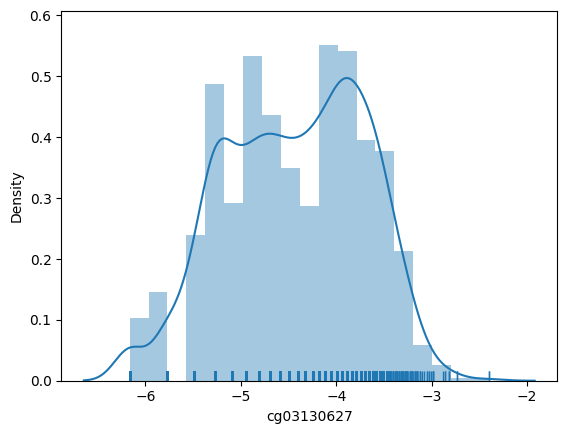

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


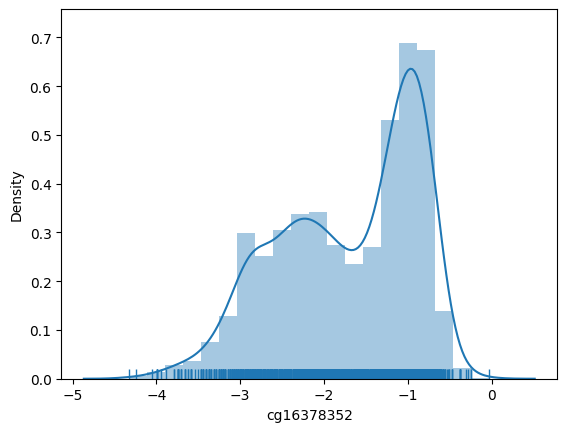

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


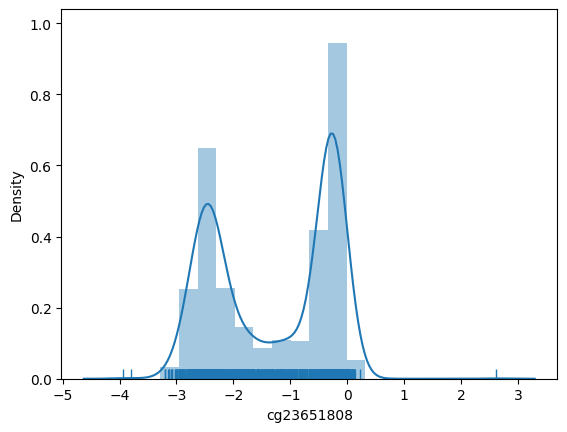

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


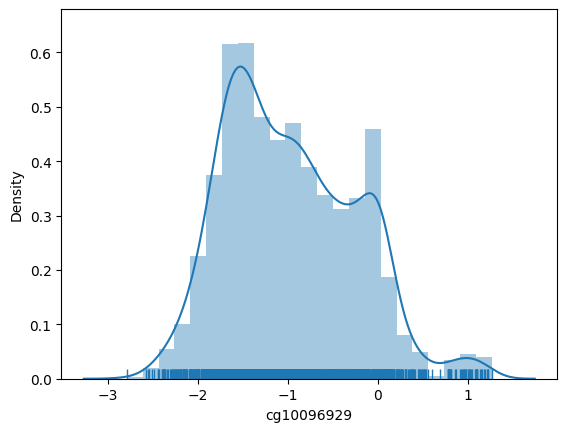

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


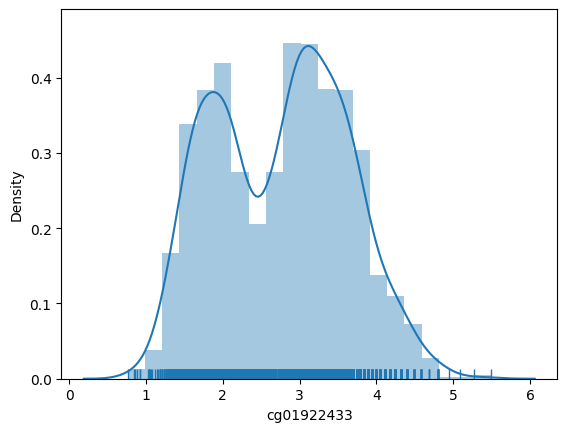

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


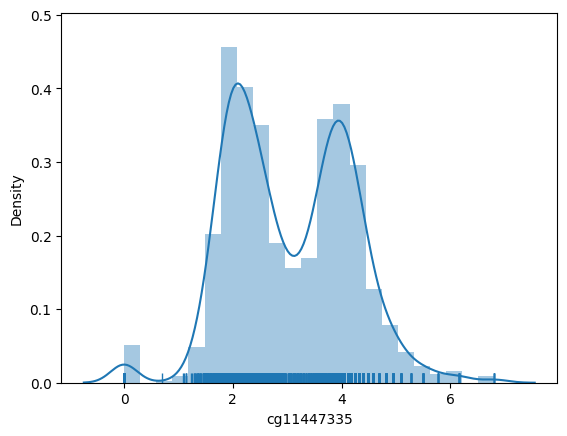

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


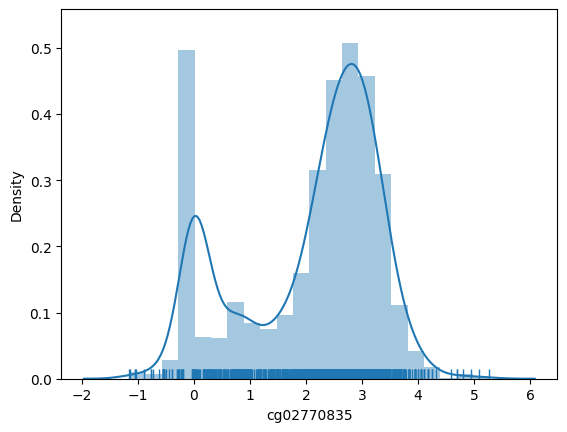

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


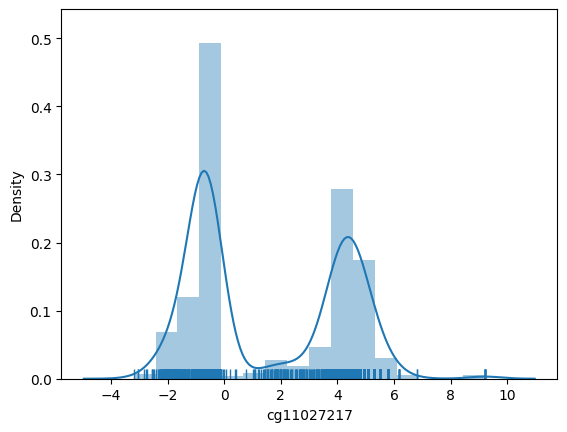

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


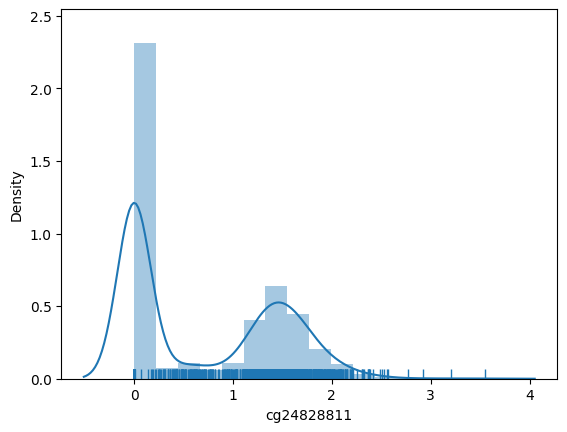

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


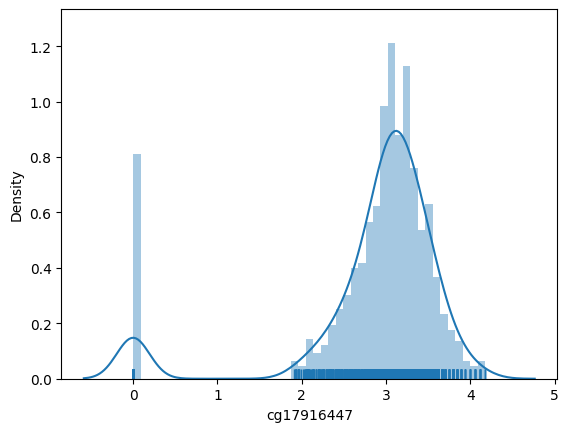

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


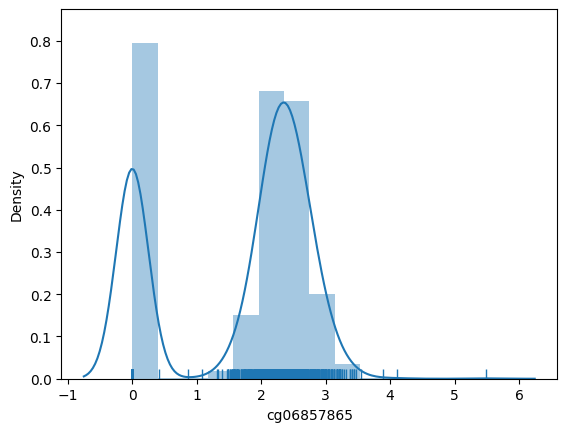

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


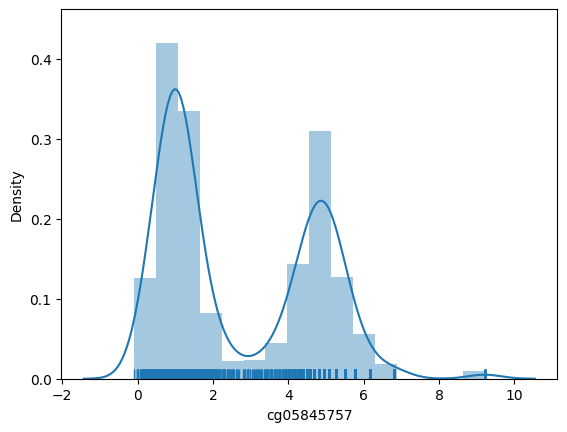

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


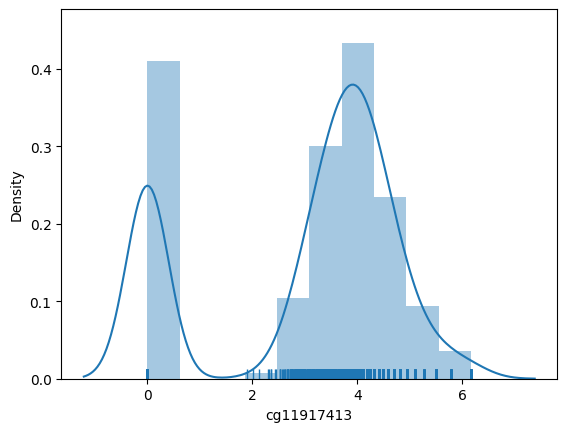

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


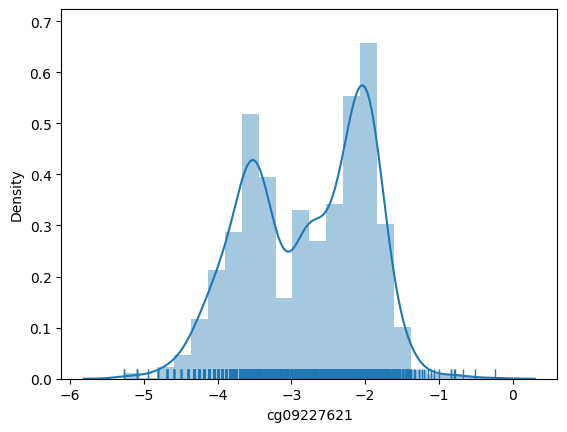

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


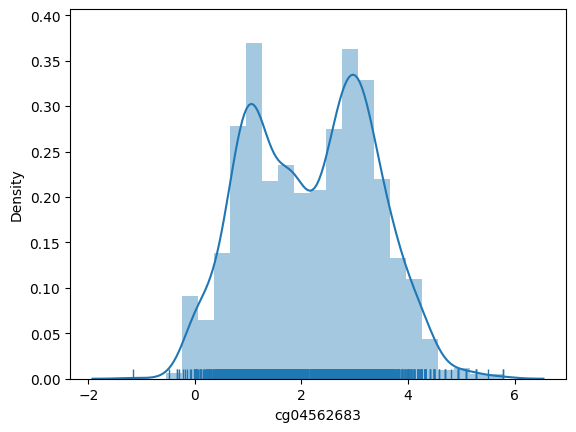

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


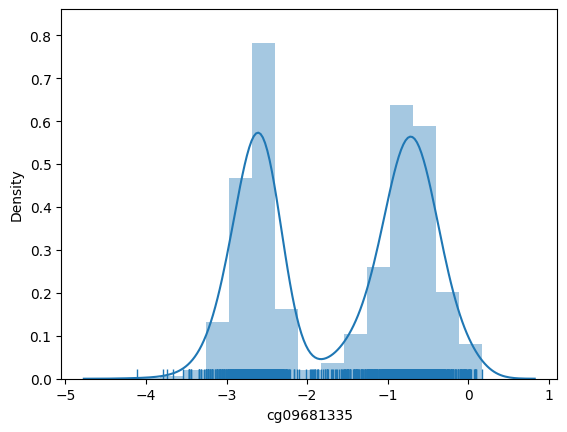

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


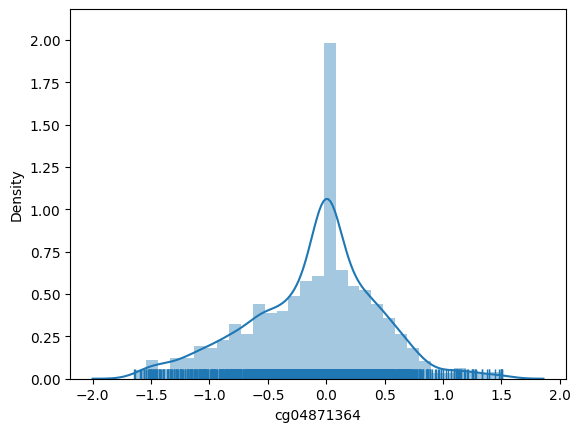

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


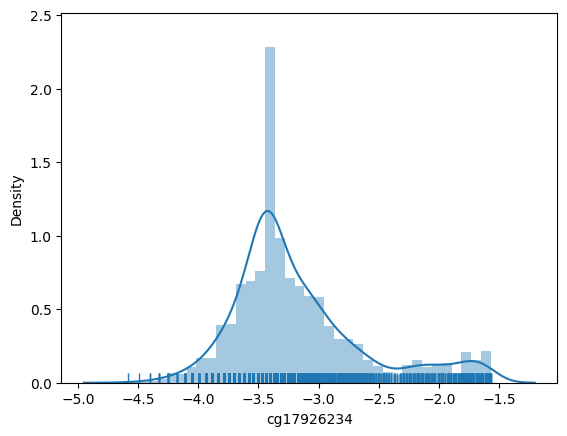

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


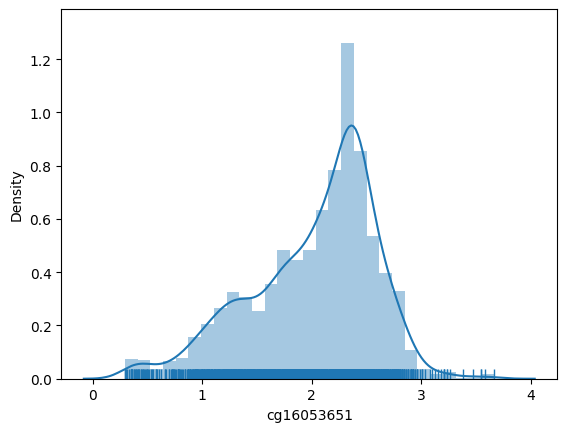

/tmp/ipykernel_19513/201290940.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(cg_data,hist=True,kde=True,rug=True)


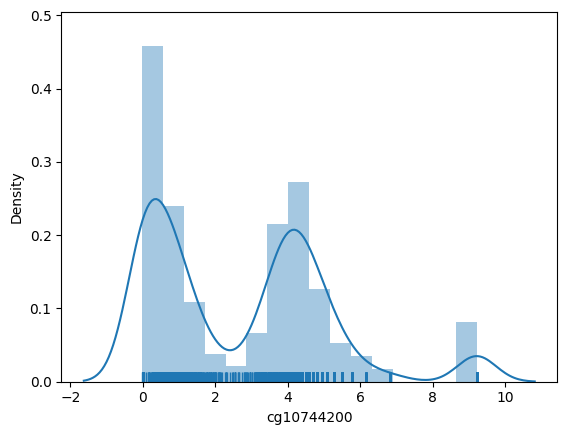

In [11]:
#绘制数据直方图
for cg in CG_Feature:
    cg_data=Data.loc[:,cg]    #获取甲基化数据
    cg_hist=plt.figure()
    sns.distplot(cg_data,hist=True,kde=True,rug=True)
    plt.show()

In [12]:
#对不同类型疾病数据进行方差齐检验、克鲁斯卡尔-沃利斯检验（Kruskal-Wallis Test）[独立样本中位数差异]
#弗里德曼检验（Friedman Test）[重复测量中位数差异]
from scipy.stats import levene,kruskal,friedmanchisquare
Group1=Data.loc[Data['disease_encode']==1,:]    #Alzheimer's disease
Group2=Data.loc[Data['disease_encode']==2,:]    #Graves' disease
Group3=Data.loc[Data['disease_encode']==3,:]    #Huntington's disease
Group4=Data.loc[Data['disease_encode']==4,:]    #Parkinson's disease
Group5=Data.loc[Data['disease_encode']==5,:]    #rheumatoid arthritis
Group6=Data.loc[Data['disease_encode']==6,:]    #schizophrenia
Group7=Data.loc[Data['disease_encode']==7,:]    #Sjogren's syndrome
Group8=Data.loc[Data['disease_encode']==8,:]    #stroke
Group9=Data.loc[Data['disease_encode']==9,:]    #type 2 diabetes
Groups=[Group1,Group2,Group3,Group4,Group5,Group6,Group7,Group8,Group9]    ##疾病数据整合
CG_List=Data.columns[:-7]    #CG数据
CG_list=[]    #加载CG数据
levene_stats_list,levene_pvalue_list=[],[]    #方差齐检验
kruskal_stats_list,kruskal_pvalue_list=[],[]    #克鲁斯卡尔-沃利斯检验
stats_test=DataFrame()    #存放统计学检验结果
for cg in CG_List:
    Group1_cg=Group1.loc[:,cg]    #获取疾病CG数据
    Group2_cg=Group2.loc[:,cg]    #获取疾病CG数据
    Group3_cg=Group3.loc[:,cg]    #获取疾病CG数据
    Group4_cg=Group4.loc[:,cg]    #获取疾病CG数据
    Group5_cg=Group5.loc[:,cg]    #获取疾病CG数据
    Group6_cg=Group6.loc[:,cg]    #获取疾病CG数据
    Group7_cg=Group7.loc[:,cg]    #获取疾病CG数据
    Group8_cg=Group8.loc[:,cg]    #获取疾病CG数据
    Group9_cg=Group9.loc[:,cg]    #获取疾病CG数据
    Groups_cg=[Group1_cg,Group2_cg,Group3_cg,Group4_cg,Group5_cg,Group6_cg,Group7_cg,Group8_cg,Group9_cg]
    levene_stats,levene_pvalue=levene(*Groups_cg)    #方差齐检验
    levene_stats_list.append(levene_stats)
    levene_pvalue_list.append(levene_pvalue)
    kruskal_stats,kruskal_pvalue=kruskal(*Groups_cg)    #克鲁斯卡尔-沃利斯检验
    kruskal_stats_list.append(kruskal_stats)
    kruskal_pvalue_list.append(kruskal_pvalue)
    CG_list.append(cg)
stats_test['CG']=CG_list
stats_test['Levene Stats']=levene_stats_list    #方差齐性
stats_test['Levene Pvalue']=levene_pvalue_list
stats_test['Kruskal-Wallis Stats']=kruskal_stats_list    #鲁斯卡尔-沃利斯检验
stats_test['Kruskal-Wallis Pvalue']=kruskal_pvalue_list
stats_test

,CG,Levene Stats,Levene Pvalue,Kruskal-Wallis Stats,Kruskal-Wallis Pvalue
0,cg03130627,7.495806,6.820114e-10,752.613924,3.341221e-157
1,cg16378352,14.728559,4.319974e-21,663.615154,4.855573e-138
2,cg23651808,31.160682,2.588221e-46,944.576292,1.364884e-198
3,cg10096929,17.137203,7.746386e-25,688.517681,2.121189e-143
4,cg01922433,38.110575,1.158683e-56,1035.128162,3.899748e-218
5,cg11447335,28.594126,1.939398e-42,851.238179,1.853339e-178
6,cg02770835,46.932693,1.719839e-69,603.643485,3.853957e-125
7,cg11027217,26.746783,1.240200e-39,1012.867538,2.492302e-213
8,cg24828811,72.802569,3.667303e-105,396.966782,8.343731e-81
9,cg17916447,67.918253,1.215792e-98,311.617937,1.383692e-62


In [113]:
stats_test.to_excel('/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/DiseaseStatstest_Result.xlsx')    #输出不同疾病数据统计学检验结果

对疾病数据性别差异进行检验

In [130]:
#对疾病数据甲基化表达性别差异进行分析
GenderDiffer=DataFrame()
DiseaseName,CGList=[],[]
MannWhitneyU_stats,MannWhitneyU_pvalue=[],[]
Kruskal_stats,Kruskal_pvalue=[],[]
for Group in Groups:    #疾病数据
    for cg in CG_List:    #CG数据
        Disease_F=Group.loc[Group['gender']=='F',cg]
        Disease_M=Group.loc[Group['gender']=='M',cg]
        mannwhitneyu_stats,mannwhitneyu_pvalue=mannwhitneyu(Disease_F,Disease_M)
        kruskal_stats,kruskal_pvalue=kruskal(Disease_F,Disease_M)
        if mannwhitneyu_pvalue<0.05 or kruskal_pvalue<0.05:
            diseasename=Group.iloc[0,-4]    #获取疾病数据
            DiseaseName.append(diseasename)
            CGList.append(cg)
            MannWhitneyU_stats.append(mannwhitneyu_stats)
            MannWhitneyU_pvalue.append(mannwhitneyu_pvalue)
            Kruskal_stats.append(kruskal_stats)
            Kruskal_pvalue.append(kruskal_pvalue)
GenderDiffer['Disease Name']=DiseaseName
GenderDiffer['CG']=CGList
GenderDiffer['MannWhitney U stats']=MannWhitneyU_stats
GenderDiffer['MannWhitney U pvalue']=MannWhitneyU_pvalue
GenderDiffer['Kruskal stats']=Kruskal_stats
GenderDiffer['Kruskal pavlue']=Kruskal_pvalue
GenderDiffer

,Disease Name,CG,MannWhitney U stats,MannWhitney U pvalue,Kruskal stats,Kruskal pavlue
0,Alzheimer's disease,cg23651808,52827.0,0.025163,5.013488,0.025151
1,Alzheimer's disease,cg04562683,66218.5,0.006174,7.499686,0.006171
2,Graves' disease,cg11027217,311.0,0.012587,6.282695,0.012192
3,Graves' disease,cg17916447,326.0,0.004630,8.082487,0.004470
4,Huntington's disease,cg04562683,1679.0,0.035758,4.418166,0.035558
5,Huntington's disease,cg09681335,2599.5,0.038070,4.311328,0.037859
6,Parkinson's disease,cg10096929,9974.5,0.032063,4.598608,0.031998
7,rheumatoid arthritis,cg10096929,3114.5,0.016172,5.793409,0.016086
8,rheumatoid arthritis,cg24828811,2378.0,0.020336,5.429497,0.019799
9,rheumatoid arthritis,cg16053651,3218.5,0.004981,7.897232,0.004951


In [131]:
GenderDiffer.to_excel('/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/GenderDiffer.xlsx')

In [114]:
#对数据进行方差齐检验、克鲁斯卡尔-沃利斯检验（Kruskal-Wallis Test）[独立样本中位数差异]
#弗里德曼检验（Friedman Test）[重复测量中位数差异]
from scipy.stats import levene,kruskal,friedmanchisquare
CG1=Data.loc[:,'cg03130627']
CG2=Data.loc[:,'cg16378352']
CG3=Data.loc[:,'cg23651808']
CG4=Data.loc[:,'cg10096929']
CG5=Data.loc[:,'cg01922433']
CG6=Data.loc[:,'cg11447335']
CG7=Data.loc[:,'cg02770835']
CG8=Data.loc[:,'cg11027217']
CG9=Data.loc[:,'cg24828811']
CG10=Data.loc[:,'cg17916447']
CG11=Data.loc[:,'cg06857865']
CG12=Data.loc[:,'cg05845757']
CG13=Data.loc[:,'cg11917413']
CG14=Data.loc[:,'cg09227621']
CG15=Data.loc[:,'cg04562683']
CG16=Data.loc[:,'cg09681335']
CG17=Data.loc[:,'cg04871364']
CG18=Data.loc[:,'cg17926234']
CG19=Data.loc[:,'cg16053651']
CG20=Data.loc[:,'cg10744200']
Group_CG=[CG1,CG2,CG3,CG4,CG5,CG6,CG7,CG8,CG9,CG10,CG11,CG12,CG13,CG14,CG15,CG16,CG17,CG18,CG19,CG20]
levene_stats,levene_pvalue=levene(*Group_CG)    #方差齐检验
print('方差齐检验统计量为:{0},P值为:{1}'.format(levene_stats,levene_pvalue,))
kruskal_stats,kruskal_pvalue=kruskal(*Group_CG)    #克鲁斯卡尔-沃利斯检验
print('克鲁斯卡尔-沃利斯检验统计量为:{0},P值为:{1}'.format(kruskal_stats,kruskal_pvalue))
friedman_stats,friedman_pavlue=friedmanchisquare(CG1,CG2,CG3,CG4,CG5,CG6,CG7,CG8,CG9,CG10,CG11,CG12,
                                                 CG13,CG14,CG15,CG16,CG17,CG18,CG19,CG20)    #弗里德曼检验
print('弗里德曼检验结果为:{0},P值为:{1}'.format(friedman_stats,friedman_pavlue))

方差齐检验统计量为:764.489762396425,P值为:0.0
克鲁斯卡尔-沃利斯检验统计量为:30123.05228582892,P值为:0.0
弗里德曼检验结果为:28966.001509791,P值为:0.0


In [15]:
#对数据执行曼-惠尼特 U检验[比较两个独立样本的中位数差异]
from scipy.stats import mannwhitneyu
MannWhitney_result=DataFrame()
MannWhitney_CG,MannWhitney_stats,MannWhitney_pvalue=[],[],[]
for CG_data,cg in zip(Group_CG,CG_Feature): 
    print('--------------------曼-惠尼特 U检验--------------------')
    Mann_whitney_stats,Mann_whityney_pvalue=mannwhitneyu(CG_data,Data.loc[:,'disease_encode'])
    print('{0}曼-惠尼特U检验统计量为:{1},P值为:{2}'.format(cg,Mann_whitney_stats,Mann_whityney_pvalue))
    MannWhitney_CG.append(cg)
    MannWhitney_stats.append(Mann_whitney_stats)
    MannWhitney_pvalue.append(Mann_whityney_pvalue)
MannWhitney_result['CG']=MannWhitney_CG
MannWhitney_result['Stats']=MannWhitney_stats
MannWhitney_result['P value']=MannWhitney_pvalue

--------------------曼-惠尼特 U检验--------------------
cg03130627曼-惠尼特U检验统计量为:0.0,P值为:0.0
--------------------曼-惠尼特 U检验--------------------
cg16378352曼-惠尼特U检验统计量为:0.0,P值为:0.0
--------------------曼-惠尼特 U检验--------------------
cg23651808曼-惠尼特U检验统计量为:795.0,P值为:0.0
--------------------曼-惠尼特 U检验--------------------
cg10096929曼-惠尼特U检验统计量为:14740.0,P值为:0.0
--------------------曼-惠尼特 U检验--------------------
cg01922433曼-惠尼特U检验统计量为:1681076.0,P值为:9.029876413791778e-13
--------------------曼-惠尼特 U检验--------------------
cg11447335曼-惠尼特U检验统计量为:1777974.0,P值为:1.0181471039962841e-05
--------------------曼-惠尼特 U检验--------------------
cg02770835曼-惠尼特U检验统计量为:1239727.0,P值为:1.953632195251462e-85
--------------------曼-惠尼特 U检验--------------------
cg11027217曼-惠尼特U检验统计量为:1034038.0,P值为:3.899162105953011e-142
--------------------曼-惠尼特 U检验--------------------
cg24828811曼-惠尼特U检验统计量为:613597.0,P值为:1.601818624995433e-308
--------------------曼-惠尼特 U检验--------------------
cg17916447曼-惠尼特U检验统计量为:1608149.0,P值为:3.562162008362434e-2

In [115]:
MannWhitney_result.to_excel('/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/MannWhitney_result.xlsx')    #输出曼-惠尼特检验结果 

绘制可视化数据图

In [17]:
#对性别数据进行卡方检验-性别与遗传病不独立
from scipy.stats import chi2_contingency
GenderX2=Data.loc[:,'gender']    #获取性别数据
DiseaseX2=Data.loc[:,'disease']    #获取疾病数据
CrossTab=pd.crosstab(GenderX2,DiseaseX2)    #创建交叉表
X2_value,X2_pvalue,X2_df,X2_expected=chi2_contingency(CrossTab)    #卡方检验
print('卡方检验卡方值为:{0},P值为:{1},自由度为:{2}'.format(X2_value,X2_pvalue,X2_df))

卡方检验卡方值为:200.10826932136266,P值为:6.0629061327721e-39,自由度为:8


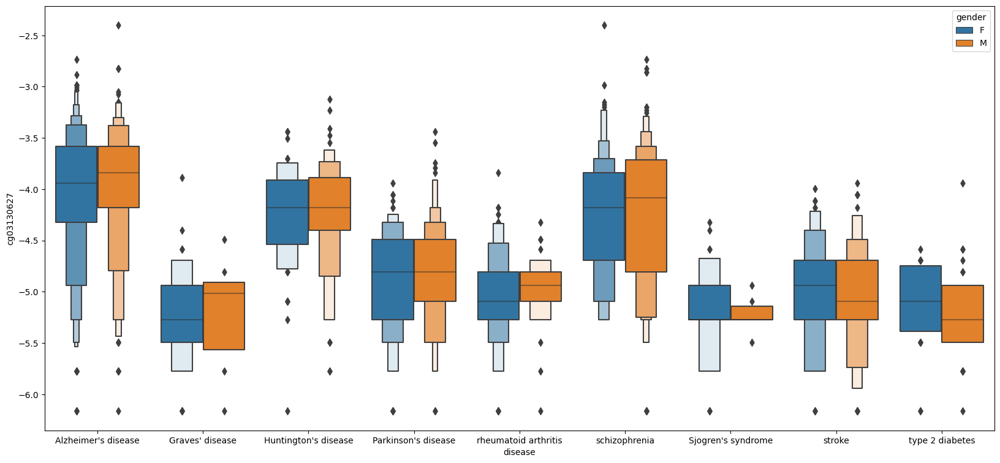

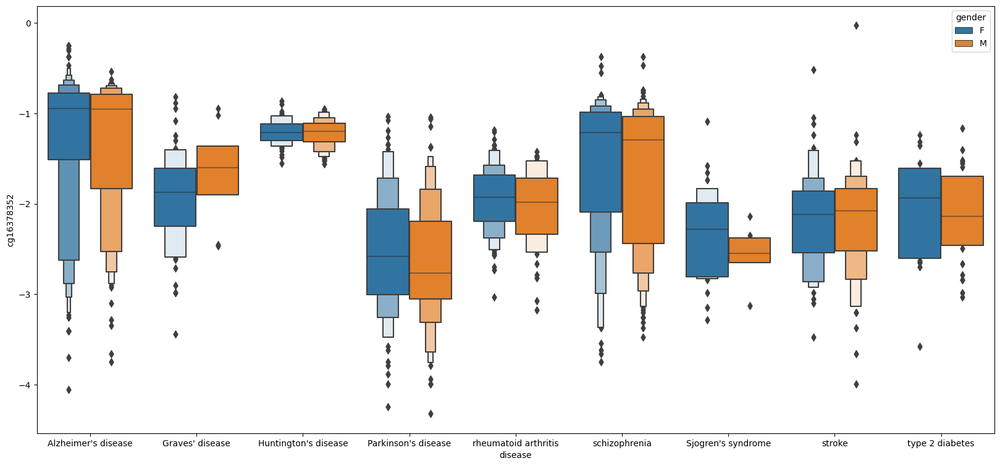

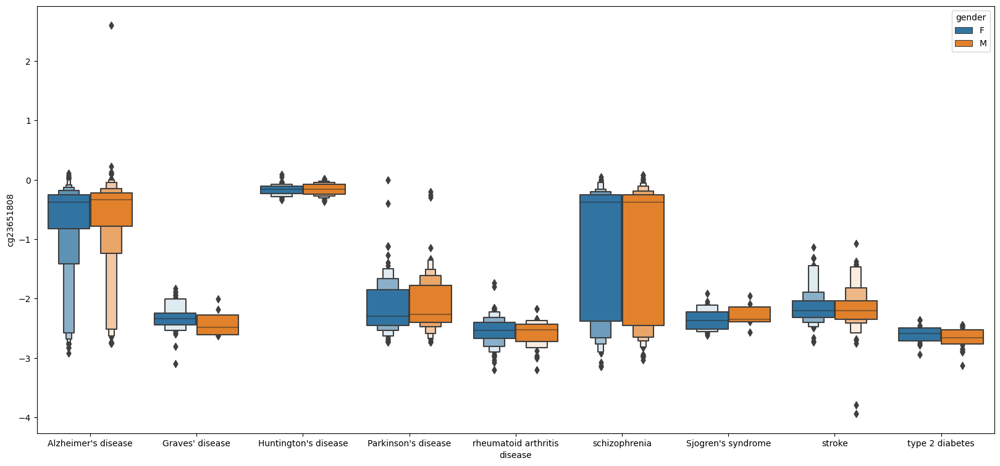

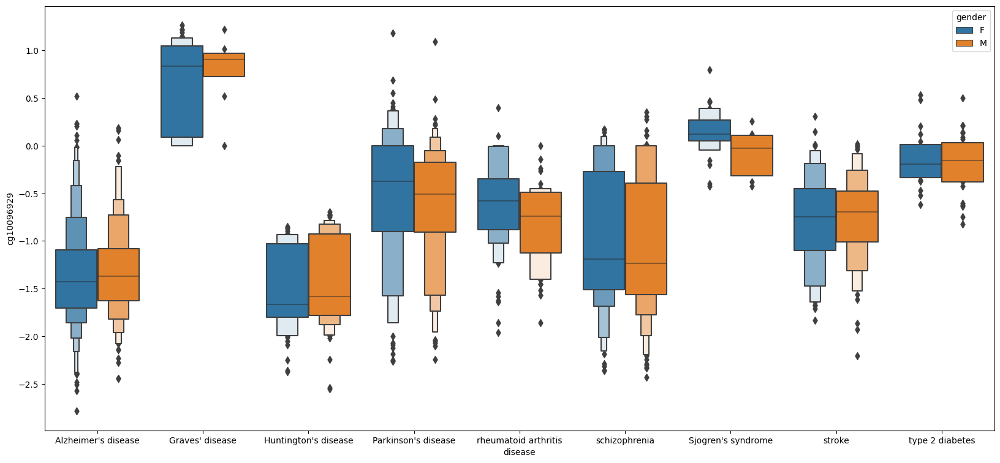

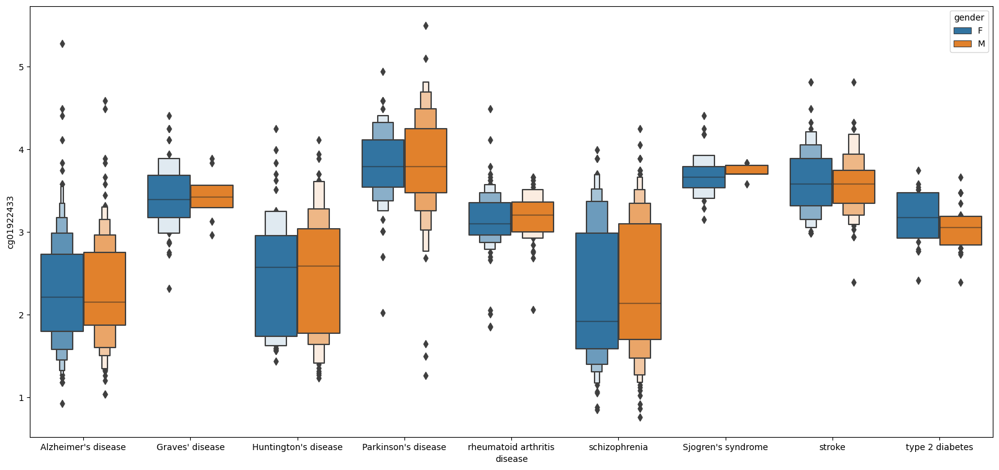

...

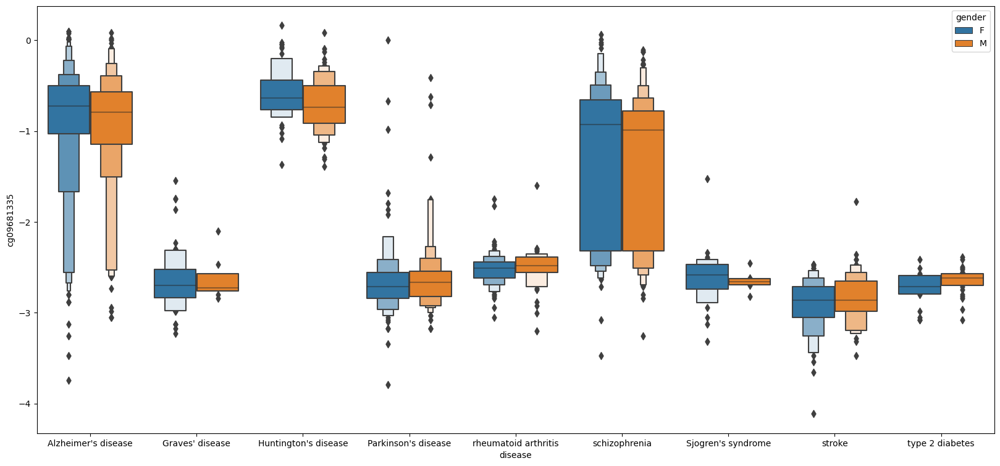

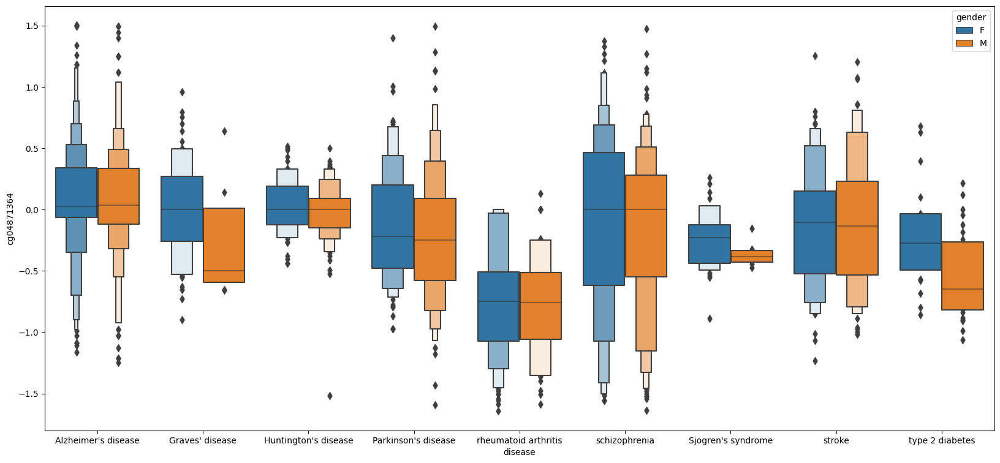

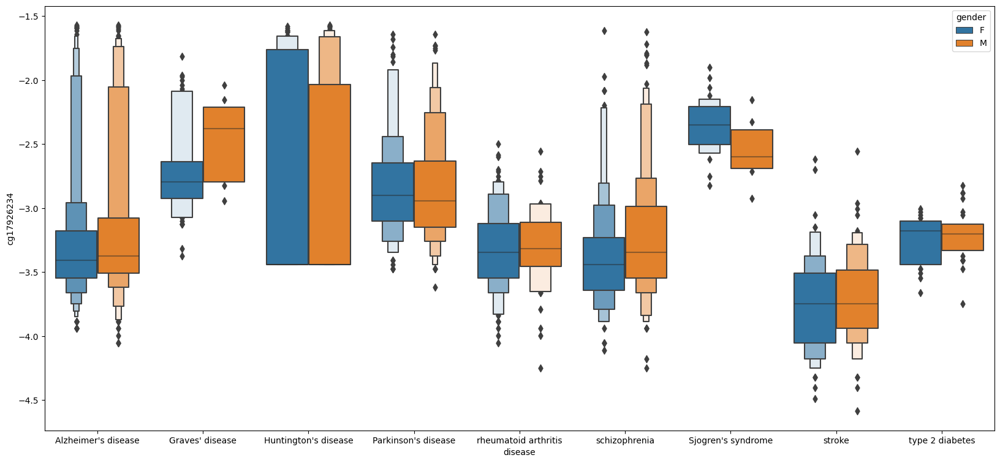

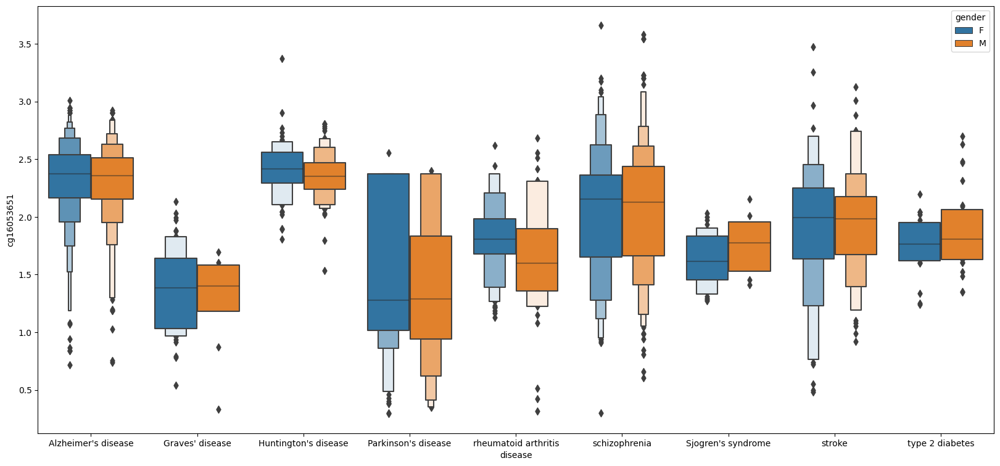

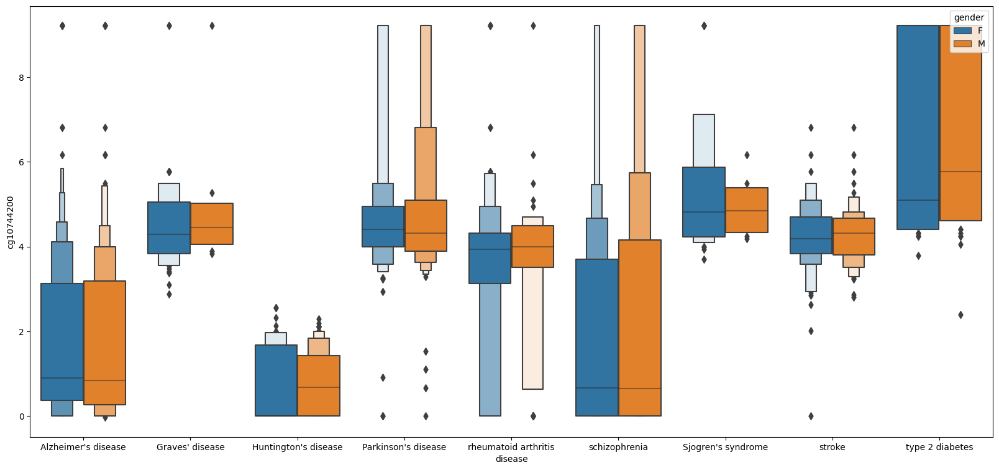

In [18]:
#绘制数据箱型图
for cg in CG_Feature:
    boxplot=plt.figure(figsize=(20,9))
    sns.boxenplot(x='disease',y=cg,data=Data,hue='gender')    #使用性别数据作为区分标准
    plt.show()

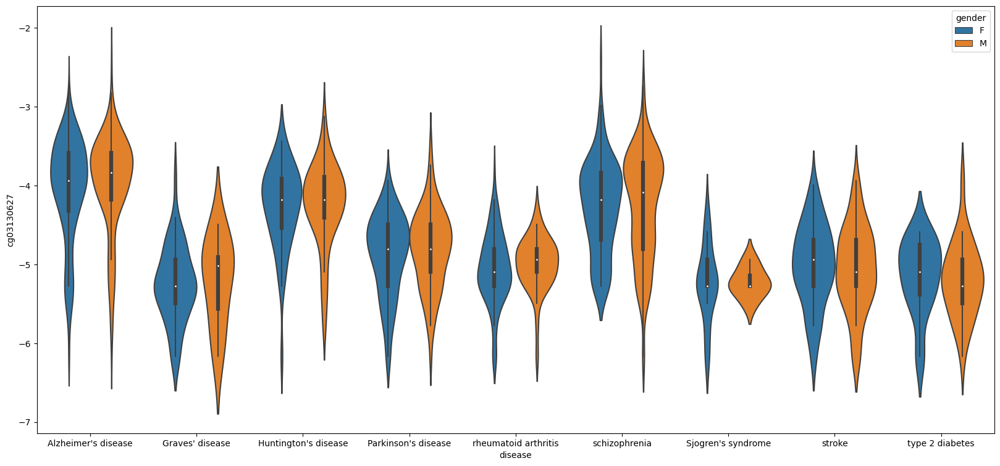

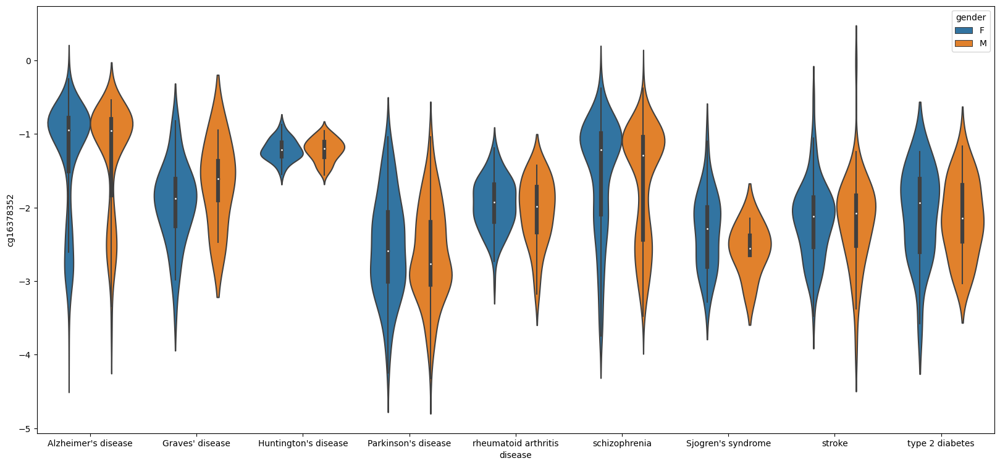

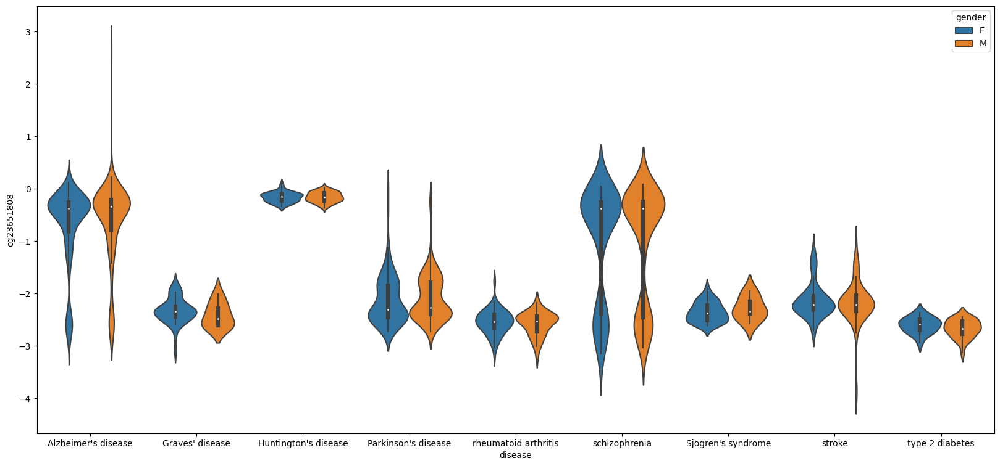

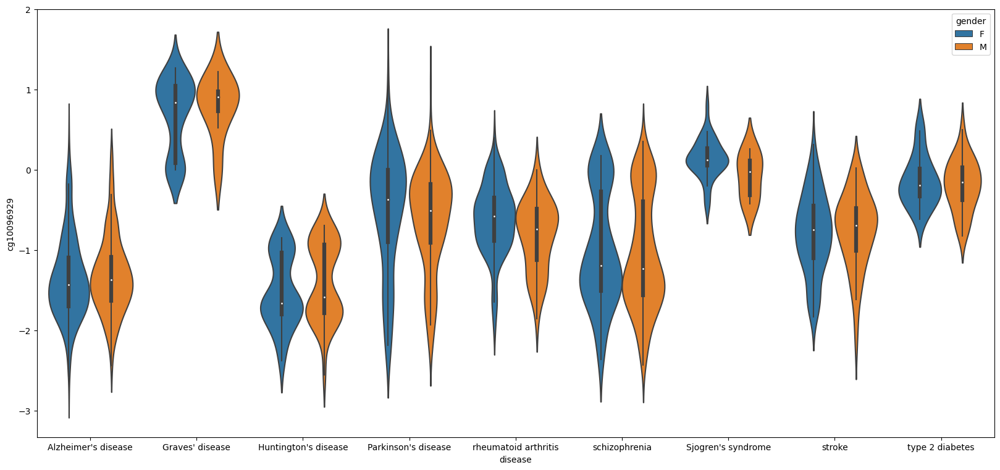

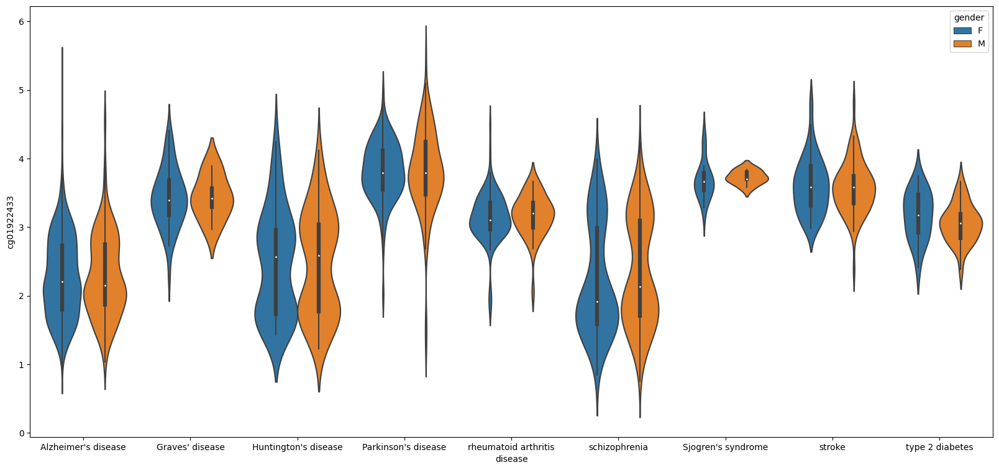

...

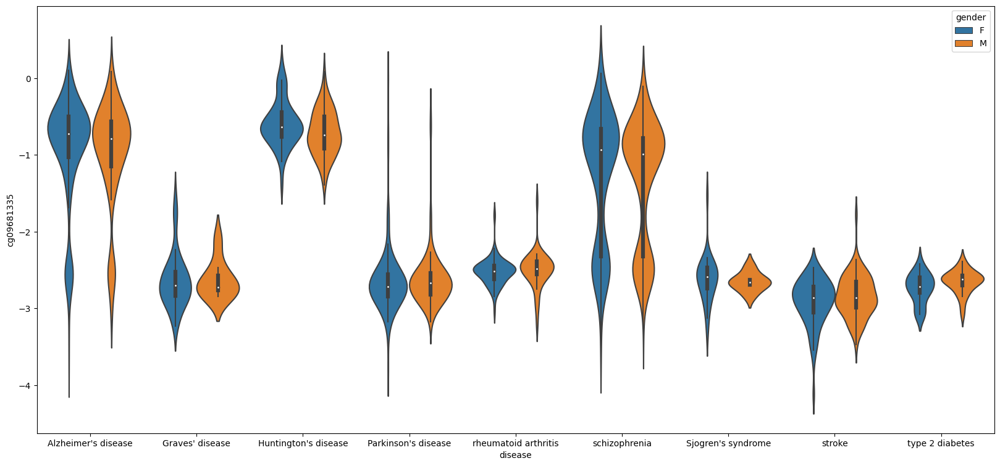

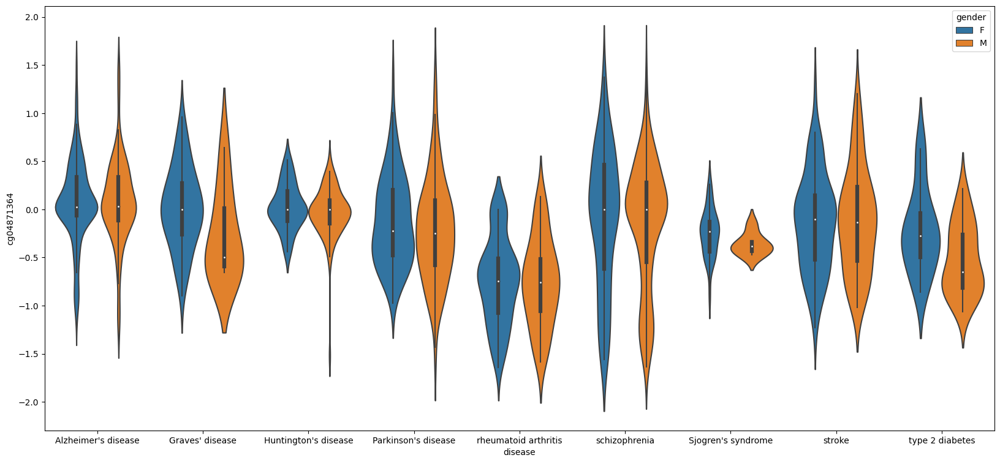

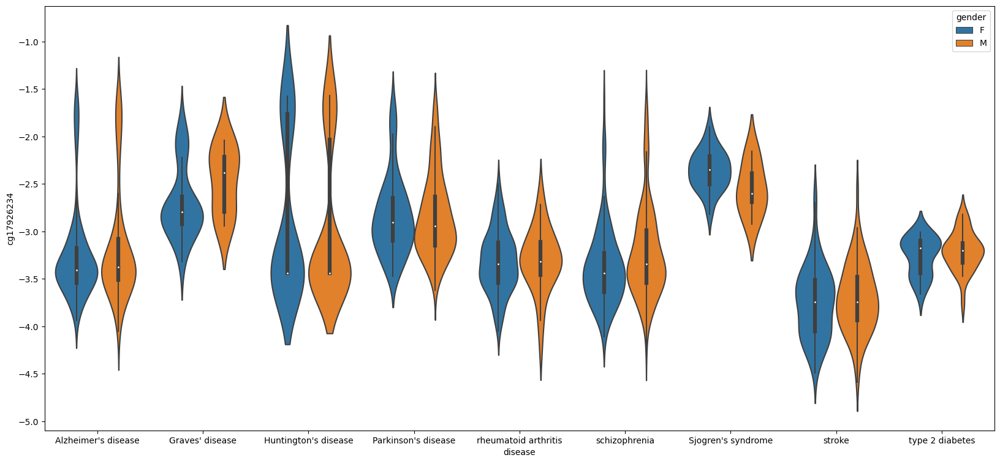

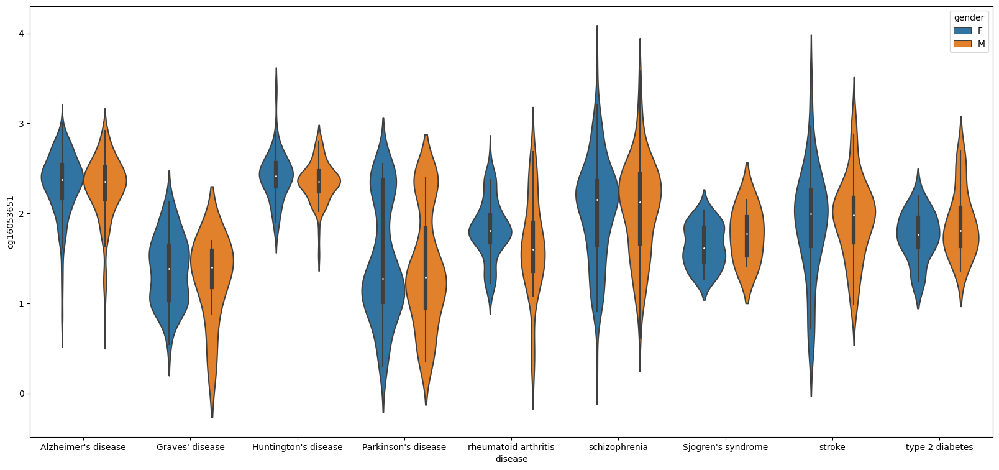

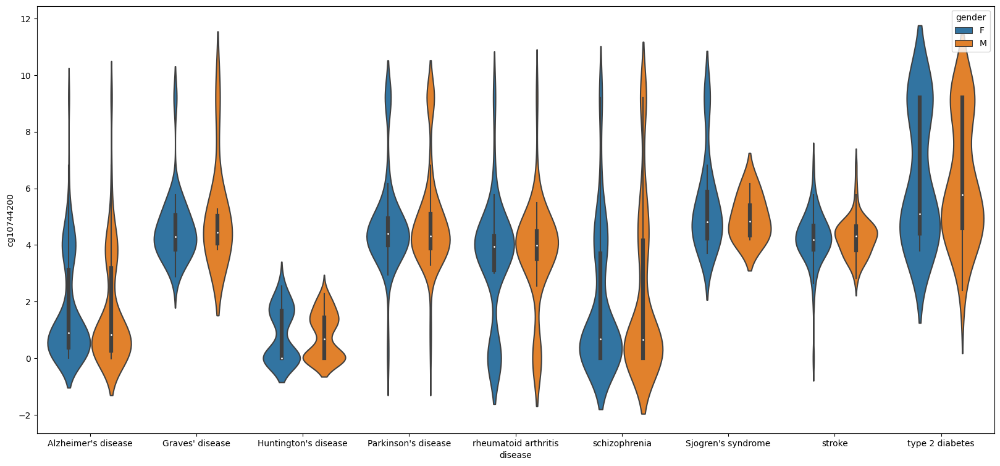

In [19]:
#绘制数据小提琴图
for cg in CG_Feature:
    violinplot=plt.figure(figsize=(20,9))
    sns.violinplot(x='disease',y=cg,data=Data,hue='gender')
    plt.show()

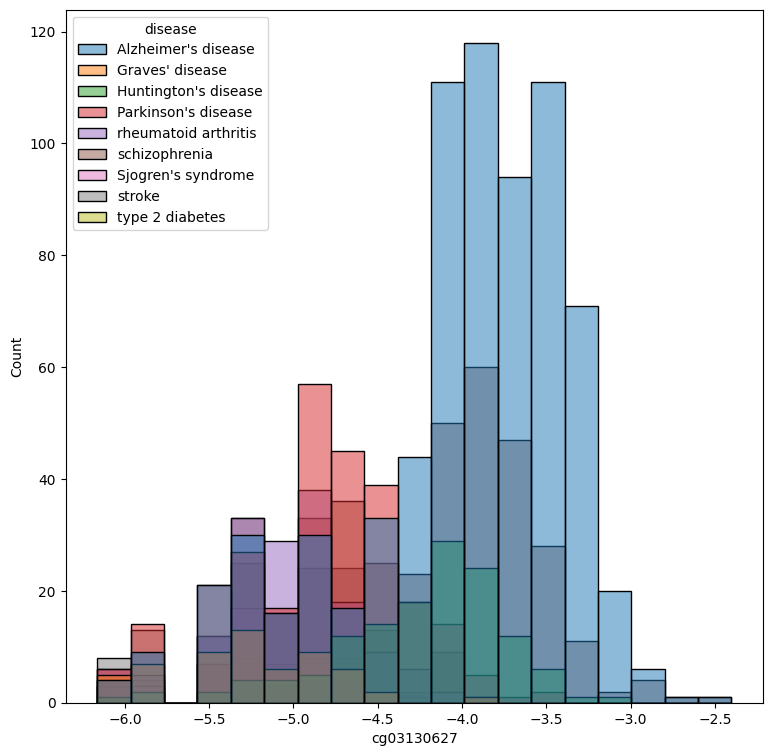

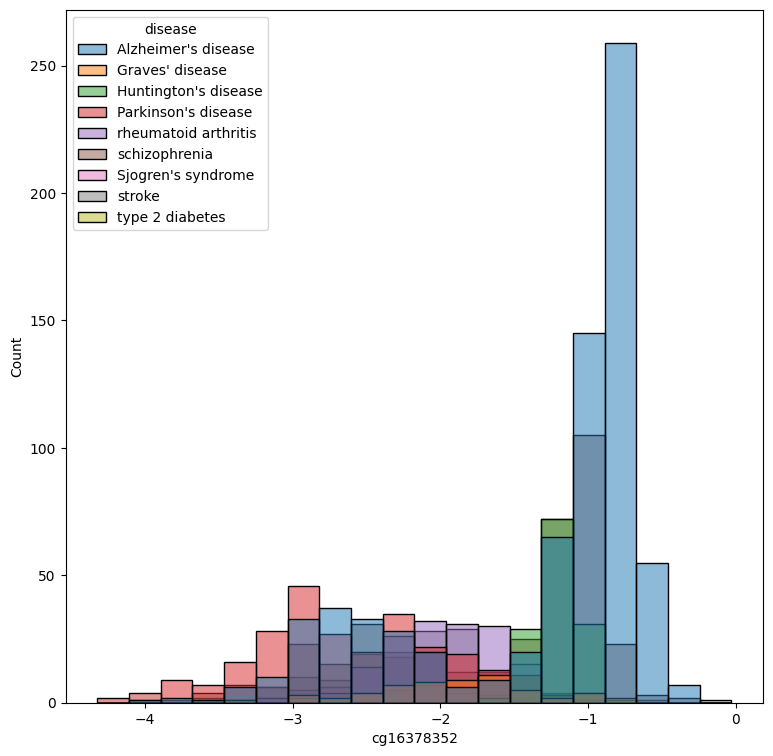

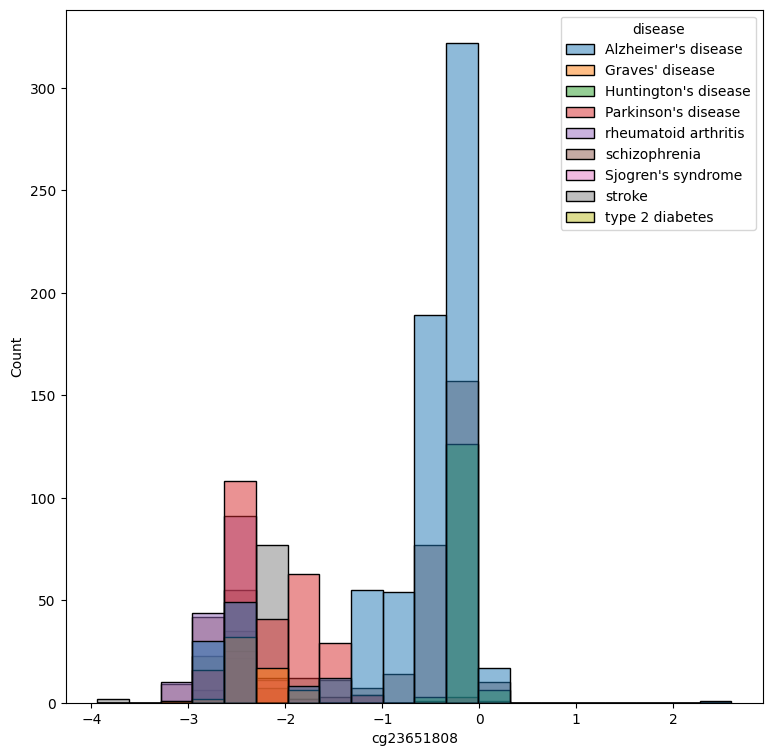

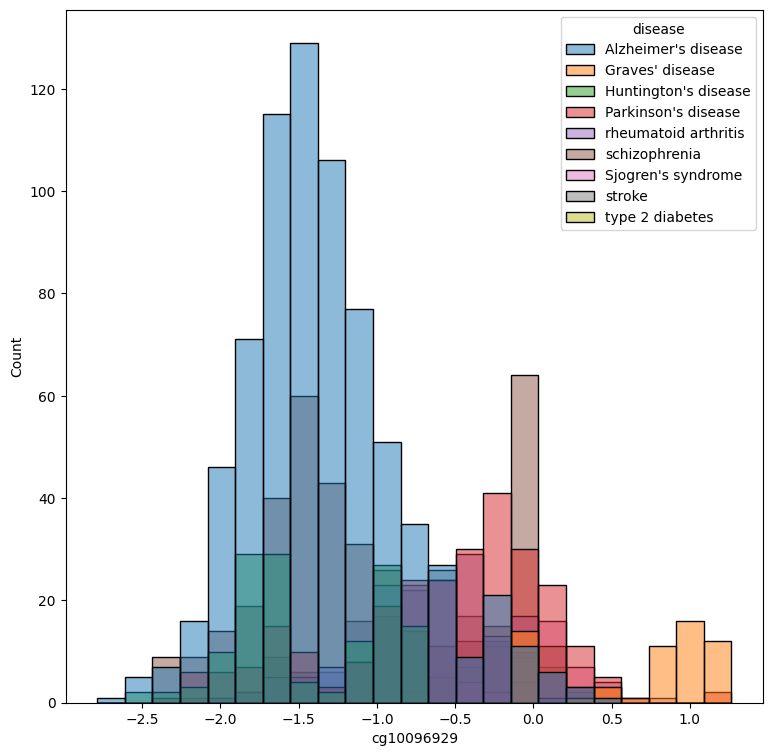

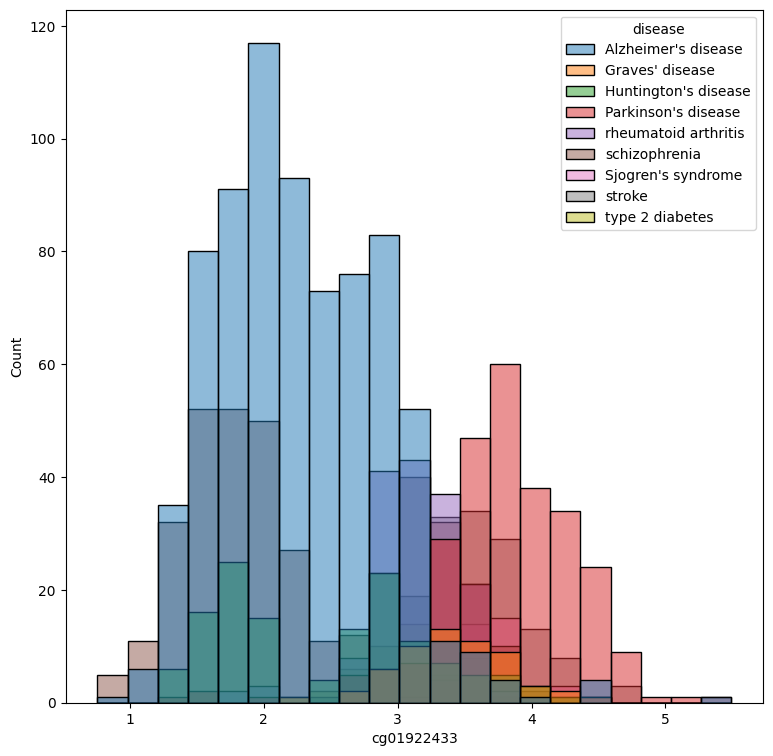

...

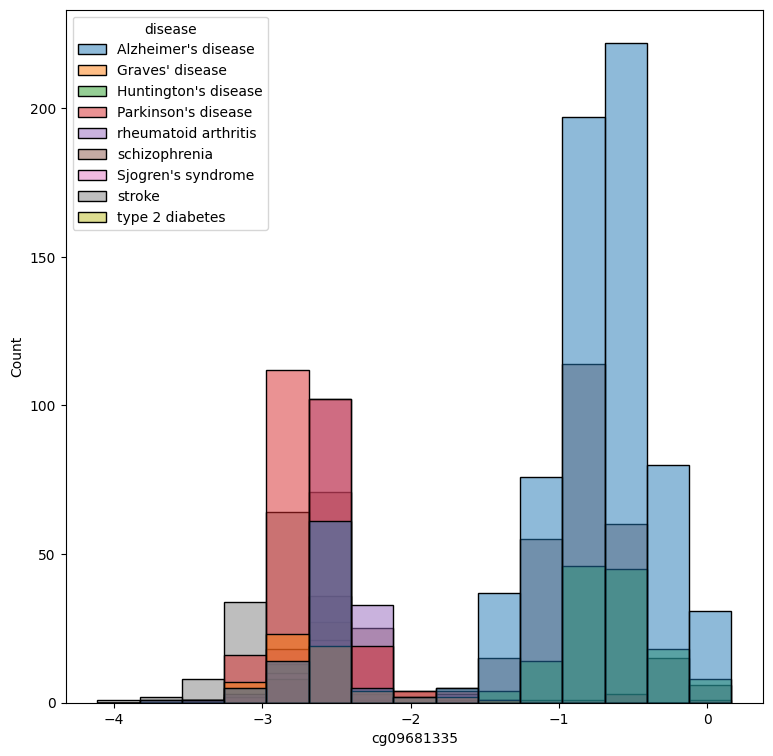

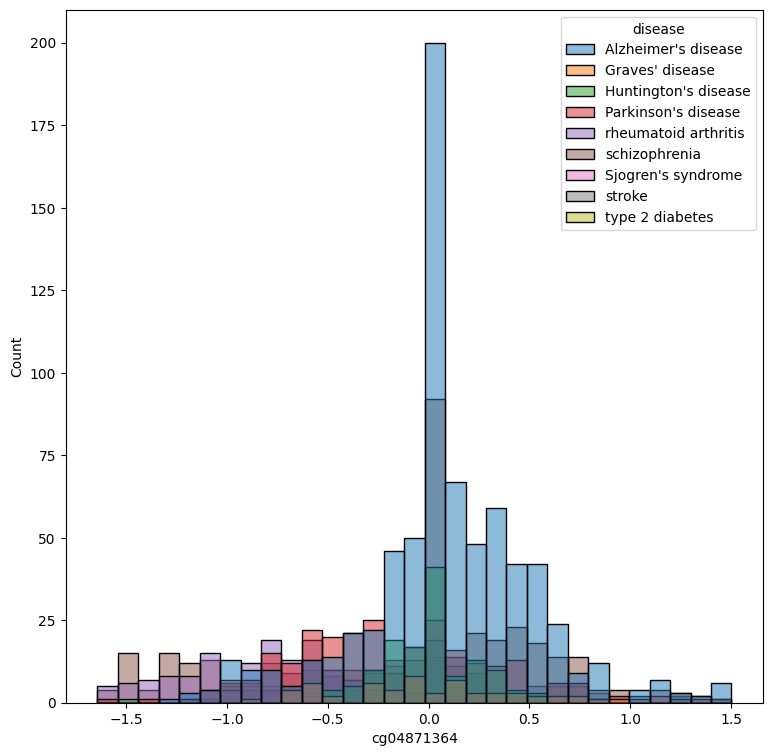

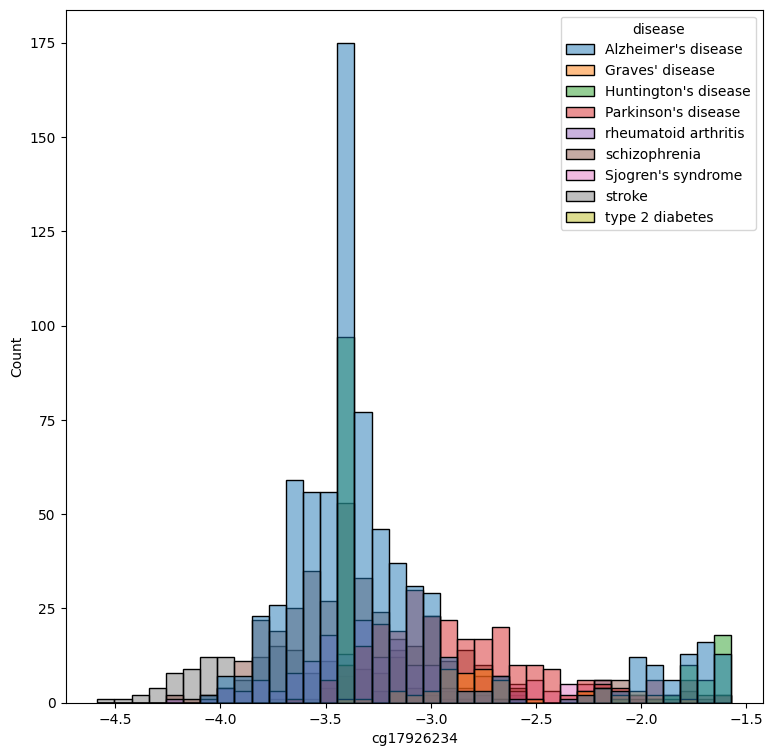

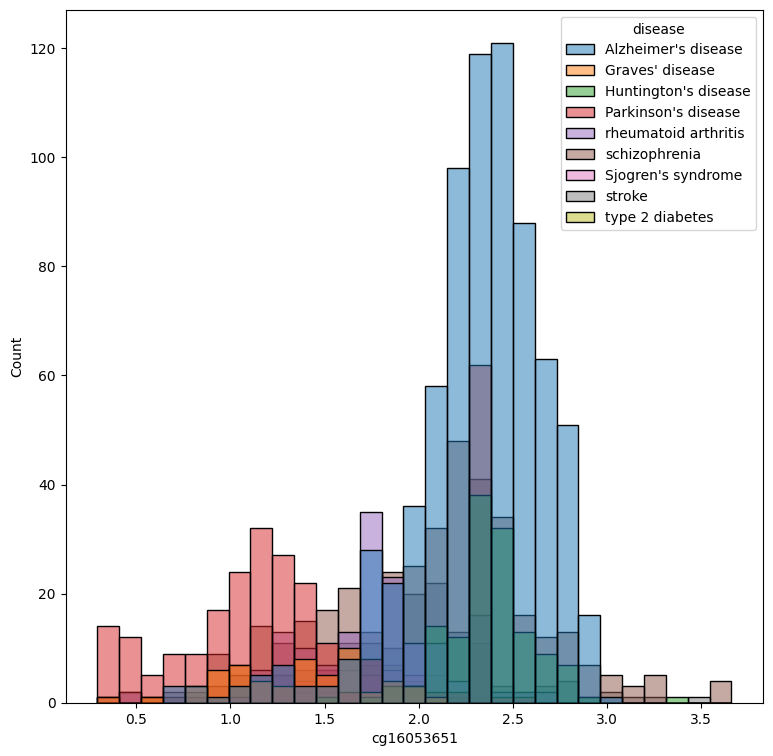

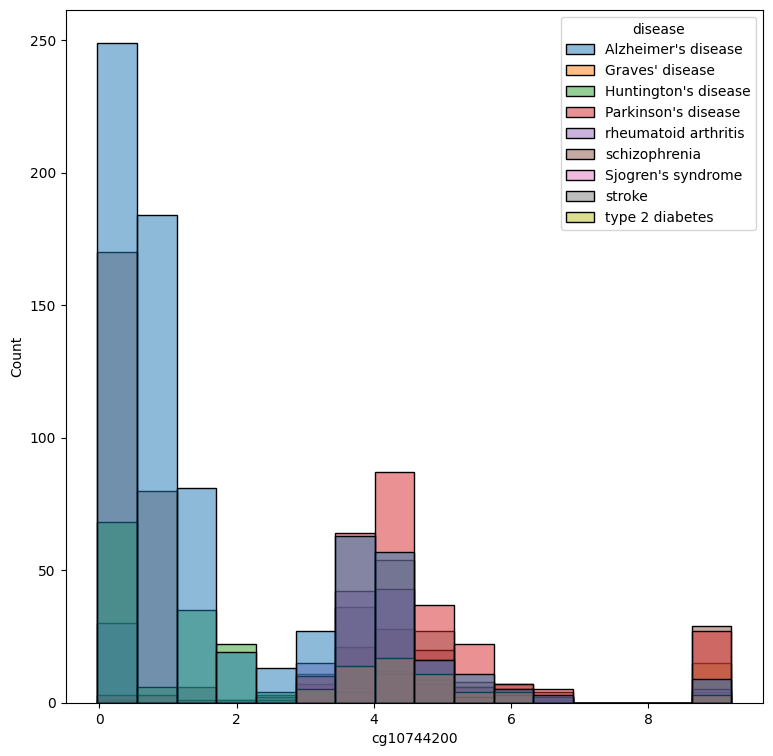

In [25]:
#绘制数据直方图
for cg in CG_Feature:
    cg_hist=plt.figure(figsize=(9,9))
    sns.histplot(x=cg,data=Data,hue='disease')
    plt.show()

<Figure size 900x900 with 0 Axes>

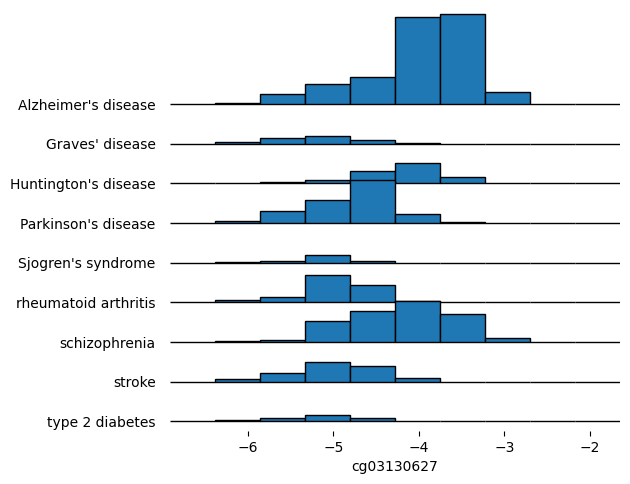

<Figure size 900x900 with 0 Axes>

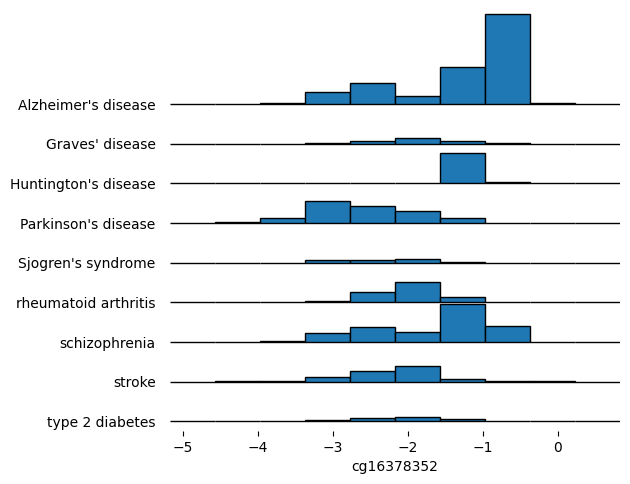

<Figure size 900x900 with 0 Axes>

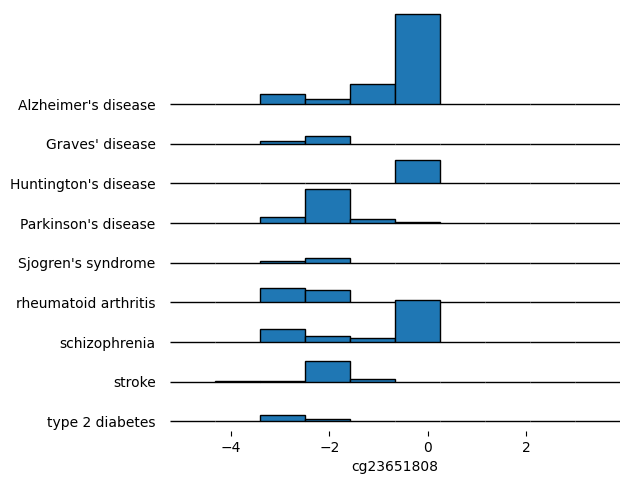

<Figure size 900x900 with 0 Axes>

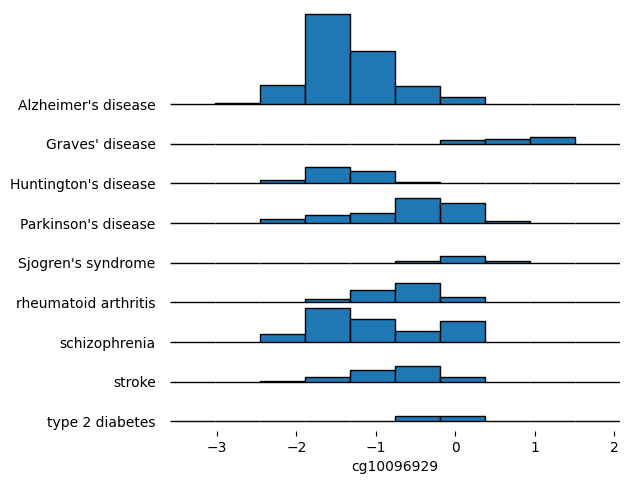

<Figure size 900x900 with 0 Axes>

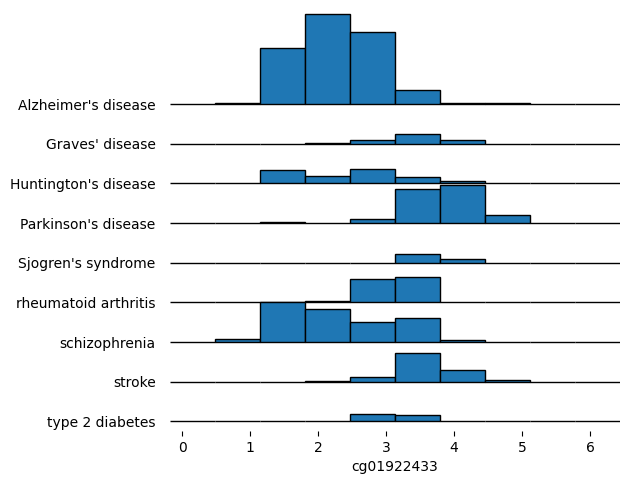

<Figure size 900x900 with 0 Axes>

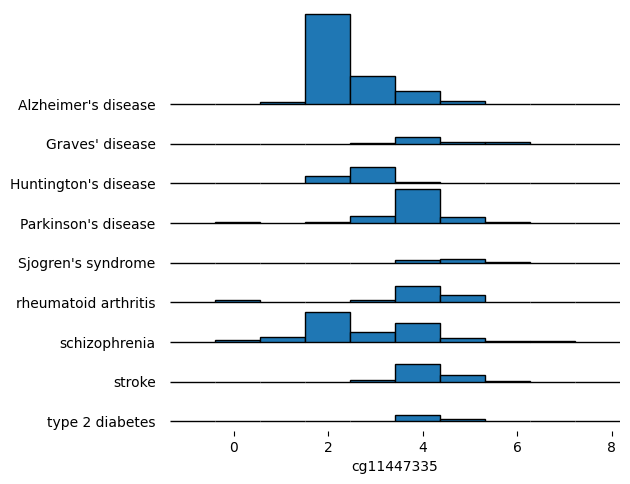

<Figure size 900x900 with 0 Axes>

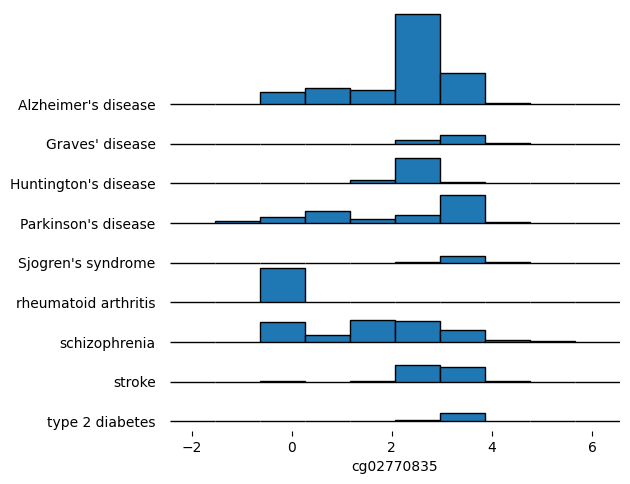

<Figure size 900x900 with 0 Axes>

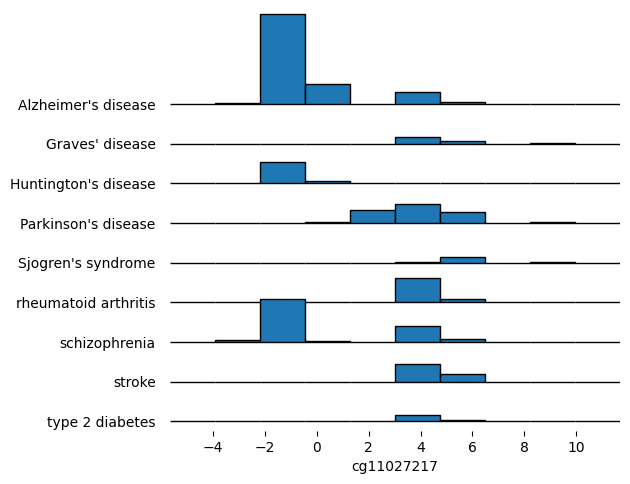

<Figure size 900x900 with 0 Axes>

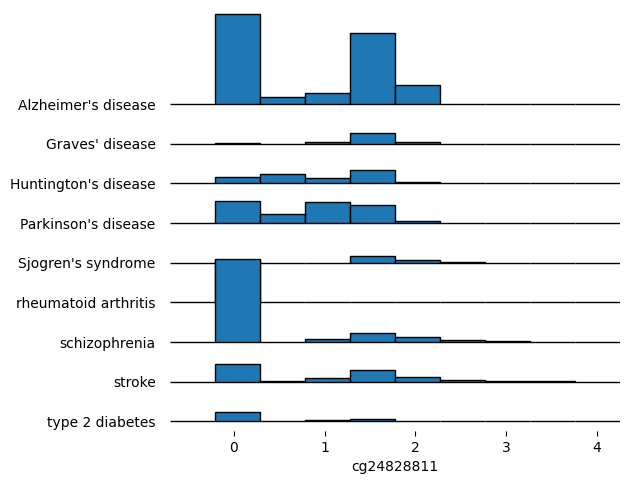

<Figure size 900x900 with 0 Axes>

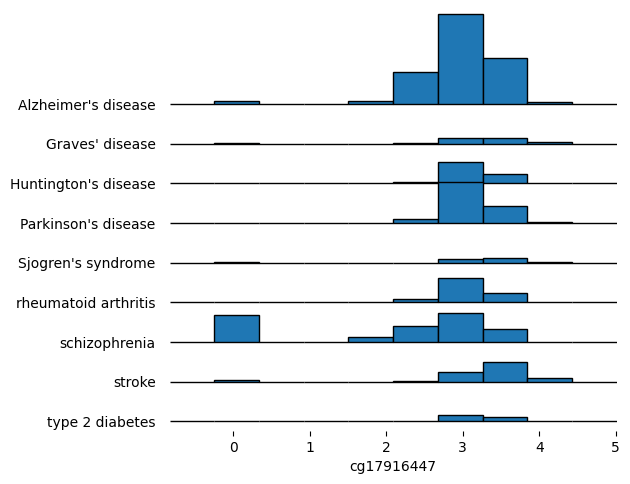

<Figure size 900x900 with 0 Axes>

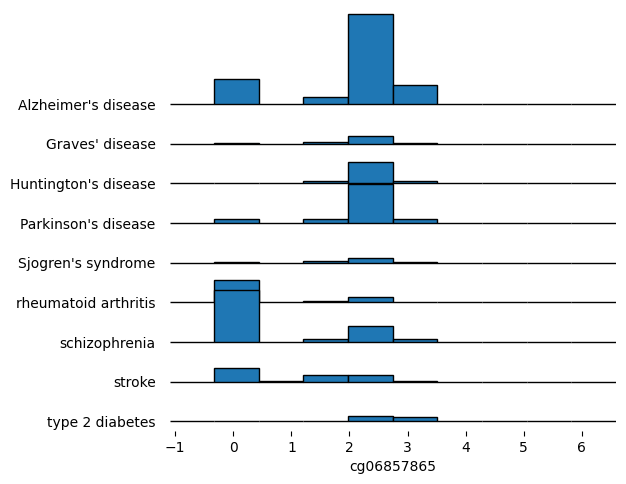

<Figure size 900x900 with 0 Axes>

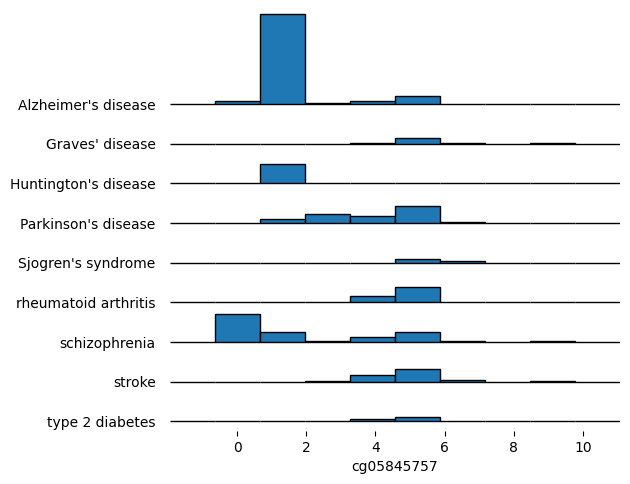

<Figure size 900x900 with 0 Axes>

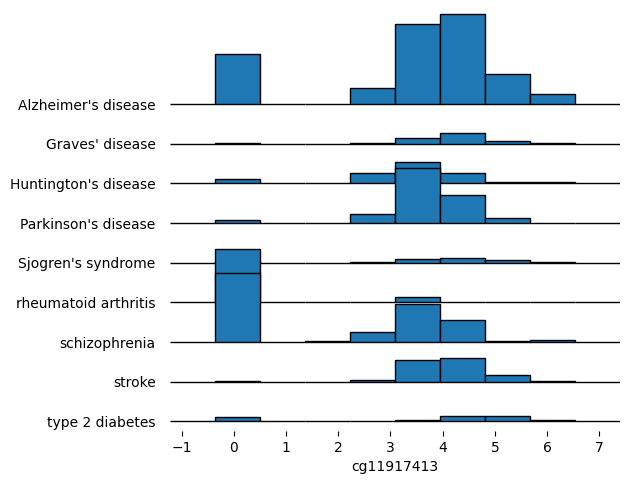

<Figure size 900x900 with 0 Axes>

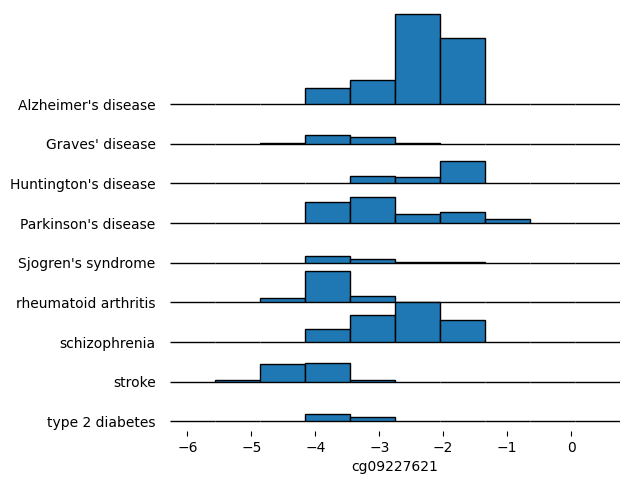

<Figure size 900x900 with 0 Axes>

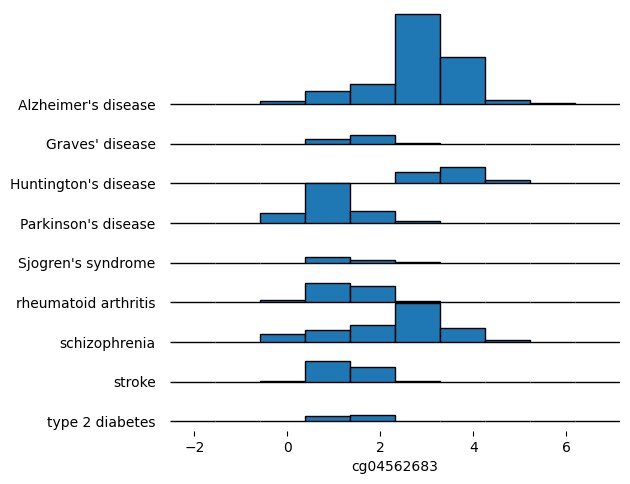

<Figure size 900x900 with 0 Axes>

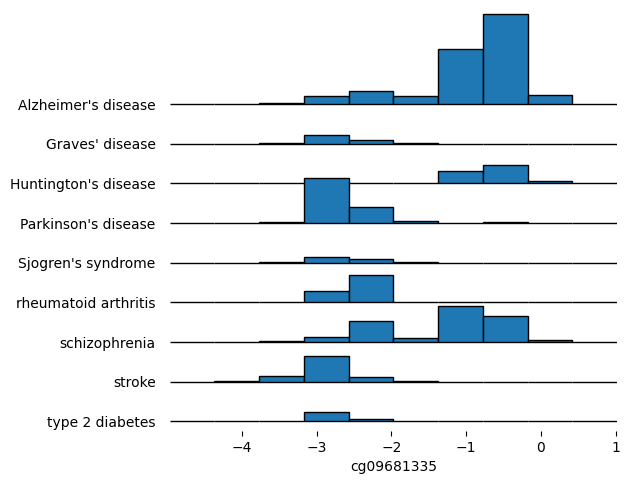

<Figure size 900x900 with 0 Axes>

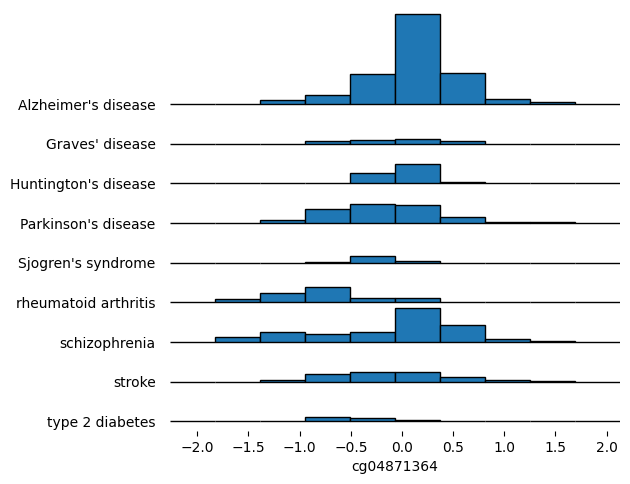

<Figure size 900x900 with 0 Axes>

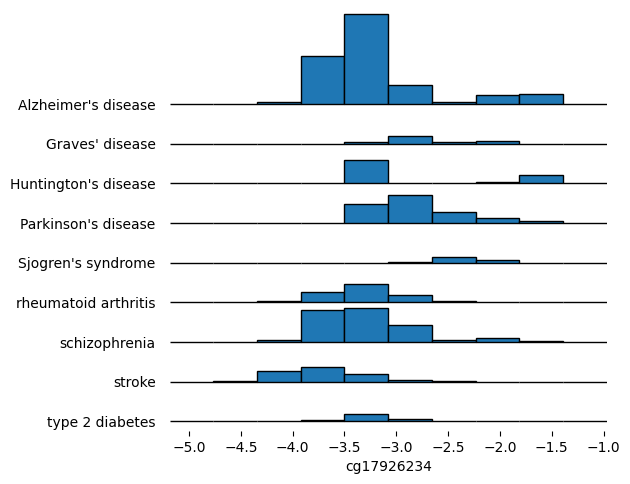

<Figure size 900x900 with 0 Axes>

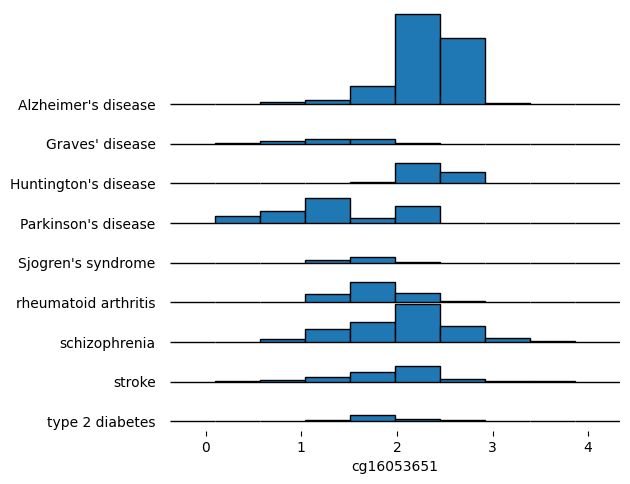

<Figure size 900x900 with 0 Axes>

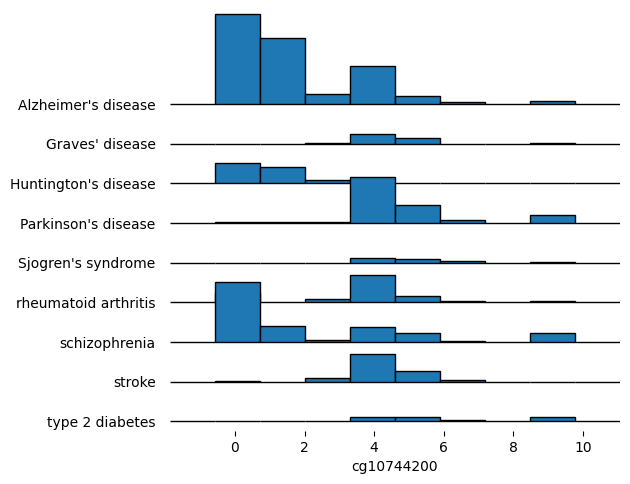

In [26]:
#绘制分布直方图
from joypy import joyplot
for cg in CG_Feature:
    cg_joyplot=plt.figure(figsize=(9,9))
    joyplot(Data,by='disease',column=cg,colormap=plt.cm.autumn_r,hist=True)
    plt.xlabel(cg)
    plt.show()

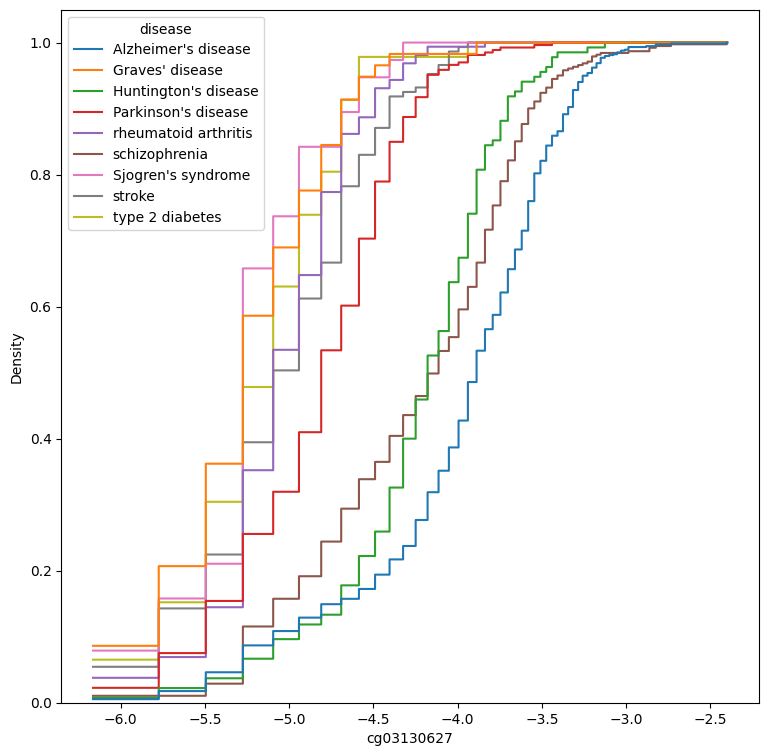

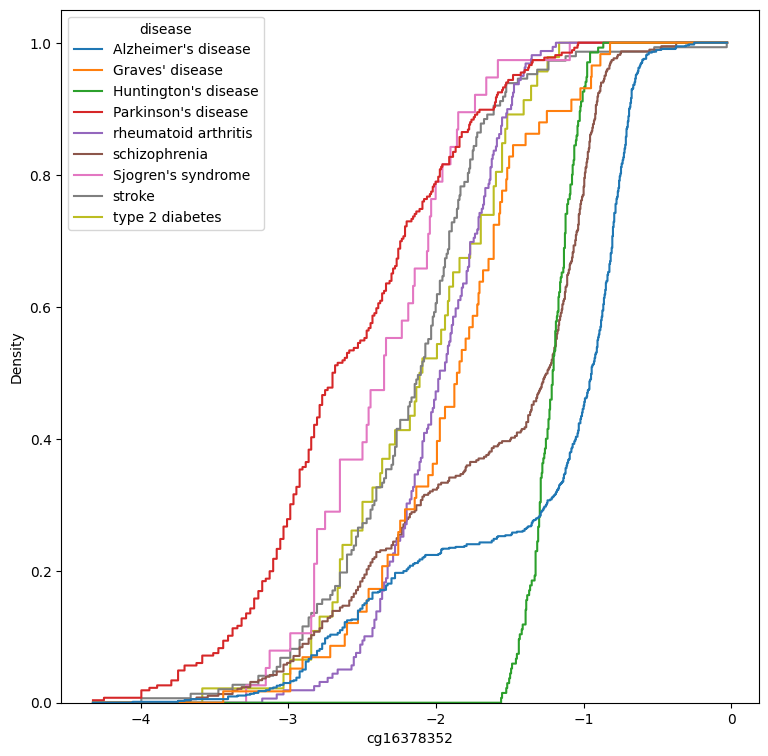

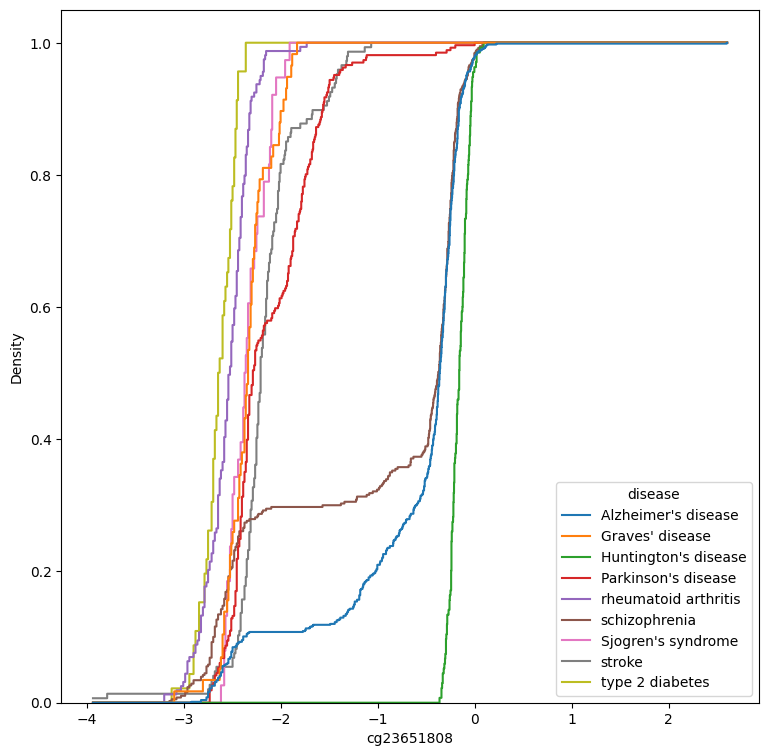

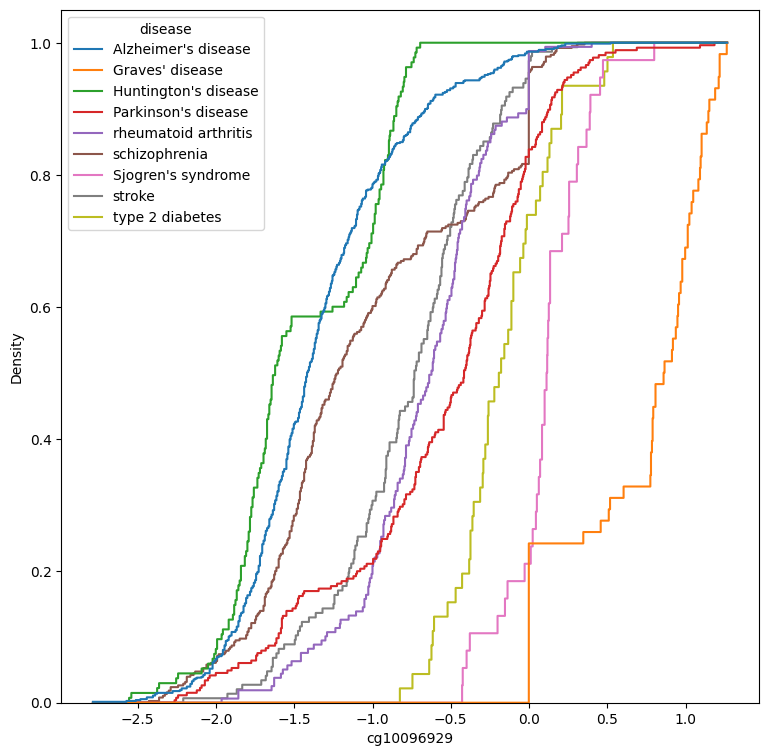

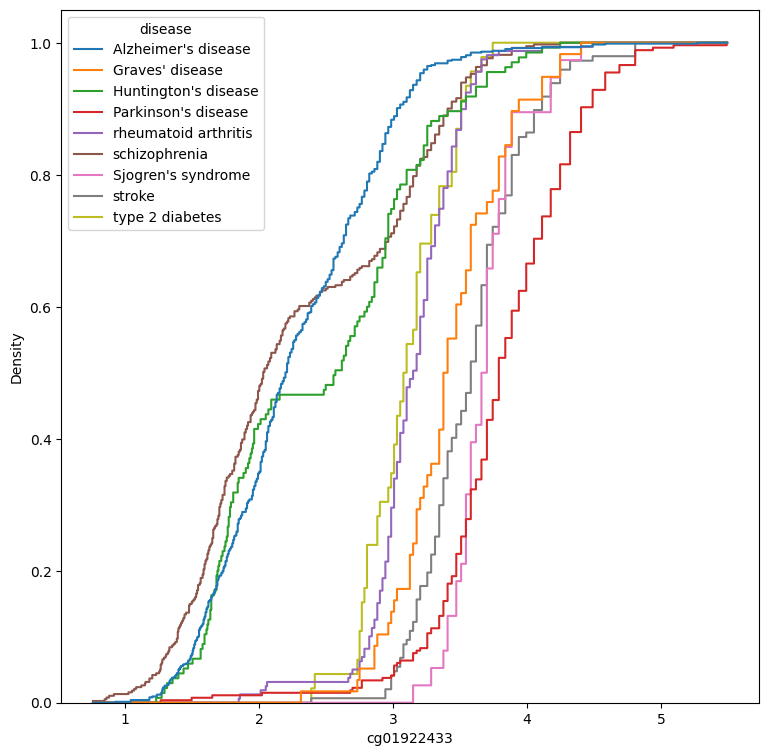

...

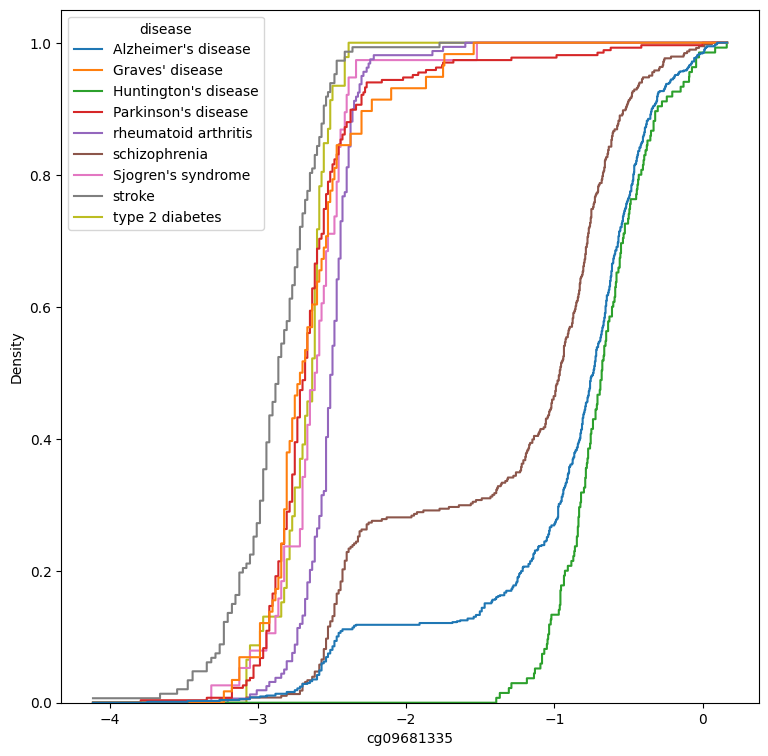

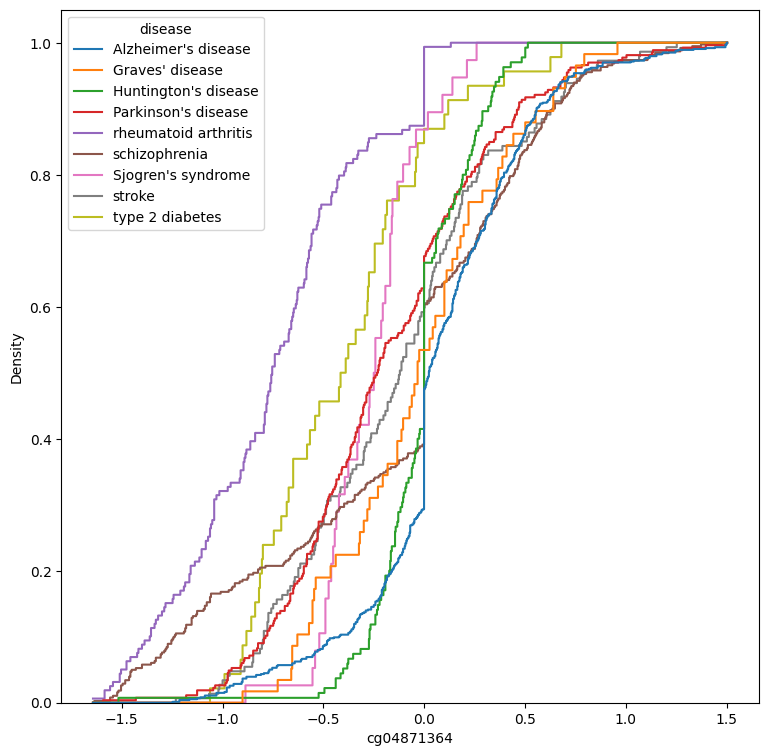

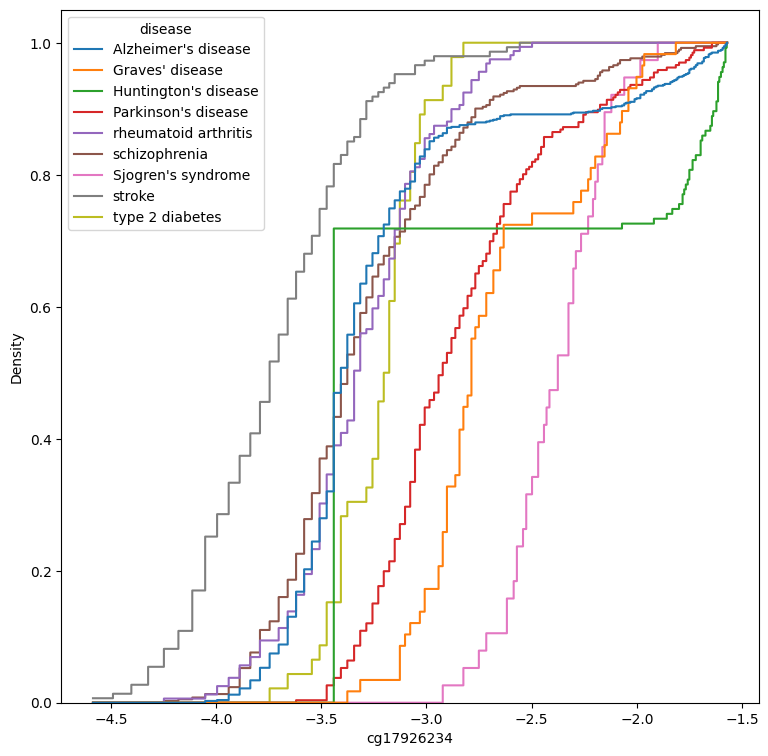

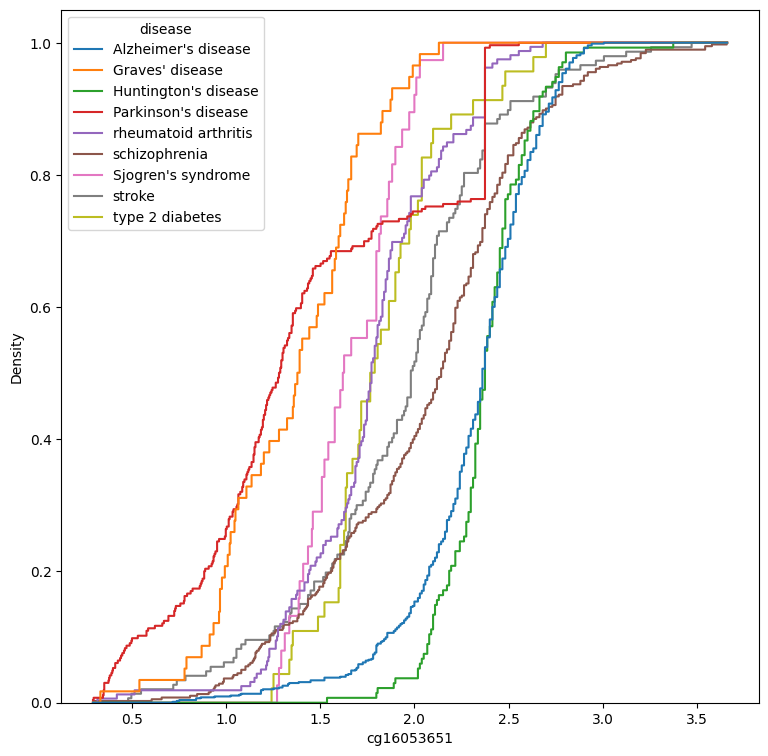

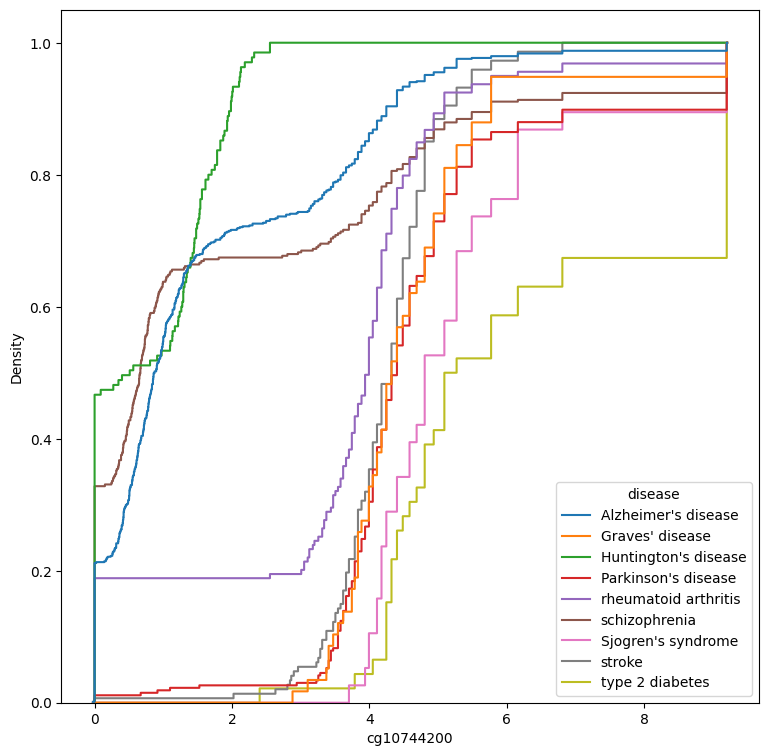

In [27]:
#绘制数据累计分布图
for cg in CG_Feature:
    cg_hist=plt.figure(figsize=(9,9))
    sns.histplot(x=cg,data=Data,hue='disease',fill=False,bins=len(Data),stat='density',element='step',cumulative=True,common_norm=False)
    plt.show()

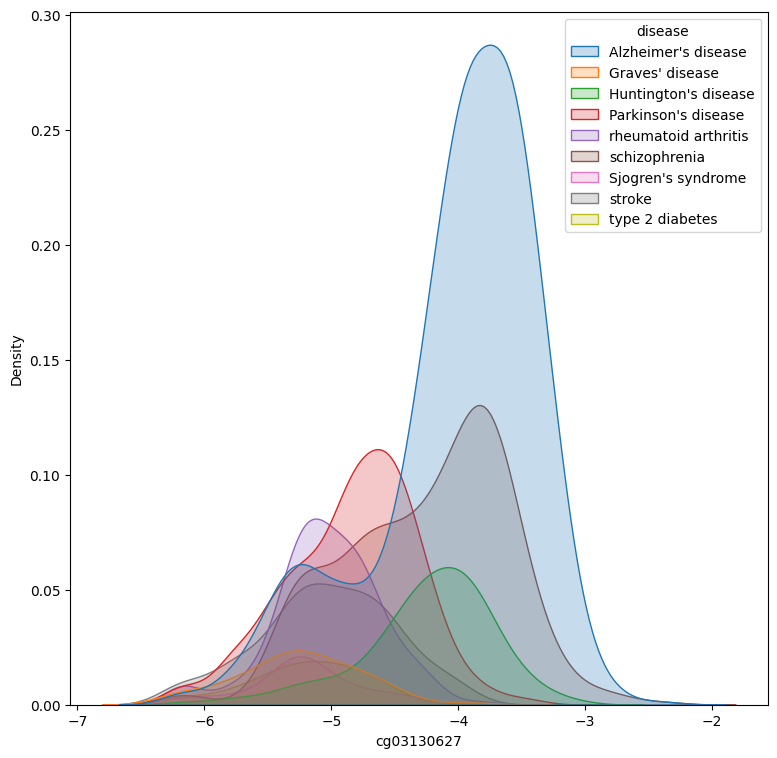

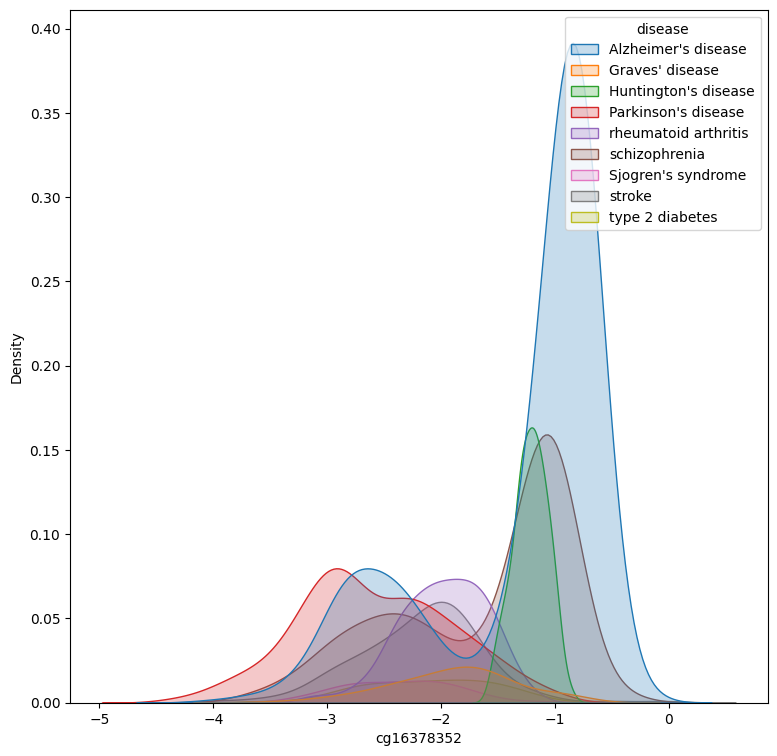

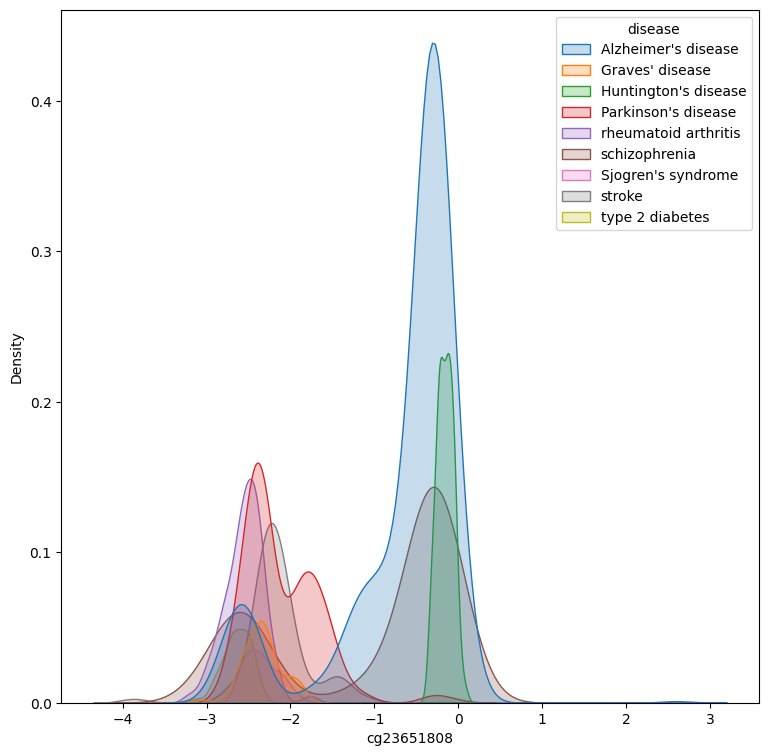

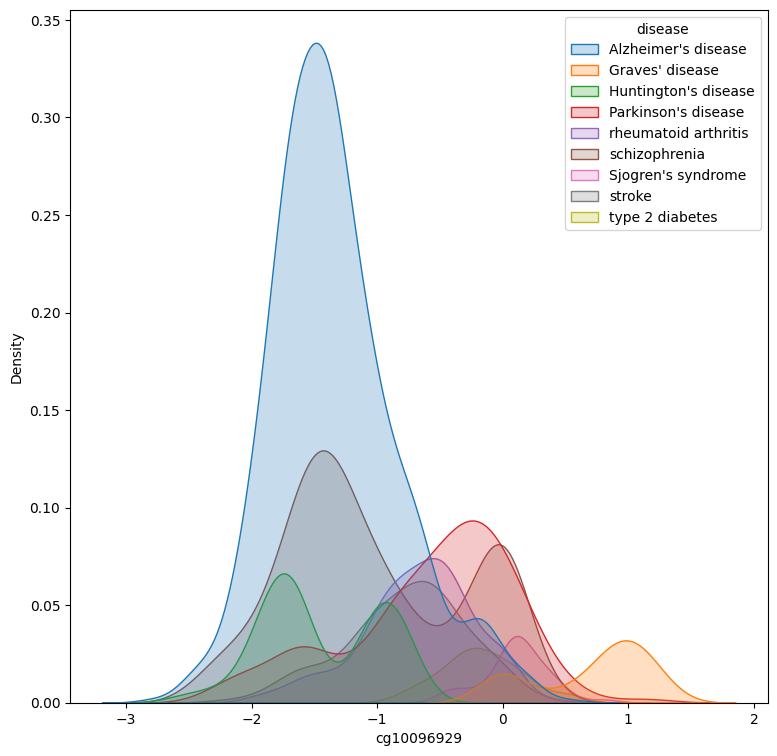

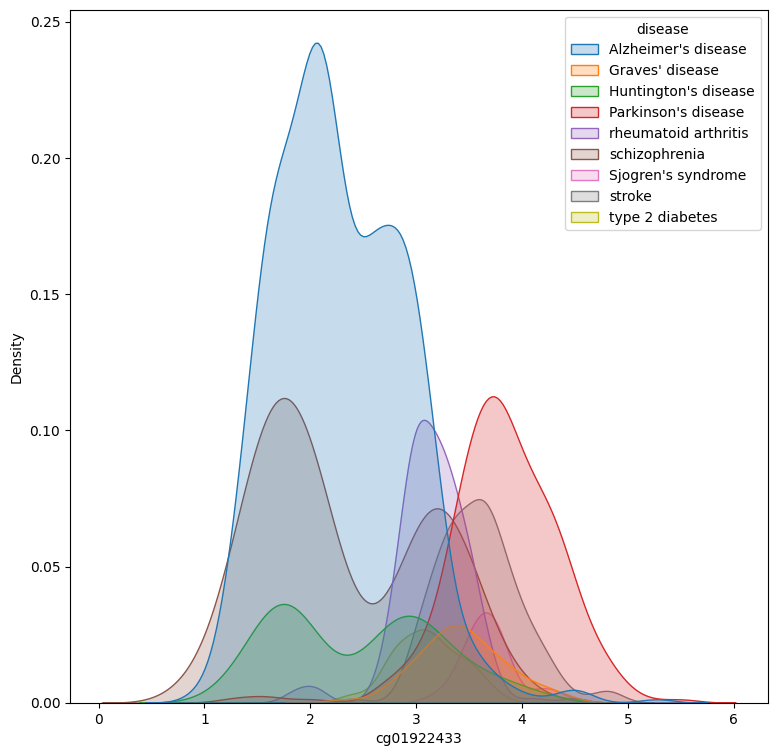

...

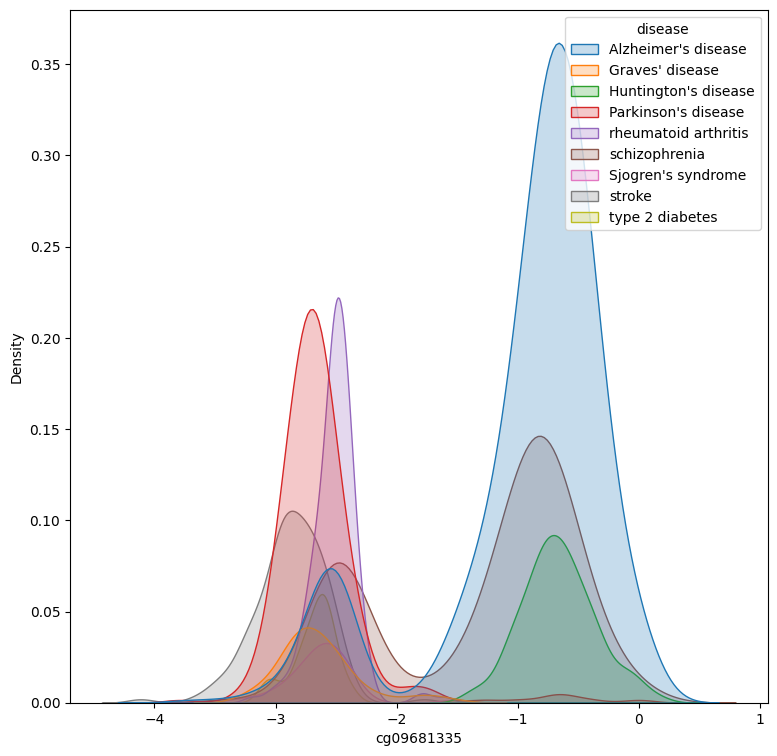

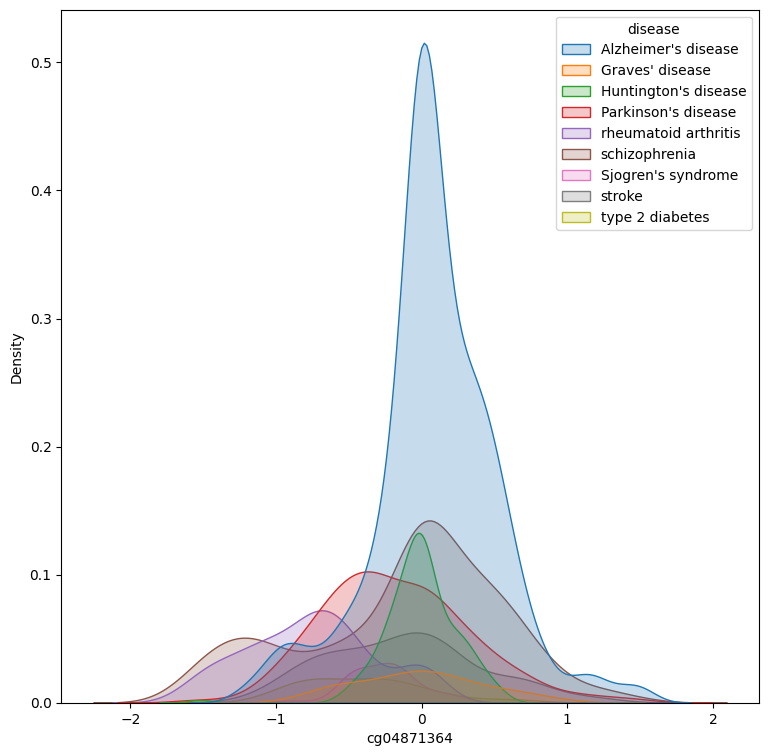

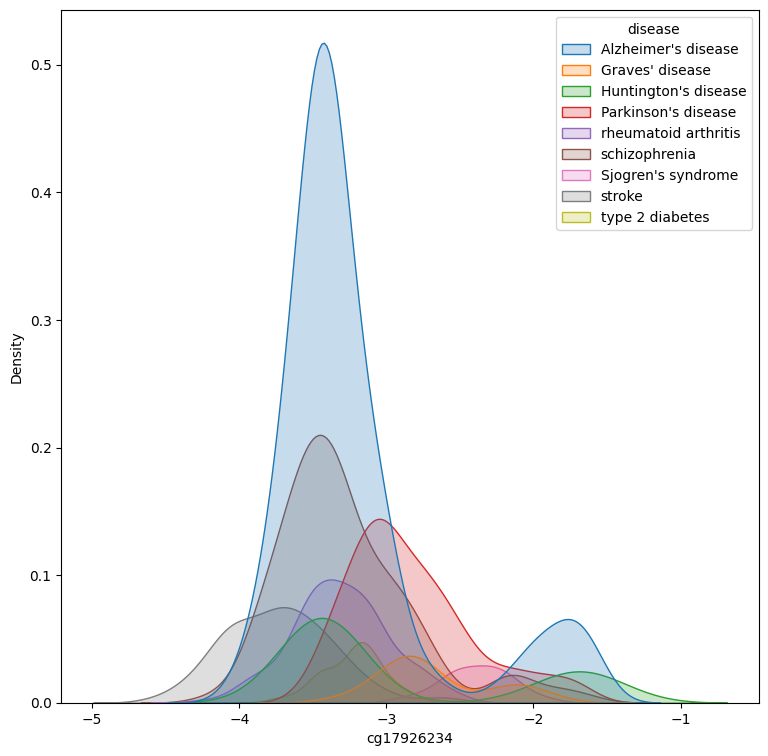

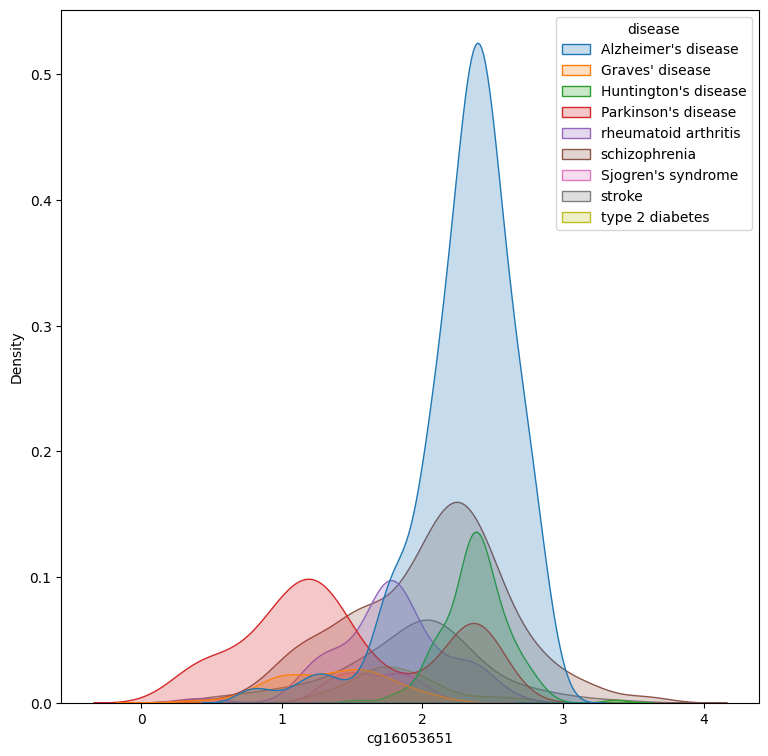

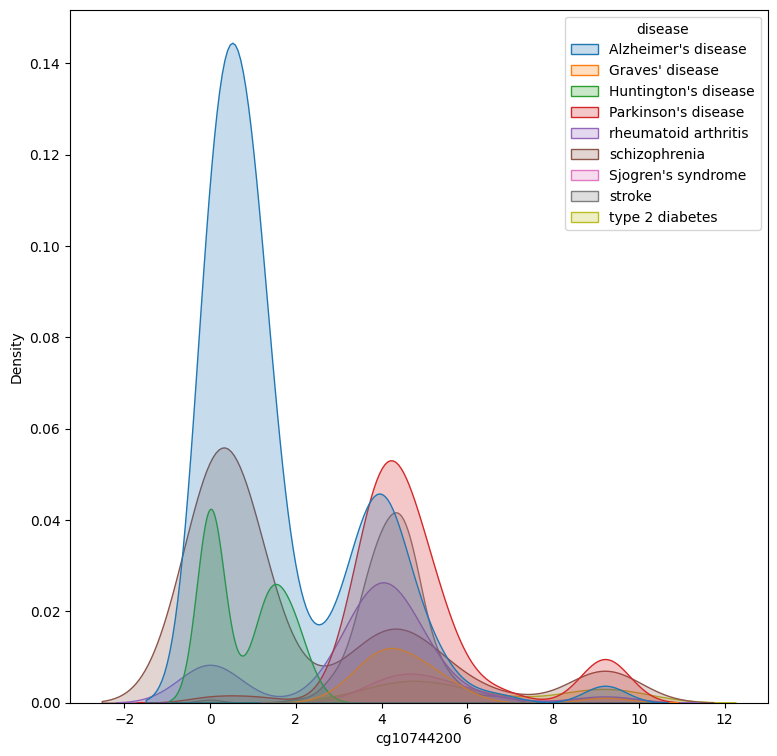

In [28]:
#绘制数据核密度图
for cg in CG_Feature:
    cg_hist=plt.figure(figsize=(9,9))
    sns.kdeplot(x=cg,data=Data,hue='disease',fill=True)
    plt.show()

<Figure size 900x900 with 0 Axes>

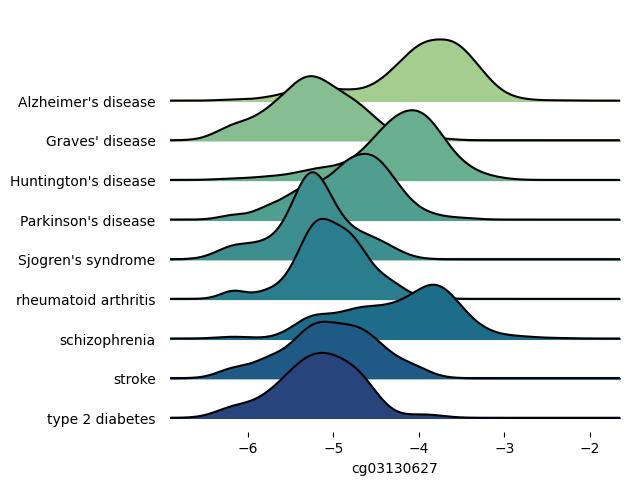

<Figure size 900x900 with 0 Axes>

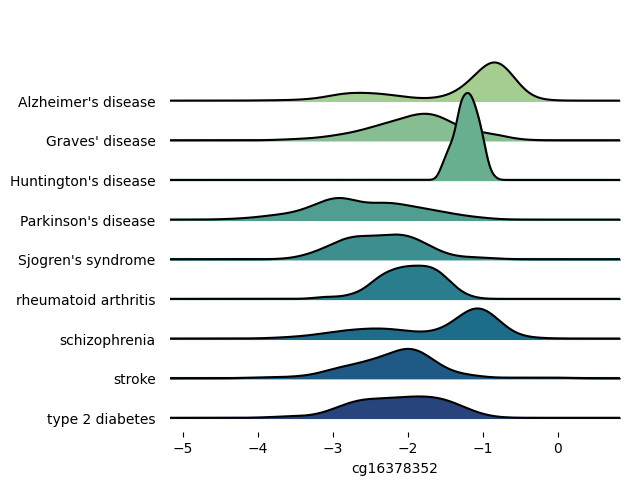

<Figure size 900x900 with 0 Axes>

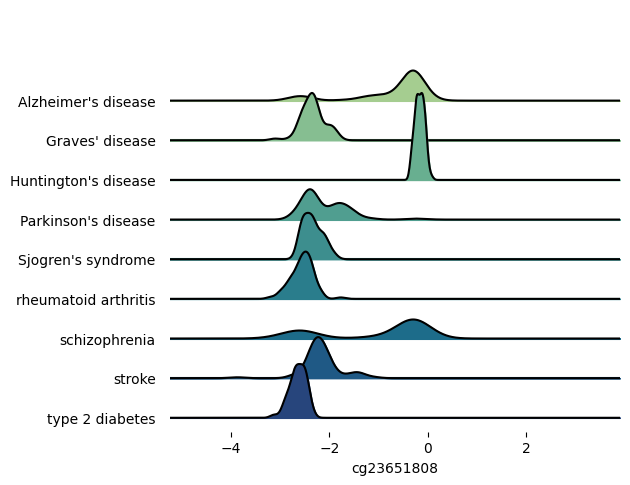

<Figure size 900x900 with 0 Axes>

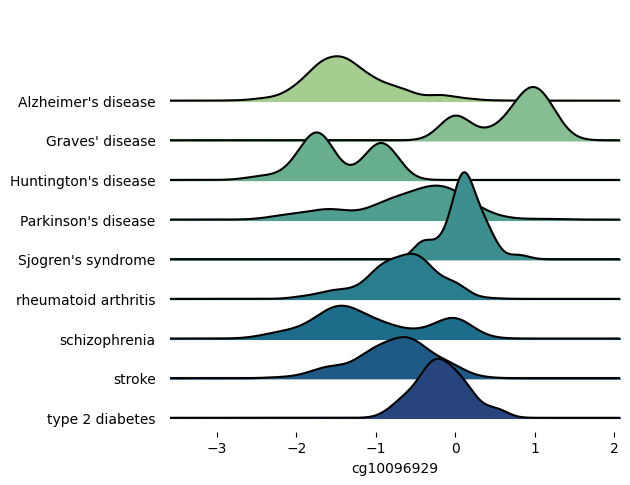

<Figure size 900x900 with 0 Axes>

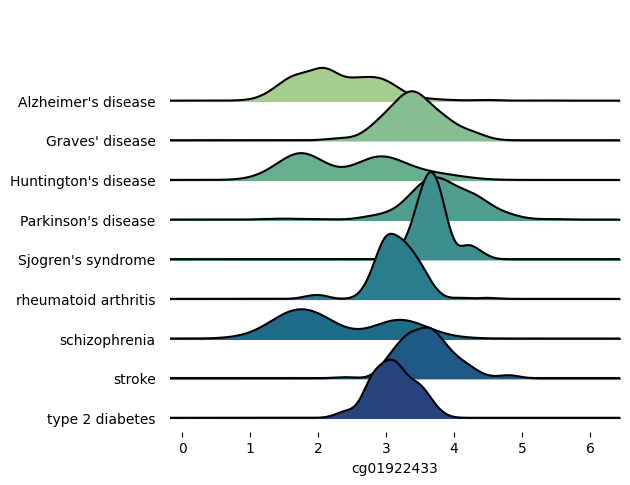

<Figure size 900x900 with 0 Axes>

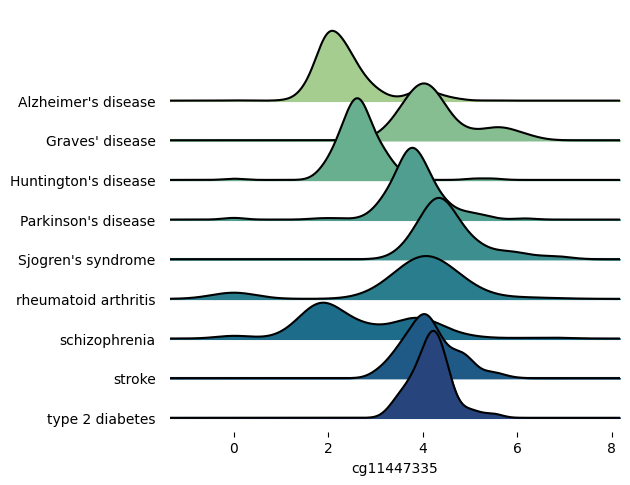

<Figure size 900x900 with 0 Axes>

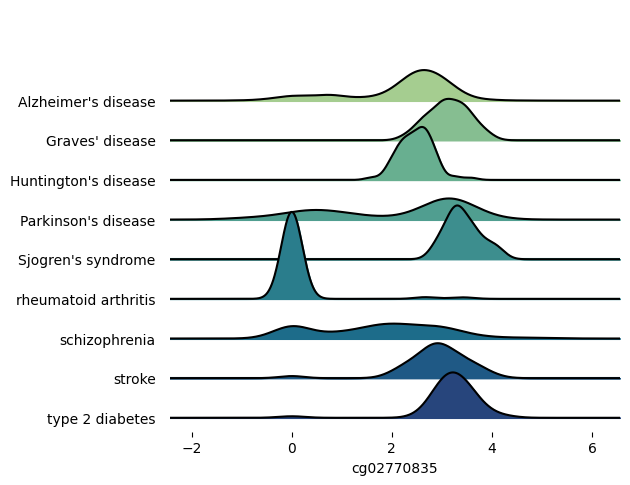

<Figure size 900x900 with 0 Axes>

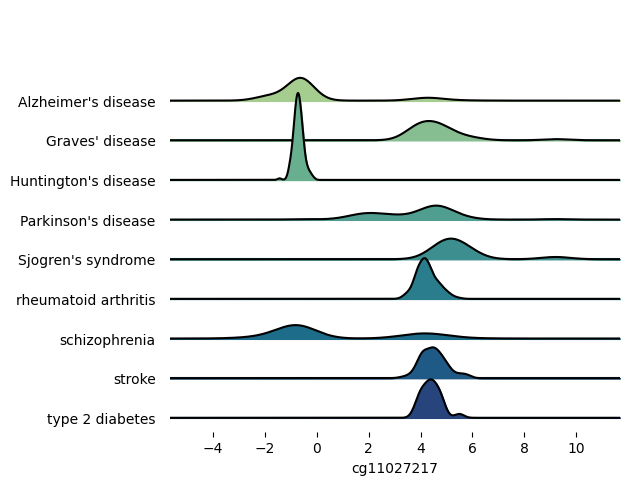

<Figure size 900x900 with 0 Axes>

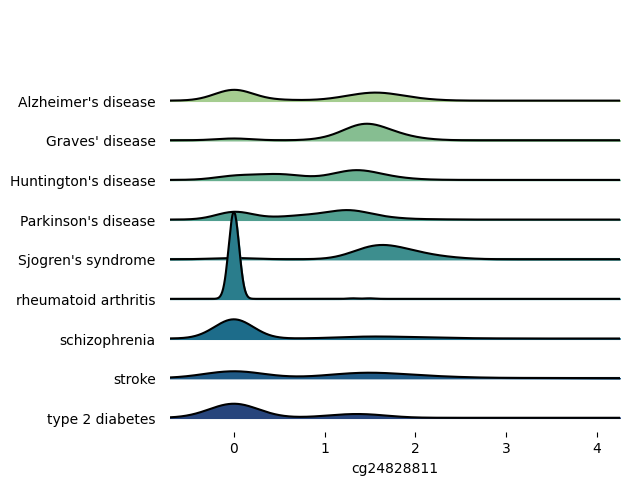

<Figure size 900x900 with 0 Axes>

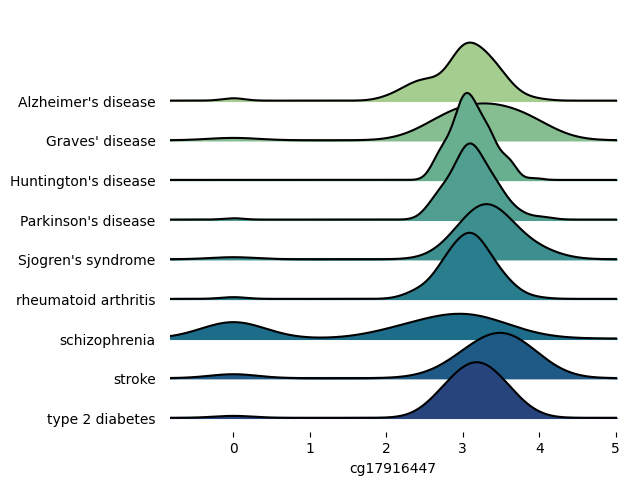

<Figure size 900x900 with 0 Axes>

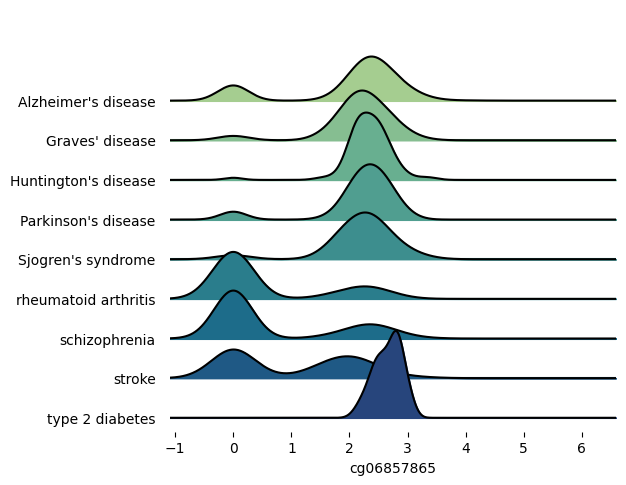

<Figure size 900x900 with 0 Axes>

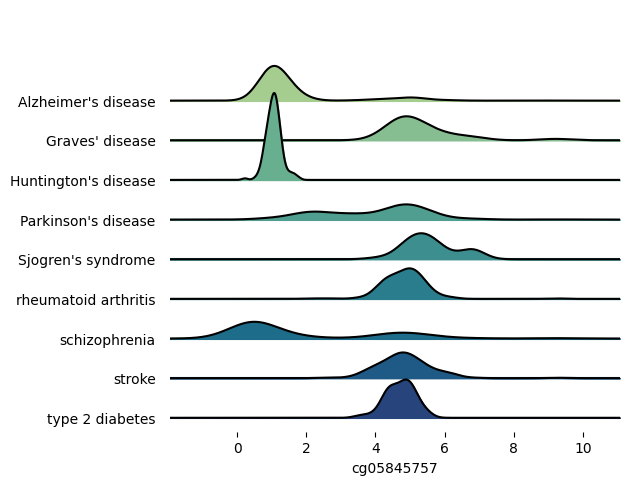

<Figure size 900x900 with 0 Axes>

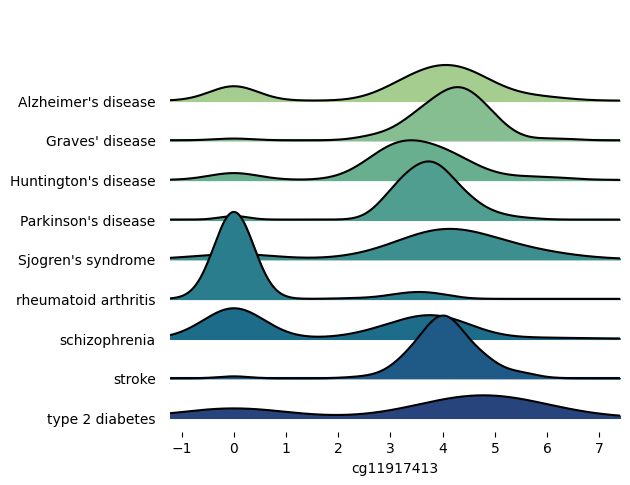

<Figure size 900x900 with 0 Axes>

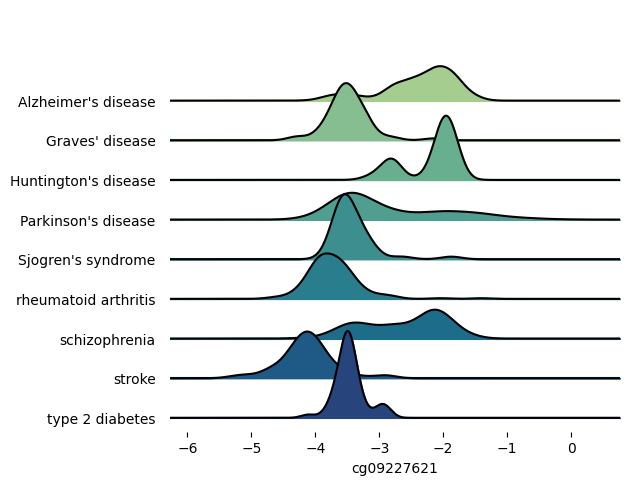

<Figure size 900x900 with 0 Axes>

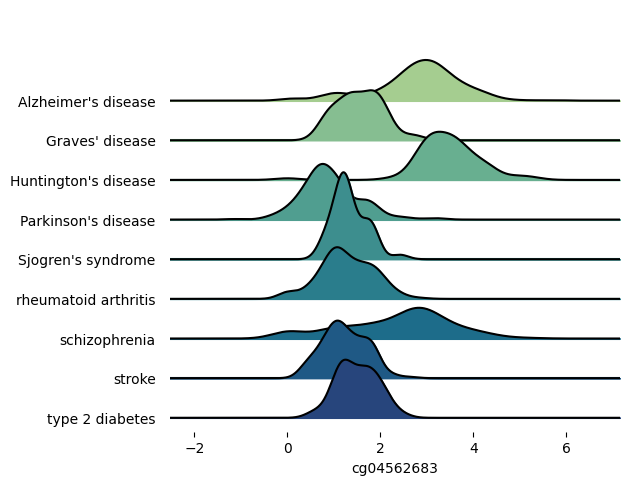

<Figure size 900x900 with 0 Axes>

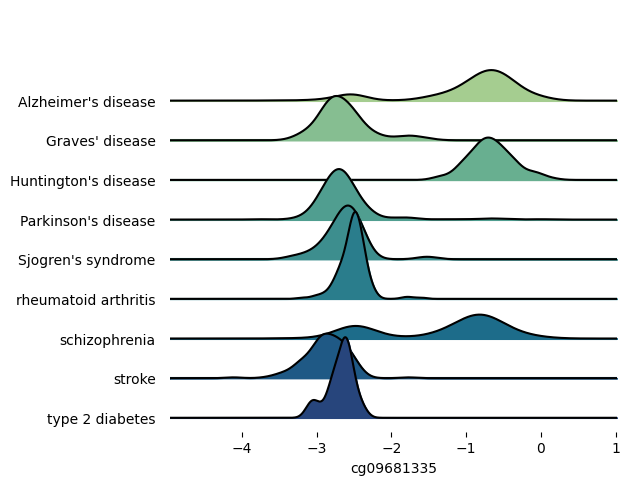

<Figure size 900x900 with 0 Axes>

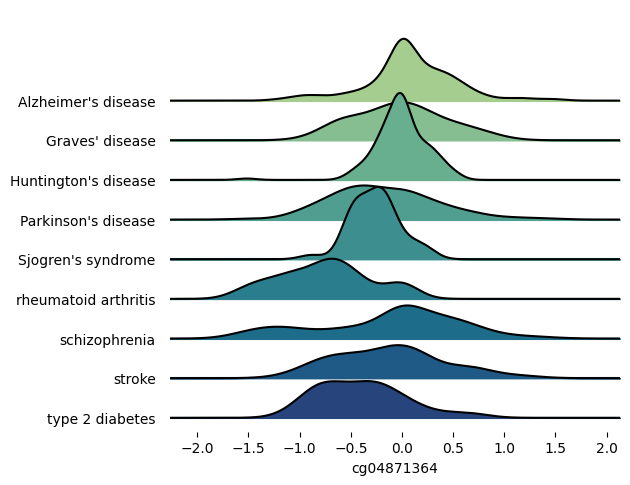

<Figure size 900x900 with 0 Axes>

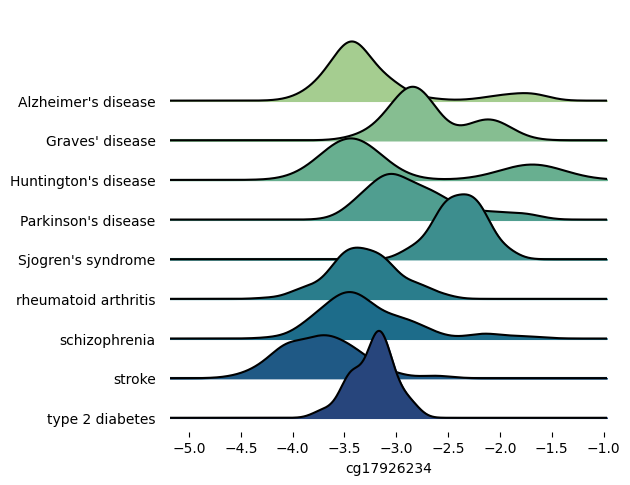

<Figure size 900x900 with 0 Axes>

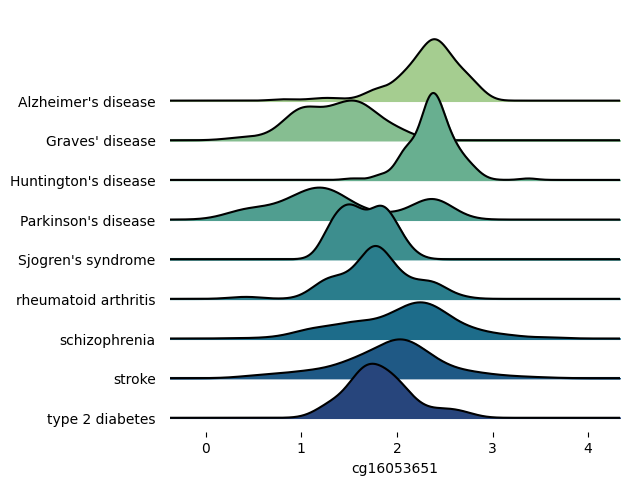

<Figure size 900x900 with 0 Axes>

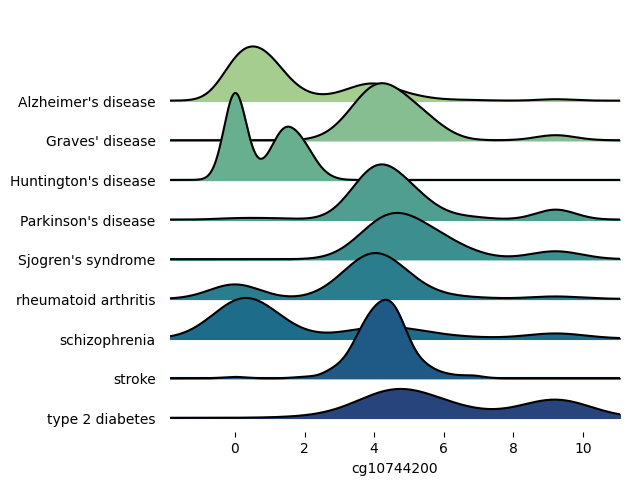

In [29]:
#绘制山脊图
from joypy import joyplot
for cg in CG_Feature:
    cg_joyplot=plt.figure(figsize=(9,9))
    joyplot(Data,by='disease',column=cg,colormap=sns.color_palette('crest',as_cmap=True))
    plt.xlabel(cg)
    plt.show()

进行数据特征缩放和数据过采样

In [30]:
#数据标准化和数据归一化
from sklearn.preprocessing import StandardScaler,MinMaxScaler
Standard=StandardScaler()    #数据缩放器
Data_Standard=Standard.fit_transform(Data.loc[:,CG_Feature])    #数据转化
Data_Standard=DataFrame(Data_Standard)    #数据标准化
Minmax=MinMaxScaler(feature_range=(-1,1))    #数据缩放
Data_standard_maxmin=Minmax.fit_transform(Data_Standard)    #数据缩放
Data_standard_maxmin=DataFrame(Data_standard_maxmin)
Data_standard_maxmin.columns=CG_Feature    #数据队列重命名

In [31]:
#查看标准化和缩放后数据统计学特征
Data_standard_maxmin.describe()

,cg03130627,cg16378352,cg23651808,cg10096929,cg01922433,cg11447335,cg02770835,cg11027217,cg24828811,cg17916447,cg06857865,cg05845757,cg11917413,cg09227621,cg04562683,cg09681335,cg04871364,cg17926234,cg16053651,cg10744200
count,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000,1967.000000
mean,-0.081246,0.215843,-0.189322,-0.105439,-0.158117,-0.104340,0.008015,-0.238345,-0.609286,0.367768,-0.405462,-0.400833,-0.033042,-0.013226,-0.038199,0.167943,-0.020884,-0.065968,0.025760,-0.408592
std,0.387881,0.384225,0.319452,0.358677,0.365525,0.330109,0.382067,0.429721,0.435345,0.425063,0.415847,0.434018,0.597808,0.325647,0.336839,0.468571,0.346438,0.368310,0.337301,0.526527
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,-0.431071,-0.093210,-0.525714,-0.389923,-0.478946,-0.380310,-0.288351,-0.601813,-1.000000,0.316393,-1.000000,-0.772155,-1.000000,-0.298196,-0.331264,-0.285737,-0.231695,-0.285001,-0.185213,-0.885220
50%,-0.063802,0.294278,-0.102593,-0.148626,-0.111526,-0.142124,0.136489,-0.546041,-1.000000,0.472651,-0.212262,-0.641731,0.187450,0.016790,-0.019919,0.339629,0.044668,-0.176368,0.110892,-0.378653
75%,0.236627,0.552263,0.118442,0.168005,0.118677,0.172651,0.288434,0.200339,-0.181865,0.586401,-0.096051,0.028657,0.378209,0.273290,0.228090,0.597364,0.185097,0.061559,0.252146,-0.058249
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [119]:
Data_standard_maxmin.to_excel('/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Data_standard_maxmin.xlsx')

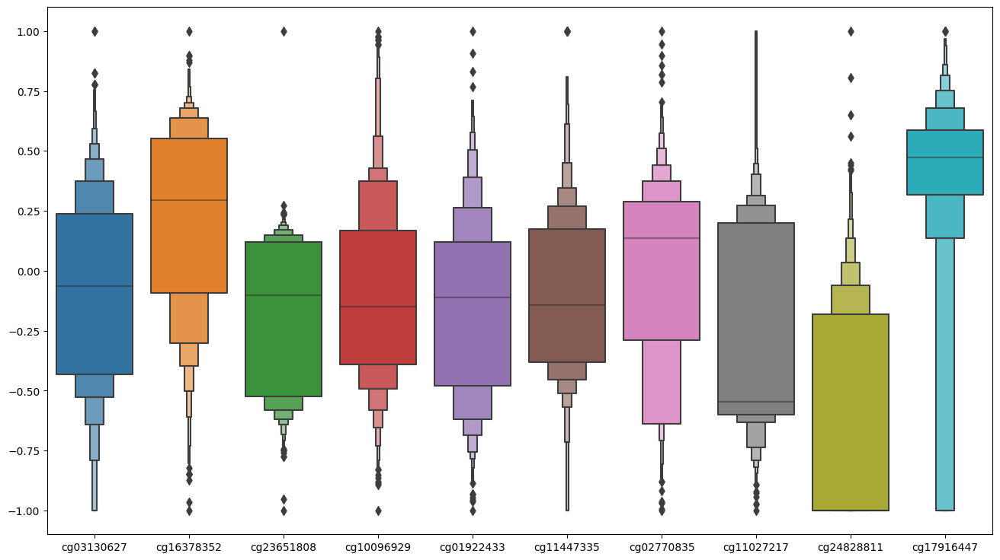

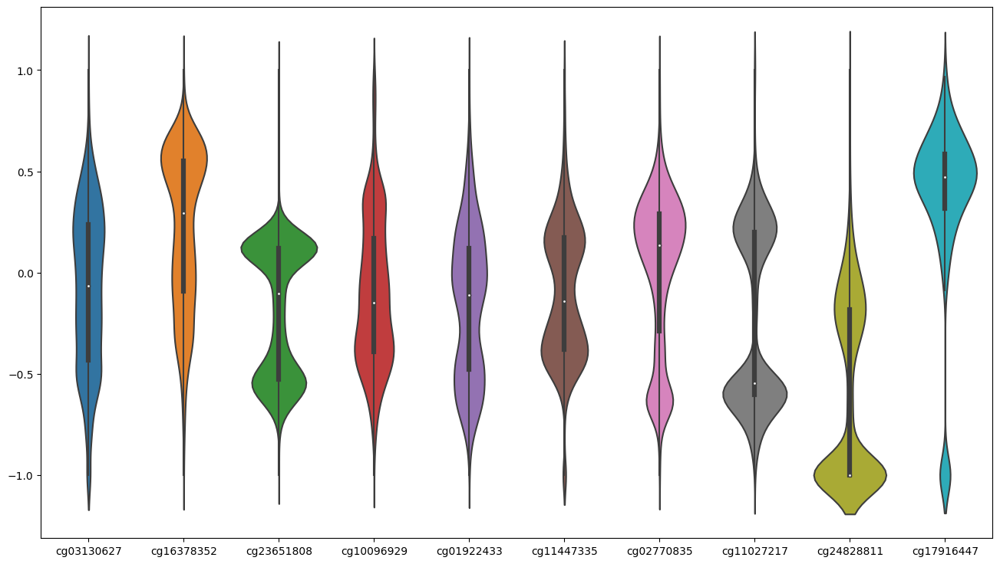

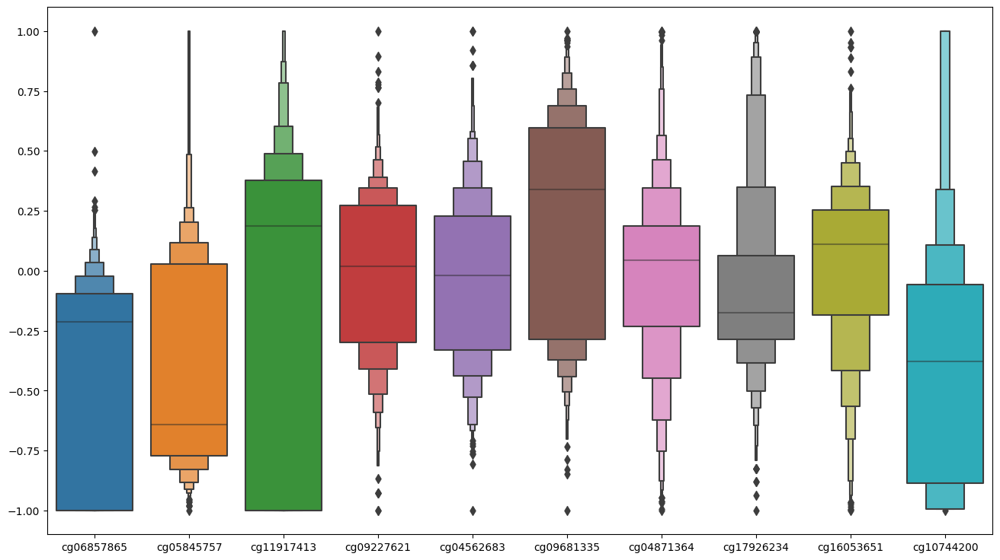

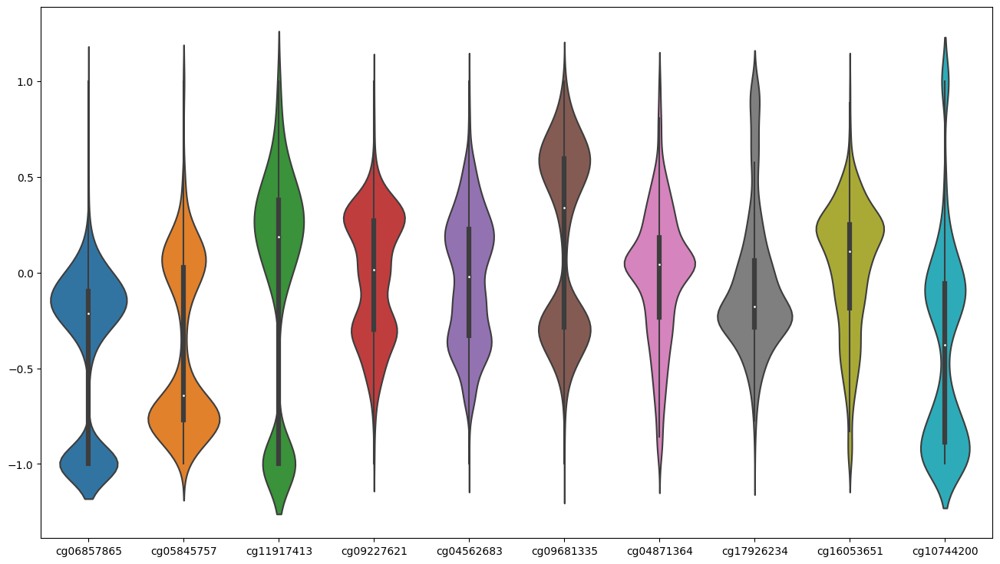

In [32]:
#绘制箱型图和小提琴图
for feature in Boxlist:
    boxplot=plt.figure(figsize=(16,9))
    sns.boxenplot(Data_standard_maxmin.loc[:,feature])
    plt.show()
    violinplot=plt.figure(figsize=(16,9))
    sns.violinplot(Data_standard_maxmin.loc[:,feature])
    plt.show()

比较自适应过采样前后算法性能

In [33]:
#数据集整理
Data_standard_maxmin['gender_encoder']=Data.loc[:,'gender_encode']    #整合数据集
Disease=Data.loc[:,'disease_encode']-1    #提取标签数据

未进行数据自适应过采样技术

/tmp/ipykernel_19513/1234362994.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Data.loc[:,'disease_encode'],hist=True,kde=False,rug=False)


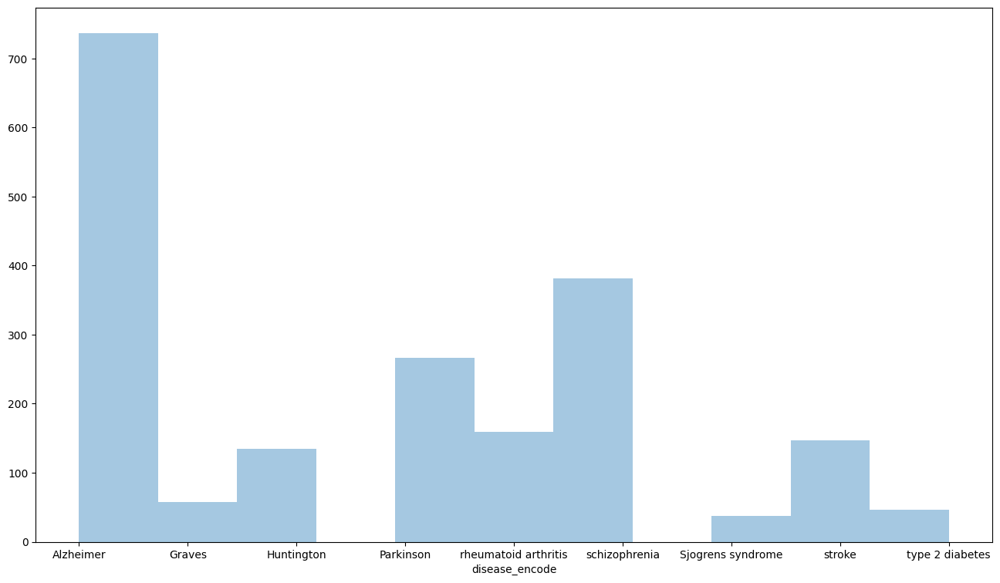

In [34]:
#绘制疾病类型数据直方图
DiseaseType=['Alzheimer','Graves','Huntington','Parkinson','rheumatoid arthritis','schizophrenia',
             'Sjogrens syndrome','stroke','type 2 diabetes']
Barplot=plt.figure(figsize=(16,9))
sns.distplot(Data.loc[:,'disease_encode'],hist=True,kde=False,rug=False)
plt.xticks(np.arange(1,10),DiseaseType)
plt.show()

In [35]:
#编写模型评估函数
from sklearn.metrics import precision_score,recall_score,f1_score,accuracy_score,classification_report
def Model_Evaluate(model,X_train,y_train,X_test,y_test):
    Label_name=['Alzheimer disease','Graves disease','Huntington disease','Parkinsons disease','rheumatoid arthritis',
             'schizophrenia','Sjogren syndrome','stroke','type 2 diabetes']
    train_error=1-model.score(X_train,y_train)    #训练误差
    test_error=1-model.score(X_test,y_test)    #测试误差
    print('模型训练误差为:{0},测试误差为:{1}'.format(train_error,test_error))
    train_pred=model.predict(X_train)    #训练误差测定
    precision_train=precision_score(y_train,train_pred,average='micro')
    recall_train=recall_score(y_train,train_pred,average='micro')
    f1_train=f1_score(y_train,train_pred,average='micro')
    accuracy_train=accuracy_score(y_train,train_pred)
    print('模型训练准确率为:{0},召回率为:{1},f1分数为:{2},精度为:{3}'.format(precision_train,recall_train,f1_train,accuracy_train))
    test_pred=model.predict(X_test)    #测试误差测定
    precision_test=precision_score(y_test,test_pred,average='micro')
    recall_test=recall_score(y_test,test_pred,average='micro')
    f1_test=f1_score(y_test,test_pred,average='micro')
    accuracy_test=accuracy_score(y_test,test_pred)
    print('模型测试准确率为:{0},召回率为:{1},f1分数为:{2},精度为:{3}'.format(precision_test,recall_test,f1_test,accuracy_test))
    print('---------------------训练数据集报告---------------------')
    print(classification_report(y_train,train_pred,target_names=Label_name))
    print('---------------------测试数据集报告---------------------')
    print(classification_report(y_test,test_pred,target_names=Label_name))

In [36]:
#测试未使用自适应过采样的模型训练结果
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier    
X_train,X_test,y_train,y_test=train_test_split(Data_standard_maxmin,Disease,train_size=0.8,random_state=2024)    #数据集划分
#载入XGBoost模型
Model_XGB=XGBClassifier(booster='gbtree',n_estimators=1000,max_depth=2,objective='multi-softmax',gpu_id=0, tree_method='gpu_hist')
Model_XGB.fit(X_train,y_train)    #模型训练
Model_Evaluate(Model_XGB,X_train,y_train,X_test,y_test)

模型训练误差为:0.0,测试误差为:0.08629441624365486
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.9137055837563451,召回率为:0.9137055837563451,f1分数为:0.9137055837563451,精度为:0.9137055837563451
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       587
      Graves disease       1.00      1.00      1.00        44
  Huntington disease       1.00      1.00      1.00       112
  Parkinsons disease       1.00      1.00      1.00       197
rheumatoid arthritis       1.00      1.00      1.00       131
       schizophrenia       1.00      1.00      1.00       312
    Sjogren syndrome       1.00      1.00      1.00        32
              stroke       1.00      1.00      1.00       123
     type 2 diabetes       1.00      1.00      1.00        35

            accuracy                           1.00      1573
           macro avg       1.00      1.00      1.00      1573
        weighted avg      

比较性别特征对算法性能的影响

In [37]:
#无性别特征数据
Data_NoGender=Data_standard_maxmin.iloc[:,:-1]    #无性别特征数据
X_trainNoGender,X_testNoGender,y_trainNoGender,y_testNoGender=train_test_split(Data_NoGender,Disease,train_size=0.8,random_state=2024)    #数据集划分
Model_XGB_Nogender=XGBClassifier(booster='gbtree',n_estimators=1000,max_depth=2,objective='multi-softmax',gpu_id=0, tree_method='gpu_hist')
Model_XGB_Nogender.fit(X_trainNoGender,y_trainNoGender)
Model_Evaluate(Model_XGB_Nogender,X_trainNoGender,y_trainNoGender,X_testNoGender,y_testNoGender)

模型训练误差为:0.0,测试误差为:0.08883248730964466
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.9111675126903553,召回率为:0.9111675126903553,f1分数为:0.9111675126903553,精度为:0.9111675126903553
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       587
      Graves disease       1.00      1.00      1.00        44
  Huntington disease       1.00      1.00      1.00       112
  Parkinsons disease       1.00      1.00      1.00       197
rheumatoid arthritis       1.00      1.00      1.00       131
       schizophrenia       1.00      1.00      1.00       312
    Sjogren syndrome       1.00      1.00      1.00        32
              stroke       1.00      1.00      1.00       123
     type 2 diabetes       1.00      1.00      1.00        35

            accuracy                           1.00      1573
           macro avg       1.00      1.00      1.00      1573
        weighted avg      

In [38]:
#包含性别数据
X_trainGender,X_testGender,y_trainGender,y_testGender=train_test_split(Data_standard_maxmin,Disease,train_size=0.8,random_state=2024)    #数据集划分
#载入XGBoost模型
Model_XGBGender=XGBClassifier(booster='gbtree',n_estimators=1000,max_depth=2,objective='multi-softmax',gpu_id=0, tree_method='gpu_hist')
Model_XGBGender.fit(X_trainGender,y_trainGender)    #模型训练
Model_Evaluate(Model_XGBGender,X_trainGender,y_trainGender,X_testGender,y_testGender)

模型训练误差为:0.0,测试误差为:0.08629441624365486
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.9137055837563451,召回率为:0.9137055837563451,f1分数为:0.9137055837563451,精度为:0.9137055837563451
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       587
      Graves disease       1.00      1.00      1.00        44
  Huntington disease       1.00      1.00      1.00       112
  Parkinsons disease       1.00      1.00      1.00       197
rheumatoid arthritis       1.00      1.00      1.00       131
       schizophrenia       1.00      1.00      1.00       312
    Sjogren syndrome       1.00      1.00      1.00        32
              stroke       1.00      1.00      1.00       123
     type 2 diabetes       1.00      1.00      1.00        35

            accuracy                           1.00      1573
           macro avg       1.00      1.00      1.00      1573
        weighted avg      

In [39]:
#对数据进行卡方检验
PredictGender_train=Model_XGBGender.predict(X_trainGender)    #包含性别数据
PredictNoGender_train=Model_XGB_Nogender.predict(X_trainNoGender)    #不包含性别数据
Crosstab_train=pd.crosstab(PredictGender_train,PredictNoGender_train)
X2_Train_value,X2_Train_pvalue,X2_Train_df,X2_Train_expected=chi2_contingency(Crosstab_train)    #卡方检验
print('训练数据集卡方检验卡方值为:{0},P值为:{1},自由度为:{2}'.format(X2_Train_value,X2_Train_pvalue,X2_Train_df))
PredictGender_test=Model_XGBGender.predict(X_testGender)    #包含性别数据
PredictNoGender_test=Model_XGB_Nogender.predict(X_testNoGender)    #不包含性别数据
Crosstab_test=pd.crosstab(PredictGender_test,PredictNoGender_test)
X2_Test_value,X2_Test_pvalue,X2_Test_df,X2_Test_expected=chi2_contingency(Crosstab_test)    #卡方检验
print('训练数据集卡方检验卡方值为:{0},P值为:{1},自由度为:{2}'.format(X2_Test_value,X2_Test_pvalue,X2_Test_df))

训练数据集卡方检验卡方值为:12584.0,P值为:0.0,自由度为:64
训练数据集卡方检验卡方值为:3023.2070645809526,P值为:0.0,自由度为:64


进行数据自适应过采样

In [40]:
#进行数据自适应过采样
from imblearn.over_sampling import RandomOverSampler,SMOTE,BorderlineSMOTE,ADASYN,KMeansSMOTE
randomoversampler=RandomOverSampler(random_state=2024,sampling_strategy='auto')    #随机过采样
smote=SMOTE(random_state=2024,n_jobs=-1,sampling_strategy='auto')    #SMOTE
adasyn=ADASYN(random_state=2024,n_jobs=-1,sampling_strategy='auto')    #自适应过采样
borderlinesomte=BorderlineSMOTE(random_state=2024,n_jobs=-1,sampling_strategy='auto')    #BorderlineSMOTE
kmeanssmote=KMeansSMOTE(random_state=2024,n_jobs=-1,sampling_strategy='auto')    #KMeansSMOTE
Oversample=[randomoversampler,smote,adasyn,borderlinesomte,kmeanssmote]    #过采样器
Oversample_name=['RandomOverSampler','SMOTE','BorderlineSMOTE','ADASYN','KMeansSMOTE']    #过采样器命名
for oversample,oversample_name in zip(Oversample,Oversample_name):
    Data_standard_maxmin_resample,Disease_resample=oversample.fit_resample(Data_standard_maxmin,Disease)    #数据重采样
    X_train_resample,X_test_resample,y_train_resample,y_test_resample=train_test_split(Data_standard_maxmin_resample,Disease_resample,
                                                                                       train_size=0.8,random_state=2024)    #数据集划分
    #载入XGBoost模型
    Model_XGB_resample=XGBClassifier(booster='gbtree',n_estimators=1000,max_depth=2,objective='multi-softmax',gpu_id=0, tree_method='gpu_hist')
    Model_XGB_resample.fit(X_train_resample,y_train_resample)    #模型训练
    print('-----------------过采样器{0}测试结果-----------------'.format(oversample_name))
    Model_Evaluate(Model_XGB_resample,X_train_resample,y_train_resample,X_test_resample,y_test_resample)

-----------------过采样器RandomOverSampler测试结果-----------------
模型训练误差为:0.0,测试误差为:0.013564431047475511
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.9864355689525245,召回率为:0.9864355689525245,f1分数为:0.9864355689525245,精度为:0.9864355689525245
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       601
      Graves disease       1.00      1.00      1.00       604
  Huntington disease       1.00      1.00      1.00       585
  Parkinsons disease       1.00      1.00      1.00       601
rheumatoid arthritis       1.00      1.00      1.00       587
       schizophrenia       1.00      1.00      1.00       575
    Sjogren syndrome       1.00      1.00      1.00       575
              stroke       1.00      1.00      1.00       589
     type 2 diabetes       1.00      1.00      1.00       589

            accuracy                           1.00      5306
           macro avg       

/home/pai/lib/python3.9/site-packages/imblearn/over_sampling/_smote/base.py:363: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(


-----------------过采样器SMOTE测试结果-----------------
模型训练误差为:0.0,测试误差为:0.019593067068575776
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.9804069329314242,召回率为:0.9804069329314242,f1分数为:0.9804069329314242,精度为:0.9804069329314242
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       601
      Graves disease       1.00      1.00      1.00       604
  Huntington disease       1.00      1.00      1.00       585
  Parkinsons disease       1.00      1.00      1.00       601
rheumatoid arthritis       1.00      1.00      1.00       587
       schizophrenia       1.00      1.00      1.00       575
    Sjogren syndrome       1.00      1.00      1.00       575
              stroke       1.00      1.00      1.00       589
     type 2 diabetes       1.00      1.00      1.00       589

            accuracy                           1.00      5306
           macro avg       1.00      1.

/home/pai/lib/python3.9/site-packages/imblearn/over_sampling/_adasyn.py:156: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(


-----------------过采样器BorderlineSMOTE测试结果-----------------
模型训练误差为:0.0,测试误差为:0.014157973174366623
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.9858420268256334,召回率为:0.9858420268256334,f1分数为:0.9858420268256334,精度为:0.9858420268256334
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       602
      Graves disease       1.00      1.00      1.00       607
  Huntington disease       1.00      1.00      1.00       603
  Parkinsons disease       1.00      1.00      1.00       617
rheumatoid arthritis       1.00      1.00      1.00       574
       schizophrenia       1.00      1.00      1.00       594
    Sjogren syndrome       1.00      1.00      1.00       595
              stroke       1.00      1.00      1.00       598
     type 2 diabetes       1.00      1.00      1.00       576

            accuracy                           1.00      5366
           macro avg       1.

/home/pai/lib/python3.9/site-packages/imblearn/over_sampling/_smote/filter.py:197: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(


-----------------过采样器ADASYN测试结果-----------------
模型训练误差为:0.0,测试误差为:0.02034664657121321
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.9796533534287868,召回率为:0.9796533534287868,f1分数为:0.9796533534287868,精度为:0.9796533534287868
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       601
      Graves disease       1.00      1.00      1.00       604
  Huntington disease       1.00      1.00      1.00       585
  Parkinsons disease       1.00      1.00      1.00       601
rheumatoid arthritis       1.00      1.00      1.00       587
       schizophrenia       1.00      1.00      1.00       575
    Sjogren syndrome       1.00      1.00      1.00       575
              stroke       1.00      1.00      1.00       589
     type 2 diabetes       1.00      1.00      1.00       589

            accuracy                           1.00      5306
           macro avg       1.00      1.

/home/pai/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/pai/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/pai/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/pai/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/home/pai/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarn

-----------------过采样器KMeansSMOTE测试结果-----------------
模型训练误差为:0.0,测试误差为:0.02106847253574118
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.9789315274642588,召回率为:0.9789315274642588,f1分数为:0.9789315274642588,精度为:0.9789315274642588
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       601
      Graves disease       1.00      1.00      1.00       589
  Huntington disease       1.00      1.00      1.00       597
  Parkinsons disease       1.00      1.00      1.00       587
rheumatoid arthritis       1.00      1.00      1.00       580
       schizophrenia       1.00      1.00      1.00       581
    Sjogren syndrome       1.00      1.00      1.00       596
              stroke       1.00      1.00      1.00       590
     type 2 diabetes       1.00      1.00      1.00       591

            accuracy                           1.00      5312
           macro avg       1.00   

In [41]:
#进行随机过采样
Randomoversample=RandomOverSampler(random_state=2024,sampling_strategy='auto')    #随机过采样
Data_Resample,Disease_Resample=Randomoversample.fit_resample(Data_standard_maxmin,Disease)    #数据集随机过采样

In [42]:
#查看数据简要信息
Data_Resample.describe()

,cg03130627,cg16378352,cg23651808,cg10096929,cg01922433,cg11447335,cg02770835,cg11027217,cg24828811,cg17916447,...,cg05845757,cg11917413,cg09227621,cg04562683,cg09681335,cg04871364,cg17926234,cg16053651,cg10744200,gender_encoder
count,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,...,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000,6633.000000
mean,-0.265481,0.117662,-0.337847,0.086927,-0.019479,0.063630,0.092978,-0.006761,-0.544148,0.440393,...,-0.172738,0.018845,-0.149664,-0.140515,-0.055532,-0.084080,0.010833,-0.070160,-0.186755,0.420775
std,0.366853,0.337130,0.302916,0.402465,0.326192,0.319987,0.393072,0.412595,0.443179,0.383304,...,0.429336,0.596029,0.317901,0.304143,0.432261,0.331861,0.386458,0.324521,0.534428,0.493721
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000
25%,-0.526774,-0.123949,-0.563318,-0.218236,-0.158641,-0.165493,-0.032175,-0.564304,-1.000000,0.379222,...,-0.693404,-0.113417,-0.358596,-0.360725,-0.354492,-0.301872,-0.239529,-0.289871,-0.671578,0.000000
50%,-0.279273,0.119690,-0.487998,0.110536,0.032283,0.126723,0.237966,0.178639,-0.469880,0.507875,...,0.006034,0.215058,-0.257972,-0.207417,-0.257774,-0.062387,-0.064691,-0.066224,-0.103549,0.000000
75%,-0.021057,0.407268,0.061410,0.375339,0.208694,0.269069,0.372754,0.271712,-0.159600,0.630656,...,0.115265,0.402407,0.131007,0.079367,0.439036,0.108294,0.229416,0.199533,0.046921,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [120]:
Data_Resample.to_excel('/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Data_Resample_Describe.xlsx')

随机过采样后数据分布: Counter({0: 737, 1: 737, 2: 737, 3: 737, 4: 737, 5: 737, 6: 737, 7: 737, 8: 737})


/tmp/ipykernel_19513/840871511.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Disease_Resample,hist=True,kde=False,rug=False)


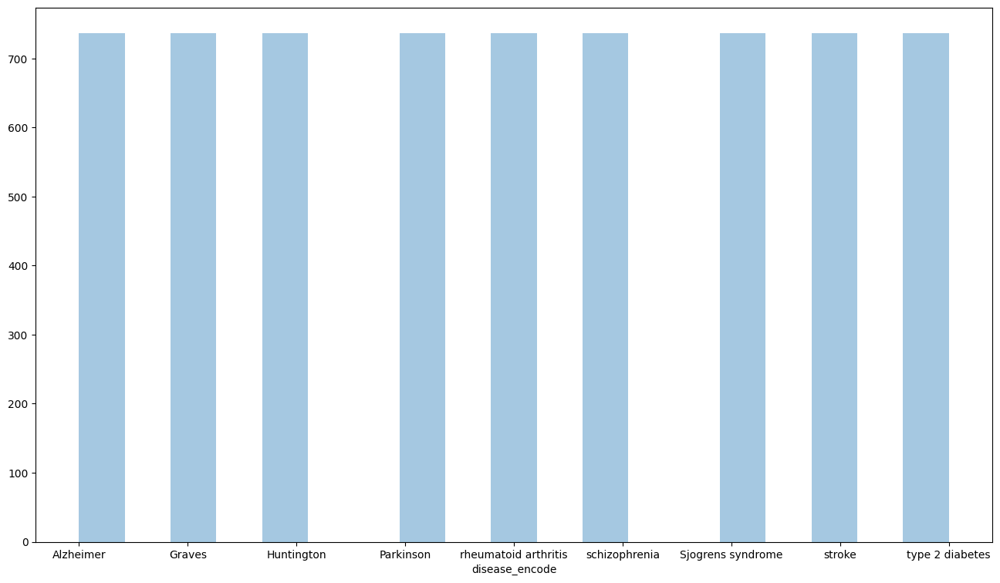

In [44]:
from collections import Counter
print('随机过采样后数据分布:',Counter(Disease_Resample))
Barplot=plt.figure(figsize=(16,9))
sns.distplot(Disease_Resample,hist=True,kde=False,rug=False)
plt.xticks(np.arange(0,9),DiseaseType)
plt.show()

训练机器学习模型

In [45]:
#数据集划分
Train_Data,Test_Data,Train_Disease,Test_Disease=train_test_split(Data_Resample,Disease_Resample,train_size=0.8,random_state=2024)
print('训练数据集规模为:{0},测试数据集规模为:{1}'.format(Train_Data.shape,Test_Data.shape))
print('训练数据集标签规模为:{0},测试数据集标签规模为:{1}'.format(Train_Disease.shape,Test_Disease.shape))

训练数据集规模为:(5306, 21),测试数据集规模为:(1327, 21)
训练数据集标签规模为:(5306,),测试数据集标签规模为:(1327,)


In [46]:
#查看数据集分布
print('训练数据集标签为:',Counter(Train_Disease))
print('测试数据集标签为:',Counter(Test_Disease))

训练数据集标签为: Counter({1: 604, 0: 601, 3: 601, 8: 589, 7: 589, 4: 587, 2: 585, 6: 575, 5: 575})
测试数据集标签为: Counter({6: 162, 5: 162, 2: 152, 4: 150, 8: 148, 7: 148, 3: 136, 0: 136, 1: 133})


In [47]:
#绘制3D曲面图函数
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
def Plot_Surface(title,x,y,z,xlabel,ylabel,zlabel):
    x_grid,y_grid=np.meshgrid(x,y)    #数据重构
    z_grid=np.array(z).reshape(x_grid.shape[0],x_grid.shape[1])
    surface_fig=plt.figure(figsize=(9,12))
    surface_ax=surface_fig.add_subplot(111,projection='3d')
    surface_ax.set_title(title)
    surface_plot=surface_ax.plot_surface(x_grid,y_grid,z_grid,cmap='rainbow',rstride=1, cstride=1,edgecolor='none')    #绘制曲面图
    #surface_ax.plot_wireframe(x_grid,y_grid,z_grid,color='black',rstride=1, cstride=1,antialiased=True,linewidth=0.5)    #绘制平面网格图
    surface_ax.set_xlabel(xlabel)
    surface_ax.set_ylabel(ylabel)
    surface_ax.set_zlabel(zlabel)
    surface_fig.colorbar(surface_plot,ax=surface_ax,shrink=0.5, aspect=4)
    plt.show()

100%|██████████| 100/100 [16:41<00:00, 10.01s/it]


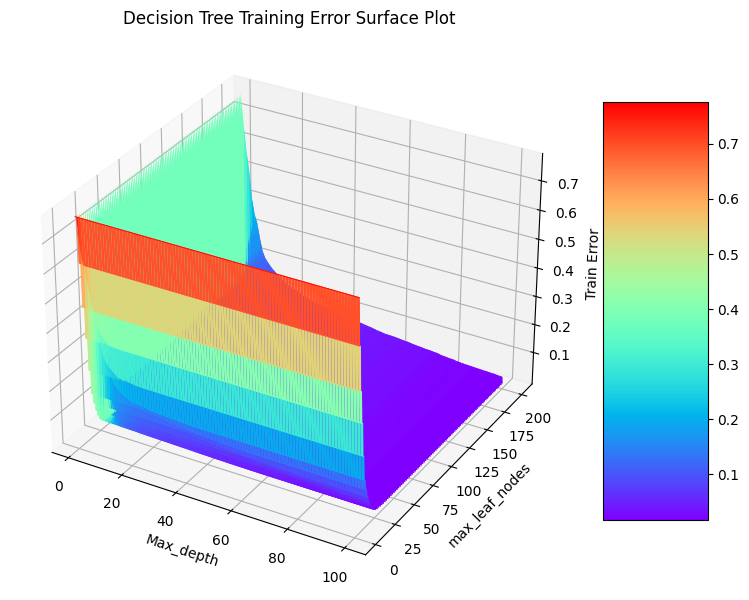

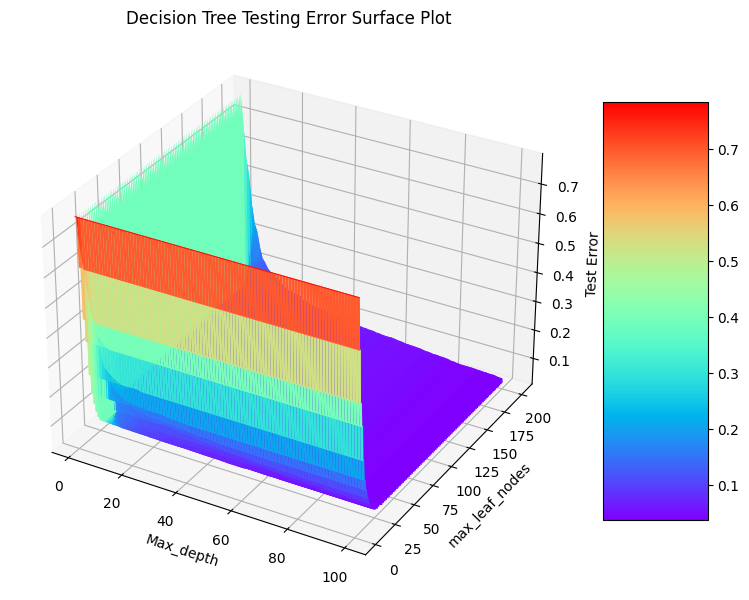

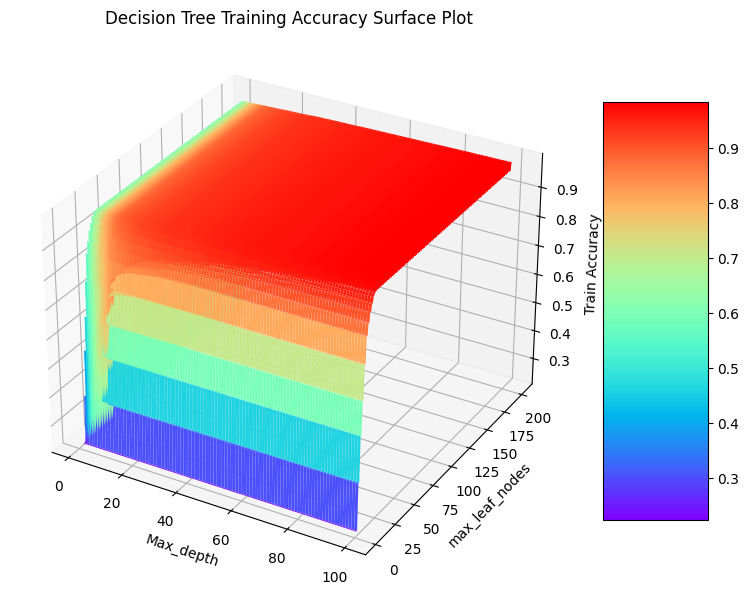

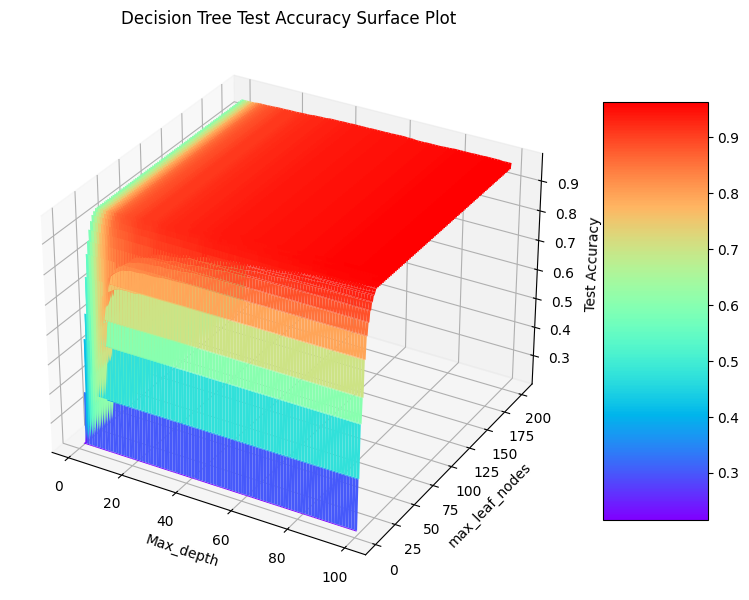

In [124]:
#训练决策树模型
from tqdm import tqdm
from sklearn.tree import DecisionTreeClassifier
depth_list=np.arange(1,101,1)     #最大树深度
maxleafnodes_list=np.arange(2,202,1)    #最大叶子节点数
train_error,test_error,train_accuracy,test_accuracy=[],[],[],[]
for depth in tqdm(depth_list):    #树深度
    for maxleaf in maxleafnodes_list:    #剪枝系数
        Model_DTC=DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=depth,random_state=2024,max_leaf_nodes=maxleaf)
        Model_DTC.fit(Train_Data,Train_Disease)    #训练模型
        train_error.append(1-Model_DTC.score(Train_Data,Train_Disease))    #训练数据
        test_error.append(1-Model_DTC.score(Test_Data,Test_Disease))    #测试误差
        train_accuracy.append(accuracy_score(Train_Disease,Model_DTC.predict(Train_Data)))    #训练精度
        test_accuracy.append(accuracy_score(Test_Disease,Model_DTC.predict(Test_Data)))    #测试精度
#绘制曲面图
Plot_Surface(title='Decision Tree Training Error Surface Plot',x=depth_list,y=maxleafnodes_list,z=train_error,
            xlabel='Max_depth',ylabel='max_leaf_nodes',zlabel='Train Error')    #训练误差
Plot_Surface(title='Decision Tree Testing Error Surface Plot',x=depth_list,y=maxleafnodes_list,z=test_error,
            xlabel='Max_depth',ylabel='max_leaf_nodes',zlabel='Test Error')    #测试误差
Plot_Surface(title='Decision Tree Training Accuracy Surface Plot',x=depth_list,y=maxleafnodes_list,z=train_accuracy,
            xlabel='Max_depth',ylabel='max_leaf_nodes',zlabel='Train Accuracy')    #训练精度
Plot_Surface(title='Decision Tree Test Accuracy Surface Plot',x=depth_list,y=maxleafnodes_list,z=test_accuracy,
            xlabel='Max_depth',ylabel='max_leaf_nodes',zlabel='Test Accuracy')    #测试精度

In [49]:
#悬着最佳参数训练决策树模型
Model_DTC=DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=40,random_state=2024,max_leaf_nodes=200)
Model_DTC.fit(Train_Data,Train_Disease)    #训练模型
Model_Evaluate(Model_DTC,Train_Data,Train_Disease,Test_Data,Test_Disease)

模型训练误差为:0.0028269883151149644,测试误差为:0.02788244159758857
模型训练准确率为:0.997173011684885,召回率为:0.997173011684885,f1分数为:0.997173011684885,精度为:0.997173011684885
模型测试准确率为:0.9721175584024114,召回率为:0.9721175584024114,f1分数为:0.9721175584024114,精度为:0.9721175584024114
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      0.98      0.99       601
      Graves disease       1.00      1.00      1.00       604
  Huntington disease       0.99      1.00      1.00       585
  Parkinsons disease       1.00      1.00      1.00       601
rheumatoid arthritis       1.00      1.00      1.00       587
       schizophrenia       1.00      0.99      1.00       575
    Sjogren syndrome       1.00      1.00      1.00       575
              stroke       1.00      1.00      1.00       589
     type 2 diabetes       0.99      1.00      1.00       589

            accuracy                           1.00      5306
           mac

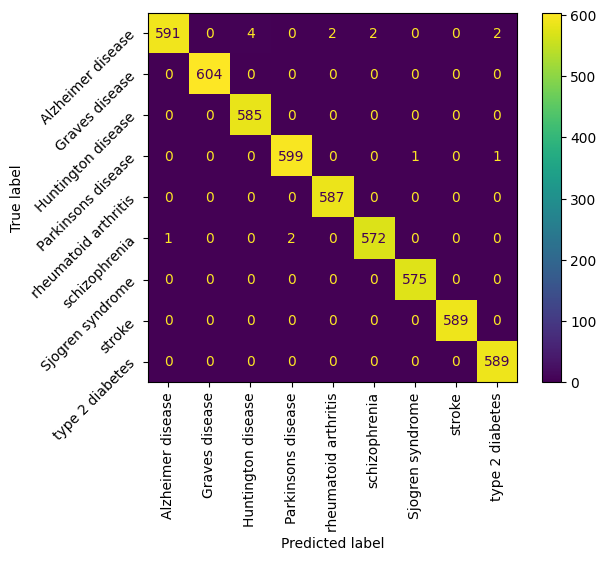

In [50]:
#可视化混淆矩阵
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
Label_class=['Alzheimer disease','Graves disease','Huntington disease','Parkinsons disease','rheumatoid arthritis',
             'schizophrenia','Sjogren syndrome','stroke','type 2 diabetes']
def Viz_Confusion_Matrix(model,X,y):
    y_pred=model.predict(X)
    con_matr=confusion_matrix(y, y_pred)
    con_matr=ConfusionMatrixDisplay(con_matr,display_labels=Label_class)
    con_matr.plot(include_values=True, cmap='viridis', xticks_rotation='horizontal', values_format='d', ax=None)
    con_matr.ax_.set_xticklabels(Label_class, rotation=90)  # 这里可以设置x轴标签的旋转角度 
    con_matr.ax_.set_yticklabels(Label_class, rotation=45)  # 这里可以设置y轴标签的旋转角度
Viz_Confusion_Matrix(Model_DTC,Train_Data,Train_Disease)    #可视化Xgboost模型混淆矩阵(训练)

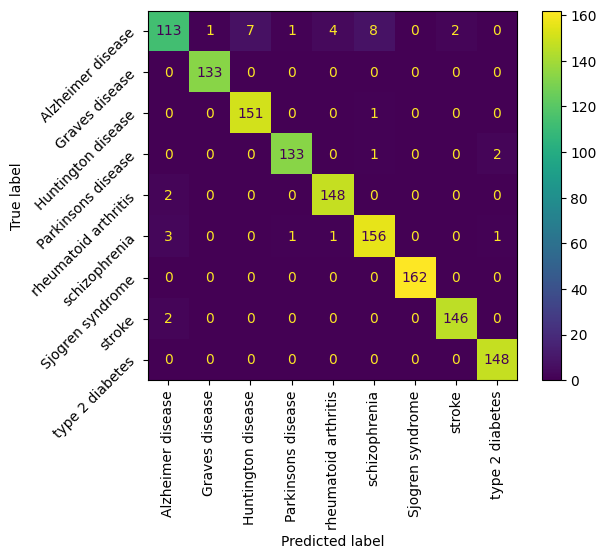

In [51]:
Viz_Confusion_Matrix(Model_DTC,Test_Data,Test_Disease)    #可视化Xgboost模型混淆矩阵(测试)

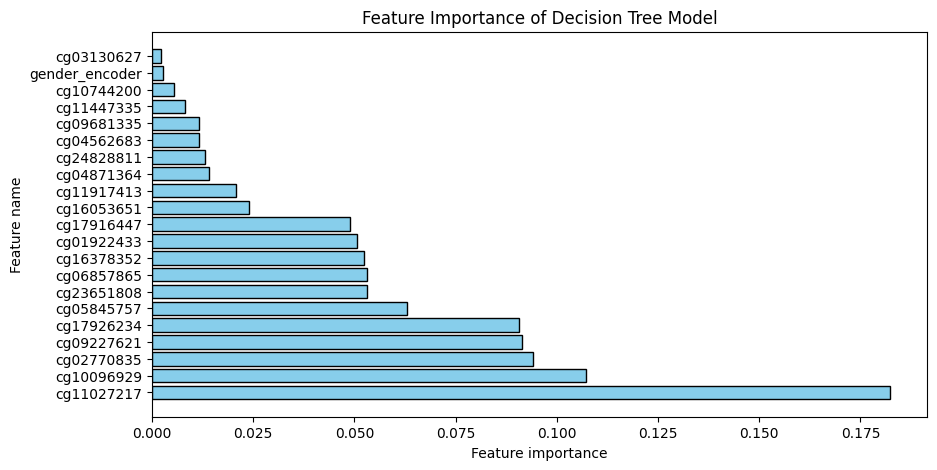

In [52]:
#绘制决策树模型特征重要性图
Feature_importance_DTC=DataFrame()
Feature_importance_DTC['fearure names']=Train_Data.columns    #特征列表
Feature_importance_DTC['fearure importance']=Model_DTC.feature_importances_    #特征重要性评分
Feature_importance_DTC=Feature_importance_DTC.sort_values('fearure importance',ascending=False)    #按照降序排序
plt.figure(figsize=(10, 5))
plt.title('Feature Importance of Decision Tree Model')
plt.barh(np.arange(1,22), Feature_importance_DTC.iloc[:,1],color='skyblue', edgecolor='black')
plt.ylabel('Feature name')  
plt.xlabel('Feature importance')
plt.yticks(np.arange(1,22),Feature_importance_DTC.iloc[:,0])
plt.show()

In [53]:
import joblib
joblib.dump(Model_DTC,'/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Model_DTC.pkl')

['/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Model_DTC.pkl']

100%|██████████| 100/100 [1:17:10<00:00, 46.30s/it]


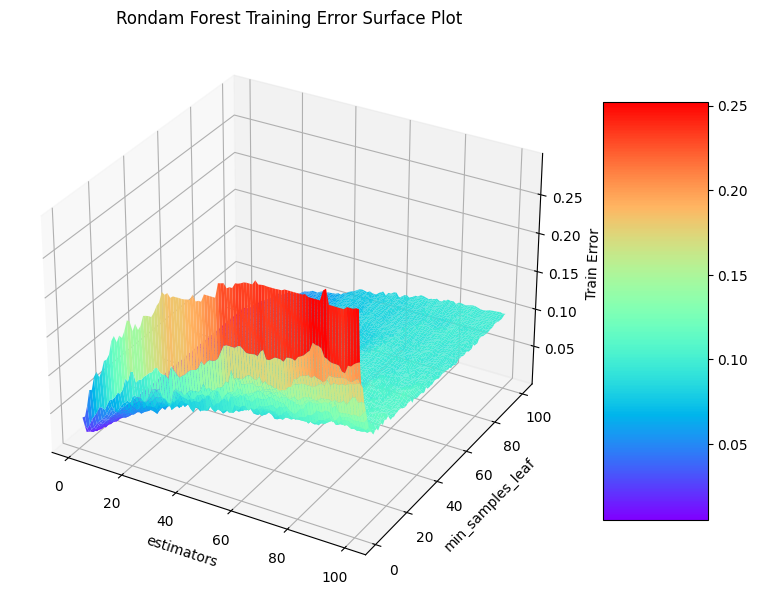

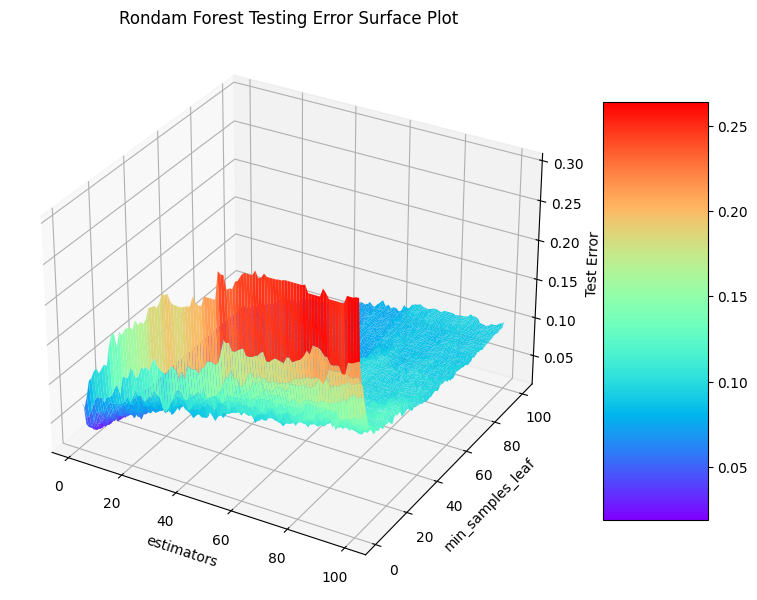

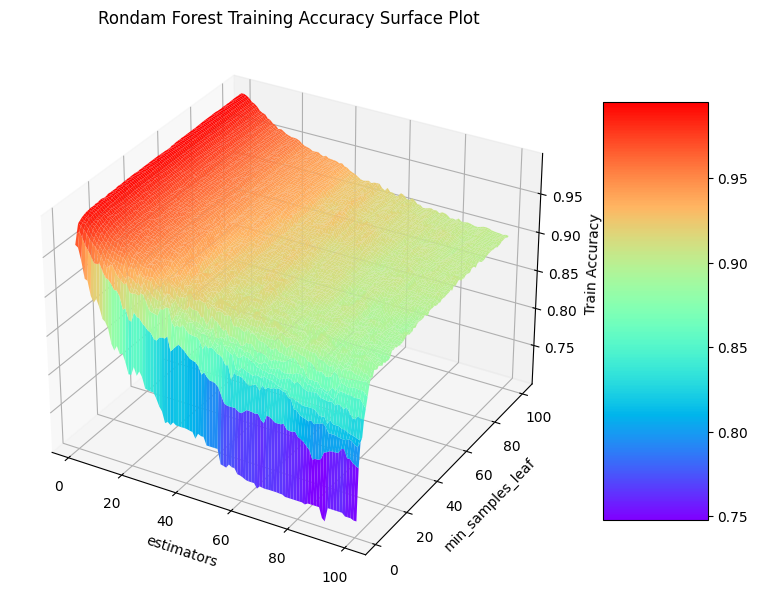

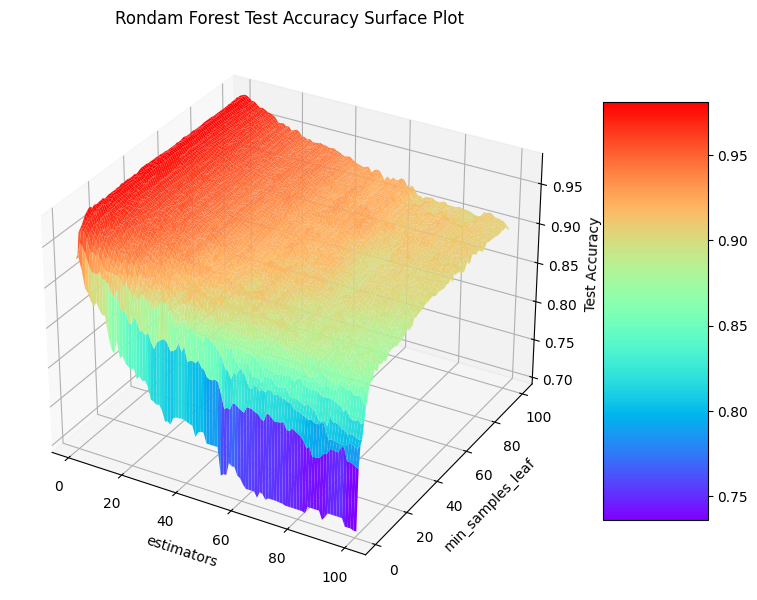

In [125]:
#训练随机森林模型
from tqdm import tqdm
from sklearn.ensemble import RandomForestClassifier
estimators=np.arange(1,101,1)    #学习器数量
MinSamplesLeaf=np.arange(1,101,1)    #设置叶子节点包含的最少的样本数
TrainError_forest,TestError_forest,TrainAccuracy_forest,TestAccuracy_forest=[],[],[],[]
for estimator in tqdm(estimators):    #学习器数量
    for minsamplesleaf in MinSamplesLeaf:
        Model_Forest=RandomForestClassifier(n_estimators=estimator,criterion='gini',
                                            max_depth=40,random_state=2024,max_leaf_nodes=200,min_samples_leaf=minsamplesleaf)
        Model_Forest.fit(Train_Data,Train_Disease)    #模型训练
        TrainError_forest.append(1-Model_Forest.score(Train_Data,Train_Disease))    #训练数据
        TestError_forest.append( 1-Model_Forest.score(Test_Data,Test_Disease))    #测试误差
        TrainAccuracy_forest.append(accuracy_score(Train_Disease,Model_Forest.predict(Train_Data)))    #训练精度
        TestAccuracy_forest.append(accuracy_score(Test_Disease,Model_Forest.predict(Test_Data)))    #测试精度
#绘制曲面图
Plot_Surface(title='Rondam Forest Training Error Surface Plot',x=estimators,y=MinSamplesLeaf,z=TrainError_forest,
            xlabel='estimators',ylabel='min_samples_leaf',zlabel='Train Error')    #训练误差
Plot_Surface(title='Rondam Forest Testing Error Surface Plot',x=estimators,y=MinSamplesLeaf,z=TestError_forest,
            xlabel='estimators',ylabel='min_samples_leaf',zlabel='Test Error')    #测试误差
Plot_Surface(title='Rondam Forest Training Accuracy Surface Plot',x=estimators,y=MinSamplesLeaf,z=TrainAccuracy_forest,
            xlabel='estimators',ylabel='min_samples_leaf',zlabel='Train Accuracy')    #训练精度
Plot_Surface(title='Rondam Forest Test Accuracy Surface Plot',x=estimators,y=MinSamplesLeaf,z=TestAccuracy_forest,
            xlabel='estimators',ylabel='min_samples_leaf',zlabel='Test Accuracy')    #测试精度

In [55]:
#训练随机森林模型
from sklearn.ensemble import RandomForestClassifier
Model_Forest=RandomForestClassifier(n_estimators=52,criterion='gini',
                                            max_depth=40,random_state=2024,max_leaf_nodes=200,min_samples_leaf=3)
Model_Forest.fit(Train_Data,Train_Disease)    #模型训练
Model_Evaluate(Model_Forest,Train_Data,Train_Disease,Test_Data,Test_Disease)

模型训练误差为:0.006219374293252922,测试误差为:0.018085908063300682
模型训练准确率为:0.9937806257067471,召回率为:0.9937806257067471,f1分数为:0.9937806257067471,精度为:0.9937806257067471
模型测试准确率为:0.9819140919366993,召回率为:0.9819140919366993,f1分数为:0.9819140919366993,精度为:0.9819140919366993
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       0.99      0.96      0.98       601
      Graves disease       1.00      1.00      1.00       604
  Huntington disease       0.99      0.99      0.99       585
  Parkinsons disease       0.99      1.00      1.00       601
rheumatoid arthritis       0.99      1.00      0.99       587
       schizophrenia       1.00      0.99      0.99       575
    Sjogren syndrome       1.00      1.00      1.00       575
              stroke       0.99      1.00      1.00       589
     type 2 diabetes       1.00      1.00      1.00       589

            accuracy                           0.99      5306
          

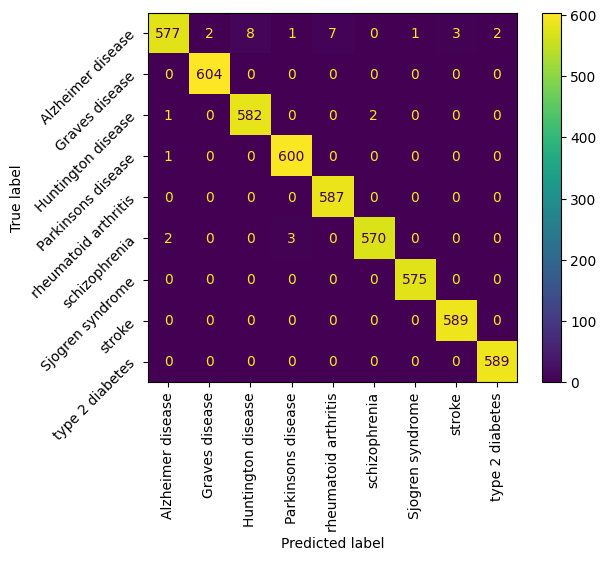

In [56]:
Viz_Confusion_Matrix(Model_Forest,Train_Data,Train_Disease)    #可视化Xgboost模型混淆矩阵(训练)

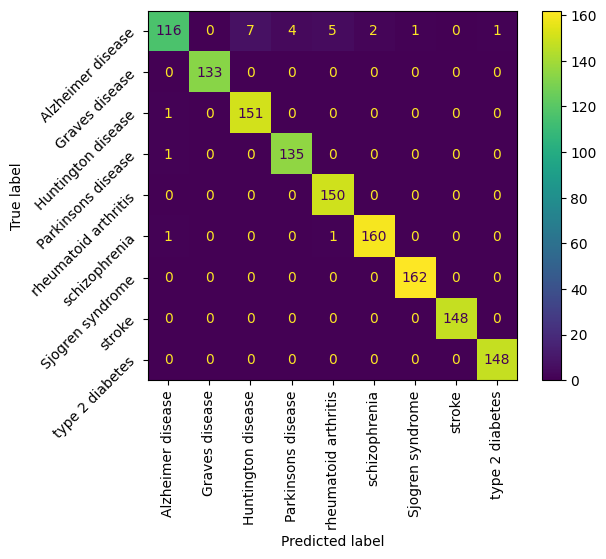

In [57]:
Viz_Confusion_Matrix(Model_Forest,Test_Data,Test_Disease)    #可视化Xgboost模型混淆矩阵(测试)

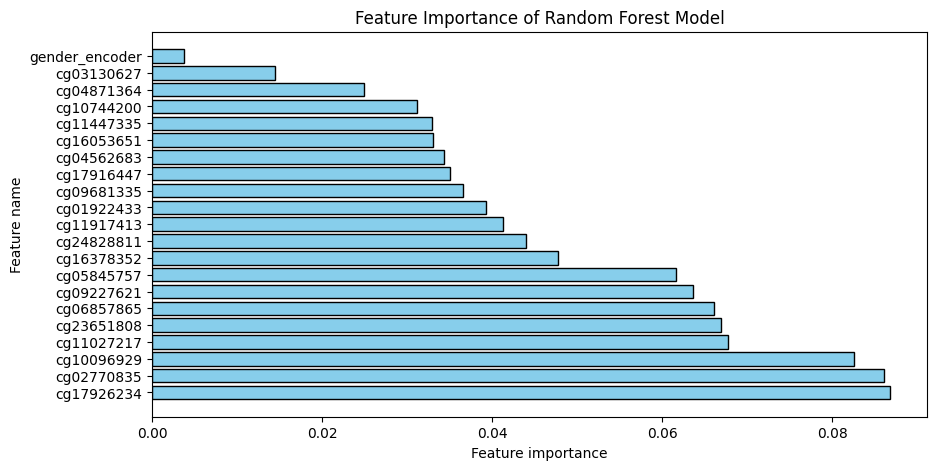

In [58]:
#绘制决策树模型特征重要性图
Feature_importance_Forest=DataFrame()
Feature_importance_Forest['fearure names']=Train_Data.columns    #特征列表
Feature_importance_Forest['fearure importance']=Model_Forest.feature_importances_    #特征重要性评分
Feature_importance_Forest=Feature_importance_Forest.sort_values('fearure importance',ascending=False)    #按照降序排序
plt.figure(figsize=(10, 5))
plt.title('Feature Importance of Random Forest Model')
plt.barh(np.arange(1,22), Feature_importance_Forest.iloc[:,1],color='skyblue', edgecolor='black')
plt.ylabel('Feature name')  
plt.xlabel('Feature importance')
plt.yticks(np.arange(1,22),Feature_importance_Forest.iloc[:,0])
plt.show()

In [59]:
joblib.dump(Model_Forest,'/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Model_Forest.pkl')

['/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Model_Forest.pkl']

100%|██████████| 10/10 [00:10<00:00,  1.06s/it]


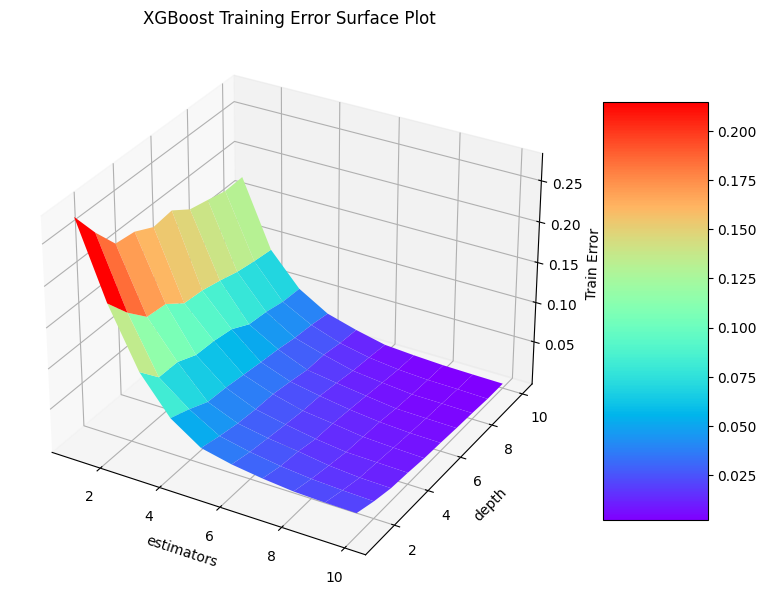

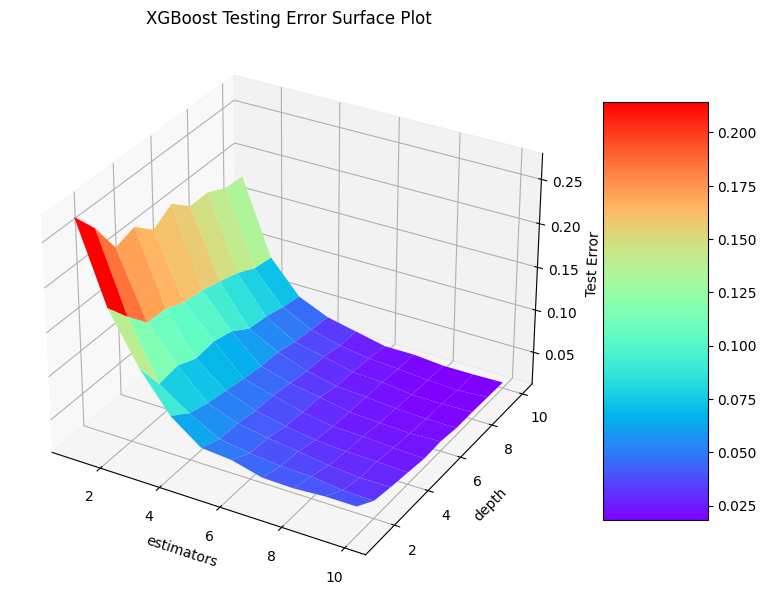

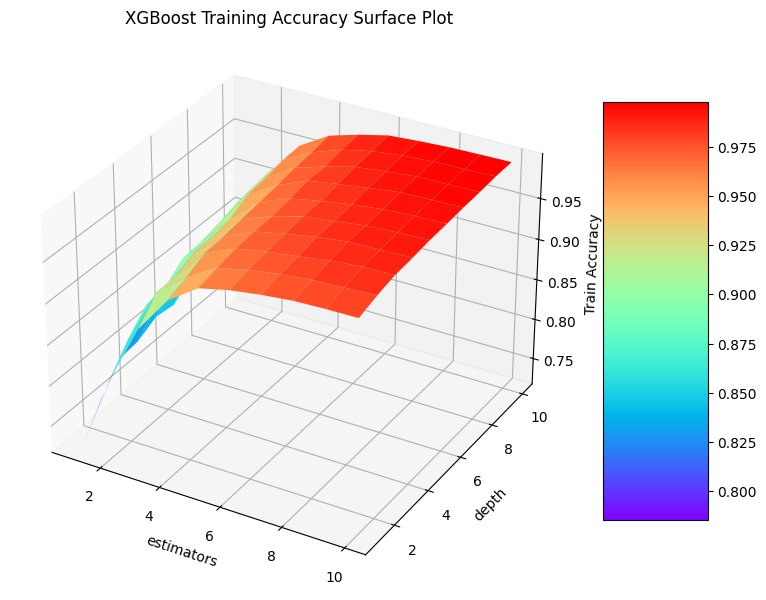

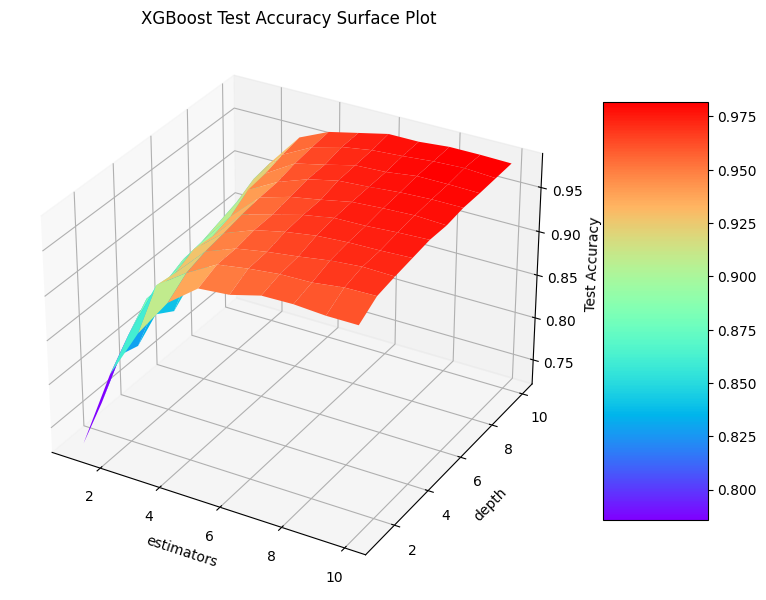

In [60]:
#训练XGBoost模型
from tqdm import tqdm
Estimator_list=np.arange(1,11,1)
depth_list=np.arange(1,11,1)
TrainError_xgb,TestError_xgb,TrainAccuracy_xgb,TestAccuracy_xgb=[],[],[],[]
for estimator in tqdm(Estimator_list):    #学习器数量
    for depth in depth_list:
        Model_XGB=XGBClassifier(booster='gbtree',n_estimators=estimator,max_depth=depth,random_state=2024,
                                             objective='multi-softmax',gpu_id=0, tree_method='gpu_hist')
        Model_XGB.fit(Train_Data,Train_Disease)    #模型训练
        TrainError_xgb.append(1-Model_XGB.score(Train_Data,Train_Disease))    #训练数据
        TestError_xgb.append( 1-Model_XGB.score(Test_Data,Test_Disease))    #测试误差
        TrainAccuracy_xgb.append(accuracy_score(Train_Disease,Model_XGB.predict(Train_Data)))    #训练精度
        TestAccuracy_xgb.append(accuracy_score(Test_Disease,Model_XGB.predict(Test_Data)))    #测试精度
#绘制曲面图
Plot_Surface(title='XGBoost Training Error Surface Plot',x=Estimator_list,y=depth_list,z=TrainError_xgb,
            xlabel='estimators',ylabel='depth',zlabel='Train Error')    #训练误差
Plot_Surface(title='XGBoost Testing Error Surface Plot',x=Estimator_list,y=depth_list,z=TestError_xgb,
            xlabel='estimators',ylabel='depth',zlabel='Test Error')    #测试误差
Plot_Surface(title='XGBoost Training Accuracy Surface Plot',x=Estimator_list,y=depth_list,z=TrainAccuracy_xgb,
            xlabel='estimators',ylabel='depth',zlabel='Train Accuracy')    #训练精度
Plot_Surface(title='XGBoost Test Accuracy Surface Plot',x=Estimator_list,y=depth_list,z=TestAccuracy_xgb,
            xlabel='estimators',ylabel='depth',zlabel='Test Accuracy')    #测试精度

In [61]:
#训练XGBoost模型
Model_XGB=XGBClassifier(booster='gbtree',n_estimators=500,max_depth=17,random_state=2024,min_child_weight=1,
                                             objective='multi-softmax',gpu_id=0, tree_method='gpu_hist')
Model_XGB.fit(Train_Data,Train_Disease)    #模型训练
Model_Evaluate(Model_XGB,Train_Data,Train_Disease,Test_Data,Test_Disease)

模型训练误差为:0.0,测试误差为:0.012810851544837965
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.987189148455162,召回率为:0.987189148455162,f1分数为:0.987189148455162,精度为:0.987189148455162
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       601
      Graves disease       1.00      1.00      1.00       604
  Huntington disease       1.00      1.00      1.00       585
  Parkinsons disease       1.00      1.00      1.00       601
rheumatoid arthritis       1.00      1.00      1.00       587
       schizophrenia       1.00      1.00      1.00       575
    Sjogren syndrome       1.00      1.00      1.00       575
              stroke       1.00      1.00      1.00       589
     type 2 diabetes       1.00      1.00      1.00       589

            accuracy                           1.00      5306
           macro avg       1.00      1.00      1.00      5306
        weighted avg       1.

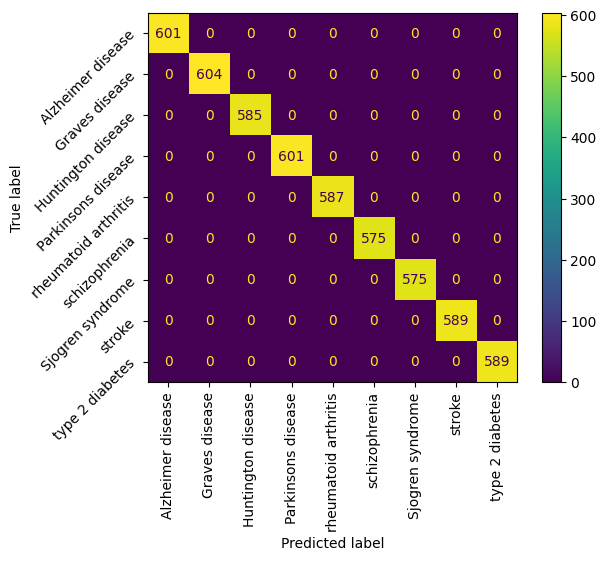

In [62]:
Viz_Confusion_Matrix(Model_XGB,Train_Data,Train_Disease)    #可视化Xgboost模型混淆矩阵(训练)

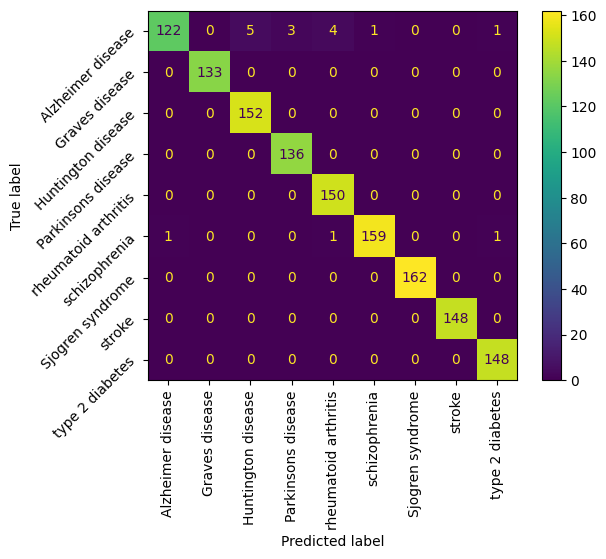

In [63]:
Viz_Confusion_Matrix(Model_XGB,Test_Data,Test_Disease)    #可视化Xgboost模型混淆矩阵(测试)

<Axes: title={'center': 'Feature importance'}, xlabel='gain', ylabel='Features'>

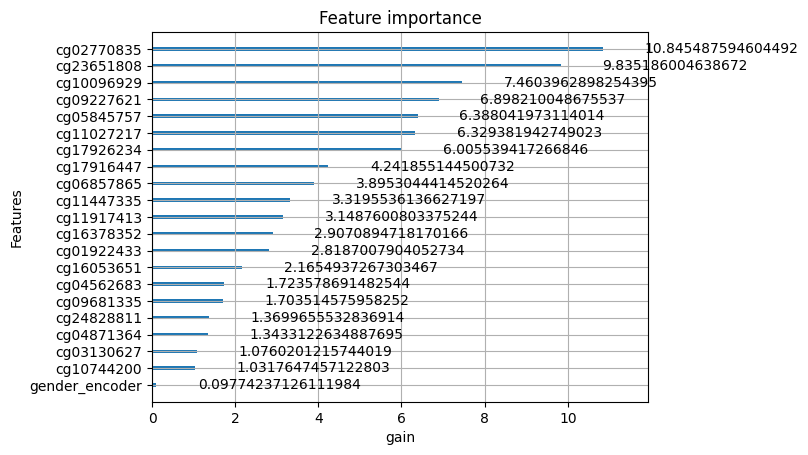

In [64]:
#绘制特征重要性图
from xgboost import plot_importance
plot_importance(Model_XGB,max_num_features=21,importance_type='gain',xlabel='gain')

In [65]:
joblib.dump(Model_XGB,'/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Model_XGB.pkl')

['/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Model_XGB.pkl']

In [ ]:
from lightgbm import LGBMClassifier
subsample_list=np.arange(0.1,0.99,0.1)
colsample_list=np.arange(0.1,0.99,0.1)
TrainError_LGB,TestError_LGB,TrainAccuracy_LGB,TestAccuracy_LGB=[],[],[],[]
for subsample in tqdm(subsample_list):    #学习器数量
    for colsample in colsample_list:
        Model_LGB=LGBMClassifier(subsample=subsample,colsample_bytree=colsample,n_jobs=-1)
        Model_LGB.fit(Train_Data,Train_Disease)
        TrainError_LGB.append(1-Model_LGB.score(Train_Data,Train_Disease))    #训练数据
        TestError_LGB.append( 1-Model_LGB.score(Test_Data,Test_Disease))    #测试误差
        TrainAccuracy_LGB.append(accuracy_score(Train_Disease,Model_LGB.predict(Train_Data)))    #训练精度
        TestAccuracy_LGB.append(accuracy_score(Test_Disease,Model_LGB.predict(Test_Data)))    #测试精度

In [ ]:
#绘制曲面图
Plot_Surface(title='LightGBM Training Error Surface Plot',x=subsample_list,y=colsample_list,z=TrainError_LGB,
            xlabel='subsample',ylabel='colsample_bytree',zlabel='Train Error')    #训练误差
Plot_Surface(title='LightGBM Testing Error Surface Plot',x=subsample_list,y=colsample_list,z=TestError_LGB,
            xlabel='subsample',ylabel='colsample_bytree',zlabel='Test Error')    #测试误差
Plot_Surface(title='LightGBM Training Accuracy Surface Plot',x=subsample_list,y=colsample_list,z=TrainAccuracy_LGB,
            xlabel='subsample',ylabel='colsample_bytree',zlabel='Train Accuracy')    #训练精度
Plot_Surface(title='LightGBM Test Accuracy Surface Plot',x=subsample_list,y=colsample_list,z=TestAccuracy_LGB,
            xlabel='subsample',ylabel='colsample_bytree',zlabel='Test Accuracy')    #测试精度

In [ ]:
#训练LGB模型
from lightgbm import LGBMClassifier
Model_LGB=LGBMClassifier(subsample=0.5,colsample_bytree=0.54,n_jobs=-1)
Model_LGB.fit(Train_Data,Train_Disease)

In [68]:
Model_Evaluate(Model_LGB,Train_Data,Train_Disease,Test_Data,Test_Disease)

模型训练误差为:0.0,测试误差为:0.009796533534287888
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.9902034664657121,召回率为:0.9902034664657121,f1分数为:0.9902034664657121,精度为:0.9902034664657121
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       601
      Graves disease       1.00      1.00      1.00       604
  Huntington disease       1.00      1.00      1.00       585
  Parkinsons disease       1.00      1.00      1.00       601
rheumatoid arthritis       1.00      1.00      1.00       587
       schizophrenia       1.00      1.00      1.00       575
    Sjogren syndrome       1.00      1.00      1.00       575
              stroke       1.00      1.00      1.00       589
     type 2 diabetes       1.00      1.00      1.00       589

            accuracy                           1.00      5306
           macro avg       1.00      1.00      1.00      5306
        weighted avg     

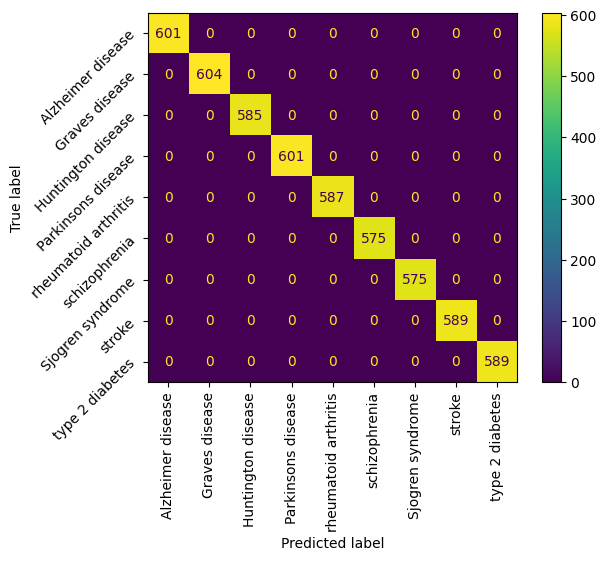

In [69]:
Viz_Confusion_Matrix(Model_LGB,Train_Data,Train_Disease)    #可视化Xgboost模型混淆矩阵(训练)

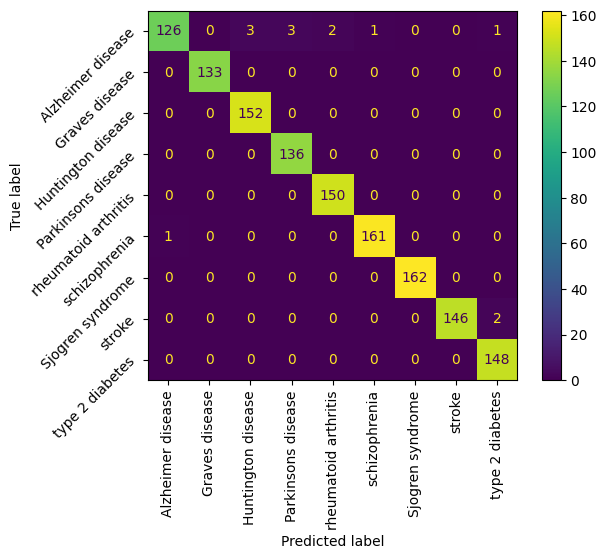

In [70]:
Viz_Confusion_Matrix(Model_LGB,Test_Data,Test_Disease)    #可视化Xgboost模型混淆矩阵(测试)

<Axes: title={'center': 'Feature importance'}, xlabel='gain', ylabel='Features'>

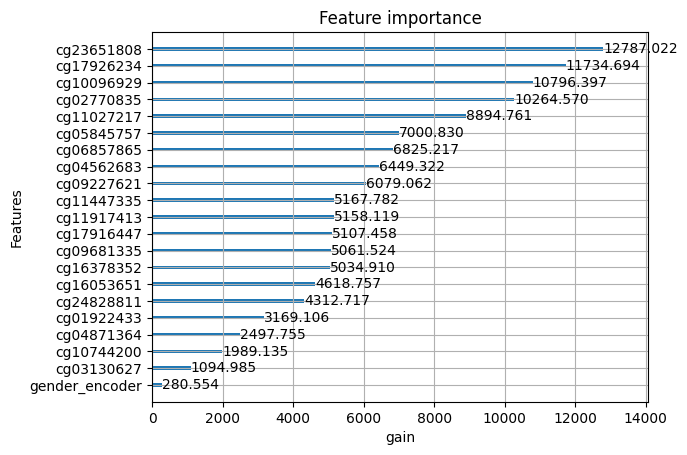

In [71]:
#输出特征重要性
from lightgbm import plot_importance
plot_importance(Model_LGB,max_num_features=21,importance_type='gain',xlabel='gain')

In [72]:
#保存模型
import joblib
joblib.dump(Model_LGB,'/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Model_LGB.pkl')

['/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Model_LGB.pkl']

In [ ]:
#训练catBoost模型
from catboost import CatBoostClassifier
Model_Cat=CatBoostClassifier(learning_rate=0.6, depth=10, bootstrap_type='Bernoulli',
                            random_seed=2024,od_type='Iter', od_wait=100)
Model_Cat.fit(Train_Data,Train_Disease)

In [74]:
Model_Evaluate(Model_Cat,Train_Data,Train_Disease,Test_Data,Test_Disease)

模型训练误差为:0.0,测试误差为:0.012810851544837965
模型训练准确率为:1.0,召回率为:1.0,f1分数为:1.0,精度为:1.0
模型测试准确率为:0.987189148455162,召回率为:0.987189148455162,f1分数为:0.987189148455162,精度为:0.987189148455162
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

   Alzheimer disease       1.00      1.00      1.00       601
      Graves disease       1.00      1.00      1.00       604
  Huntington disease       1.00      1.00      1.00       585
  Parkinsons disease       1.00      1.00      1.00       601
rheumatoid arthritis       1.00      1.00      1.00       587
       schizophrenia       1.00      1.00      1.00       575
    Sjogren syndrome       1.00      1.00      1.00       575
              stroke       1.00      1.00      1.00       589
     type 2 diabetes       1.00      1.00      1.00       589

            accuracy                           1.00      5306
           macro avg       1.00      1.00      1.00      5306
        weighted avg       1.

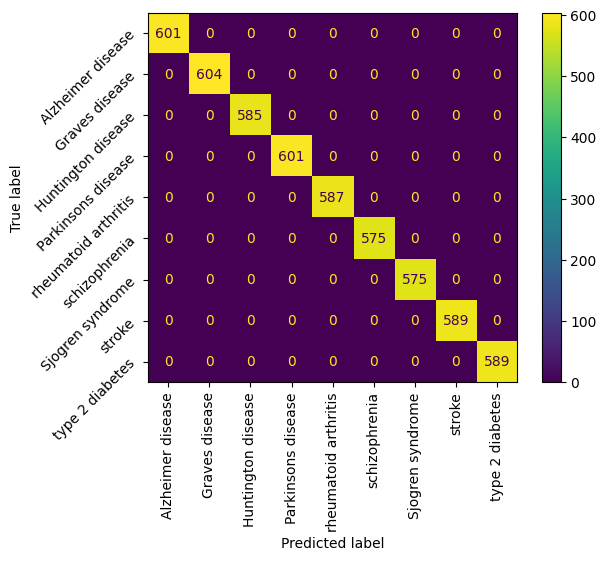

In [75]:
Viz_Confusion_Matrix(Model_Cat,Train_Data,Train_Disease)    #可视化Xgboost模型混淆矩阵(训练)

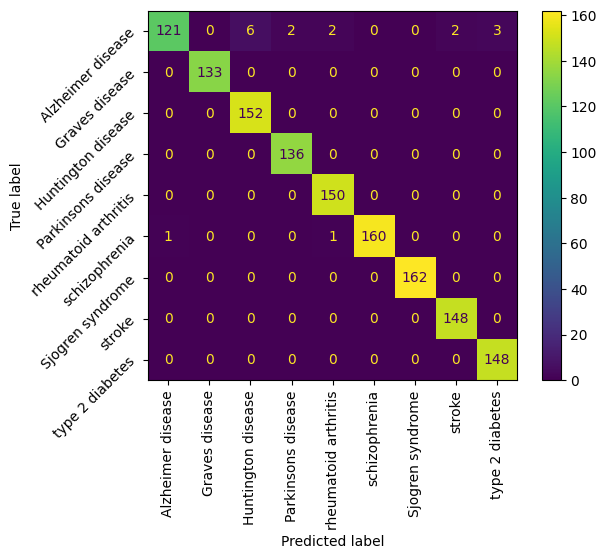

In [76]:
Viz_Confusion_Matrix(Model_Cat,Test_Data,Test_Disease)    #可视化Xgboost模型混淆矩阵(测试)

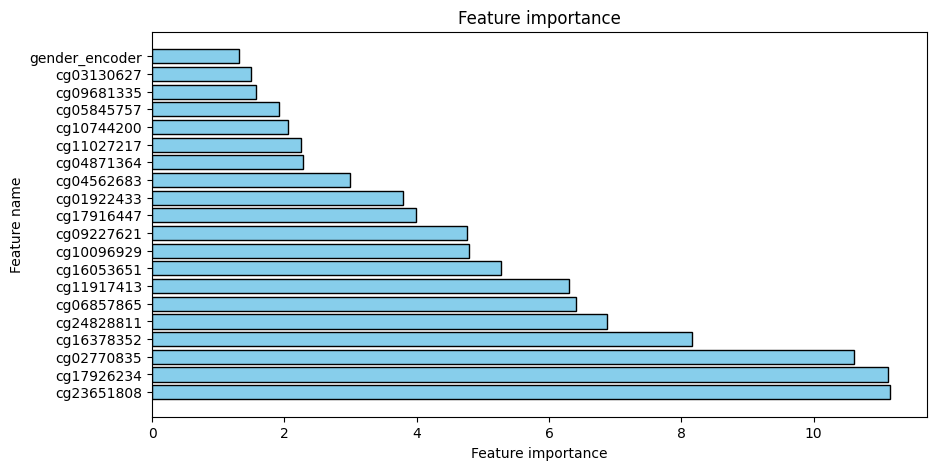

In [77]:
#绘制CatBoost模型特征重要性评分
Feature_importance_Cat=DataFrame()
Feature_importance_Cat['fearure names']=Train_Data.columns    #特征列表
Feature_importance_Cat['fearure importance']=Model_Cat.get_feature_importance()    #特征重要性评分
Feature_importance_Cat=Feature_importance_Cat.sort_values('fearure importance',ascending=False)    #按照降序排序
plt.figure(figsize=(10, 5))
plt.title('Feature importance')
plt.barh(np.arange(1,21), Feature_importance_Cat.iloc[:20,1],color='skyblue', edgecolor='black')
plt.ylabel('Feature name')  
plt.xlabel('Feature importance')
plt.yticks(np.arange(1,21),Feature_importance_Cat.iloc[:20,0])
plt.show()

In [78]:
joblib.dump(Model_Cat,'/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Model_Cat.pkl')

['/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/Model_Cat.pkl']

载入SHAP

In [121]:
import shap
LGBExplainer_Train=shap.TreeExplainer(Model_LGB)
Train_ShapValue=LGBExplainer_Train.shap_values(Train_Data)

In [122]:
Train_ShapValue2=LGBExplainer(Train_Data)

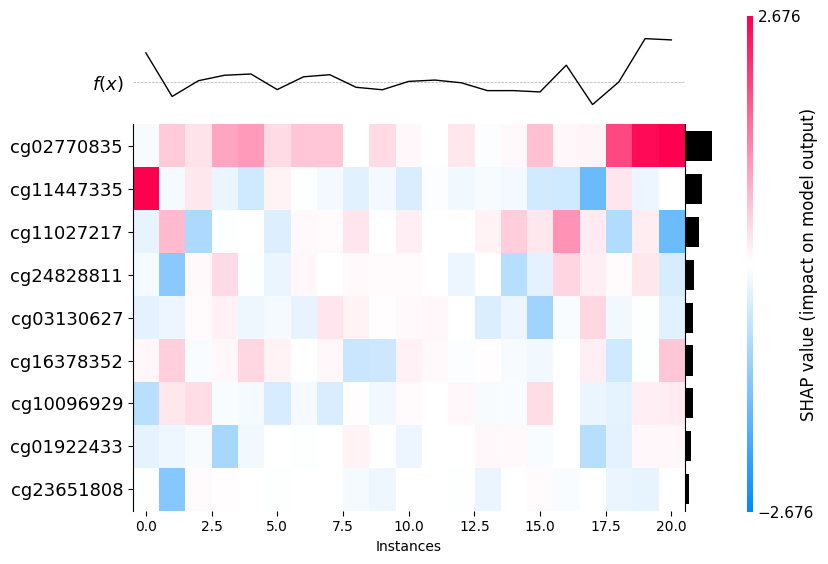

In [90]:
shap.plots.heatmap(Train_ShapValue2[0])

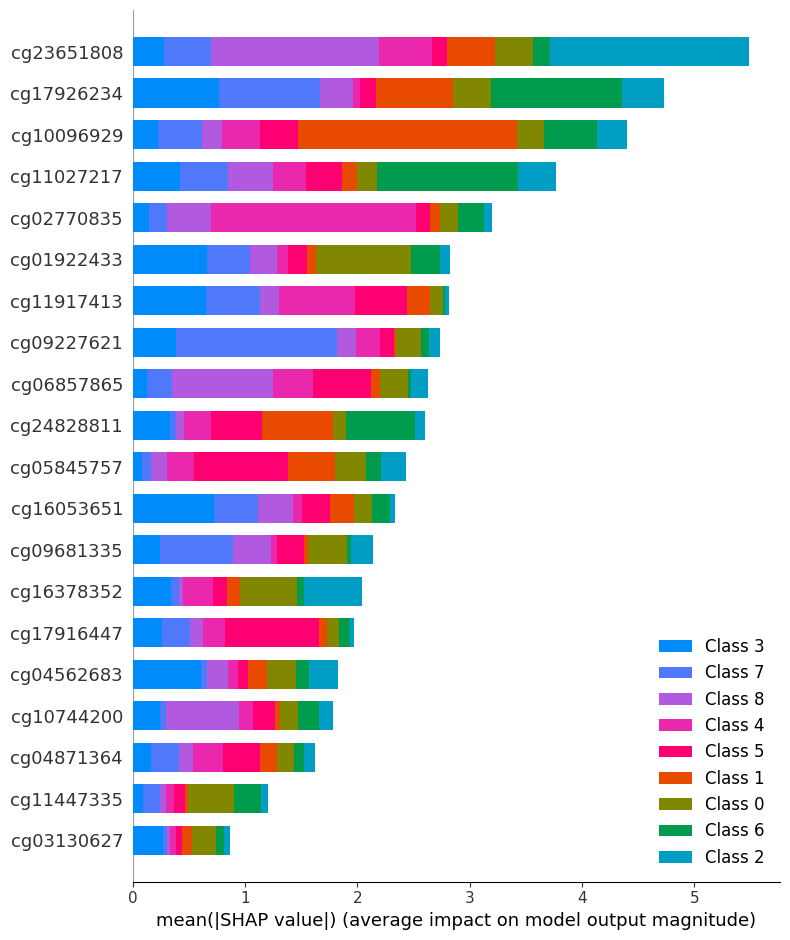

In [91]:
shap.summary_plot(Train_ShapValue,Train_Data)

In [79]:
import shap
LGBExplainer=shap.TreeExplainer(Model_LGB)
Test_ShapValue=LGBExplainer.shap_values(Test_Data)

In [80]:
Test_ShapValue2=LGBExplainer(Test_Data)

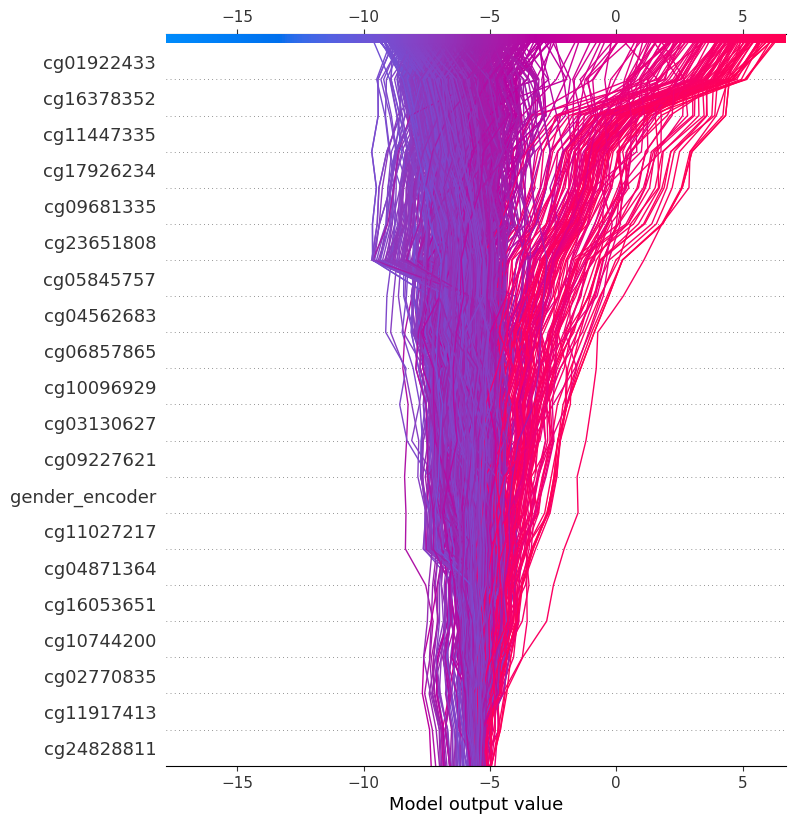

In [81]:
shap.decision_plot(LGBExplainer.expected_value[0],Test_ShapValue[0],Test_Data)

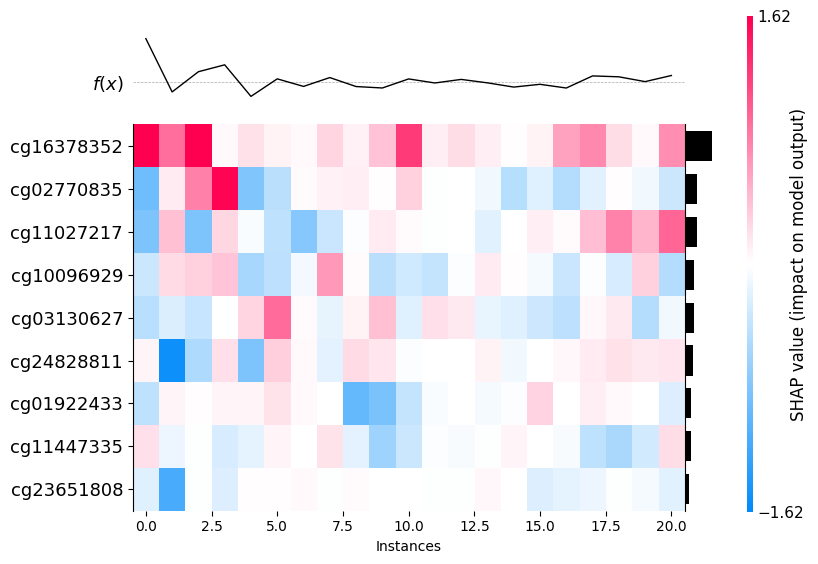

In [82]:
shap.plots.heatmap(Test_ShapValue2[0])

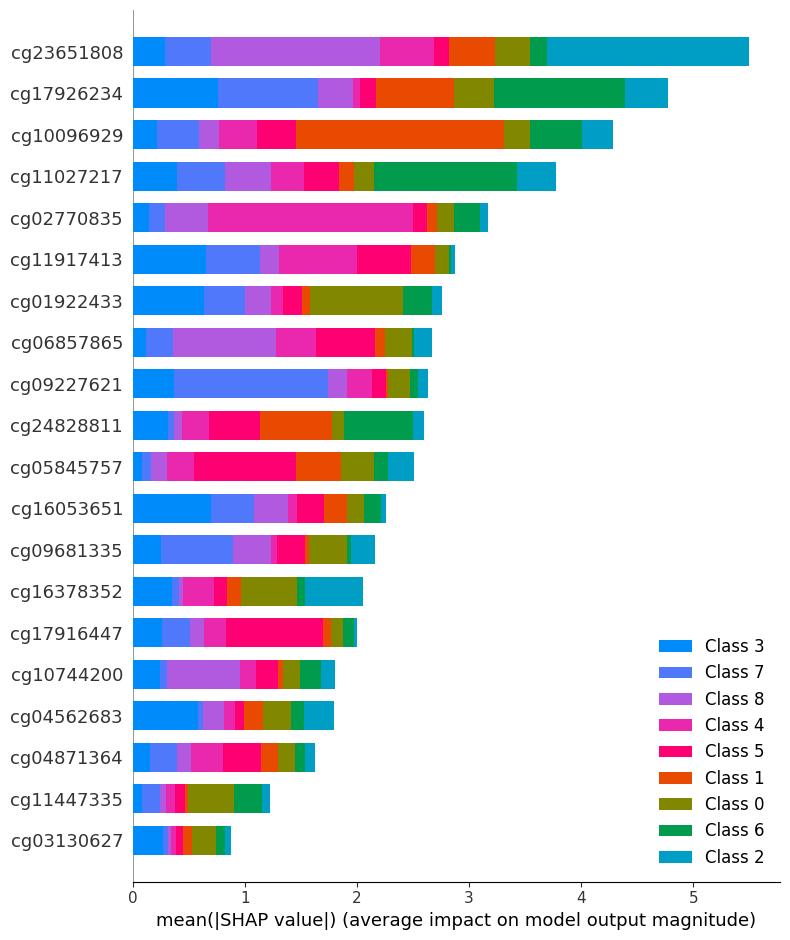

In [83]:
shap.summary_plot(Test_ShapValue,Test_Data)

构建深度神经网络进行数据分析

In [93]:
#数据集划分
Data_DL,TestData_DL,Disease_DL,TestDisease_DL=train_test_split(Data_Resample,Disease_Resample,train_size=0.8,random_state=2024)
TrainData_DL,ValidData_DL,TrainDisease_DL,ValidDisease_DL=train_test_split(Data_DL,Disease_DL,train_size=0.8,random_state=2024)
print('训练数据集规模为:{0},验证数据集规模为:{1},测试数据集规模为:{2}'.format(TrainData_DL.shape,ValidData_DL.shape,TestData_DL.shape))
print('训练数据集标签规模为:{0},验证数据集标签规模为:{1},测试数据集标签规模为:{2}'.format(TrainDisease_DL.shape,ValidDisease_DL.shape,TestDisease_DL.shape))

训练数据集规模为:(4244, 21),验证数据集规模为:(1062, 21),测试数据集规模为:(1327, 21)
训练数据集标签规模为:(4244,),验证数据集标签规模为:(1062,),测试数据集标签规模为:(1327,)


In [94]:
#查看数据分布
print('训练数据集标签分布:',Counter(TrainDisease_DL))
print('验证数据集标签分布:',Counter(ValidDisease_DL))
print('测试数据集标签分布:',Counter(TestDisease_DL))

训练数据集标签分布: Counter({0: 487, 7: 485, 3: 483, 2: 474, 1: 470, 4: 469, 5: 464, 8: 463, 6: 449})
验证数据集标签分布: Counter({1: 134, 8: 126, 6: 126, 3: 118, 4: 118, 0: 114, 5: 111, 2: 111, 7: 104})
测试数据集标签分布: Counter({6: 162, 5: 162, 2: 152, 4: 150, 8: 148, 7: 148, 3: 136, 0: 136, 1: 133})


In [95]:
#构建数据输入流
TrainData_DL=tf.data.Dataset.from_tensor_slices((TrainData_DL,TrainDisease_DL)).repeat(100)    #训练数据集
TrainData_DL=TrainData_DL.shuffle(buffer_size=10000)
TrainData_DL=TrainData_DL.batch(batch_size=1000).prefetch(tf.data.experimental.AUTOTUNE)
ValidData_DL=tf.data.Dataset.from_tensor_slices((ValidData_DL,ValidDisease_DL)).repeat(100)    #验证数据集
ValidData_DL=ValidData_DL.shuffle(buffer_size=10000)
ValidData_DL=ValidData_DL.batch(batch_size=1000).prefetch(tf.data.experimental.AUTOTUNE)
TestData_DL=tf.data.Dataset.from_tensor_slices((TestData_DL,TestDisease_DL)).repeat(100)     #测试数据集
TestData_DL=TestData_DL.shuffle(buffer_size=10000)
TestData_DL=TestData_DL.batch(batch_size=1000).prefetch(tf.data.experimental.AUTOTUNE)

In [132]:
#搭建网络
from tensorflow import keras
FNN=keras.models.Sequential()
FNN.add(keras.layers.Input(shape=[21]))    #输入层
FNN.add(keras.layers.Dense(42,activation='relu',kernel_initializer='lecun_normal',
                           kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(63,activation='relu',kernel_initializer='lecun_normal',
                          kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.BatchNormalization())
FNN.add(keras.layers.Dropout(rate=0))
FNN.add(keras.layers.Dense(126,activation='relu',kernel_initializer='lecun_normal',
                           kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(126,activation='relu',kernel_initializer='lecun_normal',
                          kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.BatchNormalization())
FNN.add(keras.layers.Dropout(rate=0))
FNN.add(keras.layers.Dense(252,activation='relu',kernel_initializer='lecun_normal',
                           kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(252,activation='relu',kernel_initializer='lecun_normal',
                          kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.BatchNormalization())
FNN.add(keras.layers.Dropout(rate=0))
FNN.add(keras.layers.Dense(504,activation='relu',kernel_initializer='lecun_normal',
                           kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(504,activation='relu',kernel_initializer='lecun_normal',
                          kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.BatchNormalization())
FNN.add(keras.layers.Dropout(rate=0))
FNN.add(keras.layers.Dense(504,activation='relu',kernel_initializer='lecun_normal',
                           kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(504,activation='relu',kernel_initializer='lecun_normal',
                          kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.BatchNormalization())
FNN.add(keras.layers.Dropout(rate=0))
FNN.add(keras.layers.Dense(252,activation='relu',kernel_initializer='lecun_normal',
                           kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(252,activation='relu',kernel_initializer='lecun_normal',
                          kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.BatchNormalization())
FNN.add(keras.layers.Dropout(rate=0))
FNN.add(keras.layers.Dense(126,activation='relu',kernel_initializer='lecun_normal',
                           kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(126,activation='relu',kernel_initializer='lecun_normal',
                          kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.BatchNormalization())
FNN.add(keras.layers.Dropout(rate=0))
FNN.add(keras.layers.Dense(64,activation='relu',kernel_initializer='lecun_normal',
                           kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(64,activation='relu',kernel_initializer='lecun_normal',
                          kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.BatchNormalization())
FNN.add(keras.layers.Dropout(rate=0))
FNN.add(keras.layers.Dense(36,activation='relu',kernel_initializer='lecun_normal',
                           kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(36,activation='relu',kernel_initializer='lecun_normal',
                          kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.BatchNormalization())
FNN.add(keras.layers.Dropout(rate=0))
FNN.add(keras.layers.Dense(27,activation='relu',kernel_initializer='lecun_normal',
                           kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(27,activation='relu',kernel_initializer='lecun_normal',
                          kernel_regularizer=keras.regularizers.l1_l2(0.01,0.01),kernel_constraint=keras.constraints.max_norm(1)))
FNN.add(keras.layers.Dense(9,activation='softmax'))    #输出层
FNN.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_54 (Dense)            (None, 42)                924       
                                                                 
 dense_55 (Dense)            (None, 63)                2709      
                                                                 
 batch_normalization_24 (Bat  (None, 63)               252       
 chNormalization)                                                
                                                                 
 dropout_24 (Dropout)        (None, 63)                0         
                                                                 
 dense_56 (Dense)            (None, 126)               8064      
                                                                 
 dense_57 (Dense)            (None, 126)               16002     
                                                      

In [134]:
#模型编译集训练 
Train_epoch=300
Lr_scheduler=keras.callbacks.ReduceLROnPlateau(factor=0.5,patience=10)    #学习率性能调度
Checkpoint=keras.callbacks.ModelCheckpoint('FNN_Net',save_best_only=True)    #设置检查点
Earlystoping=keras.callbacks.EarlyStopping(patience=100,restore_best_weights=True)    #设置提前停止
FNN.compile(loss='sparse_categorical_crossentropy',optimizer=keras.optimizers.Adam(learning_rate=0.001),metrics=['accuracy'])
FNN_History=FNN.fit(TrainData_DL,epochs=Train_epoch,validation_data=ValidData_DL,callbacks=[Lr_scheduler,Checkpoint,Earlystoping])

Epoch 1/300
425/425 [==============================] - 29s 41ms/step - loss: 67.3930 - accuracy: 0.8583 - val_loss: 6.4827 - val_accuracy: 0.1073 - lr: 0.0010
Epoch 2/300
425/425 [==============================] - 17s 40ms/step - loss: 3.2150 - accuracy: 0.9693 - val_loss: 3.4349 - val_accuracy: 0.7458 - lr: 0.0010
Epoch 3/300
425/425 [==============================] - 16s 38ms/step - loss: 2.4458 - accuracy: 0.9744 - val_loss: 3.2141 - val_accuracy: 0.7015 - lr: 0.0010
Epoch 4/300
425/425 [==============================] - 17s 40ms/step - loss: 2.2377 - accuracy: 0.9778 - val_loss: 2.4076 - val_accuracy: 0.9096 - lr: 0.0010
Epoch 5/300
425/425 [==============================] - 9s 20ms/step - loss: 2.1488 - accuracy: 0.9774 - val_loss: 2.4352 - val_accuracy: 0.8927 - lr: 0.0010
Epoch 6/300
425/425 [==============================] - 9s 21ms/step - loss: 2.0942 - accuracy: 0.9814 - val_loss: 2.4375 - val_accuracy: 0.8757 - lr: 0.0010
Epoch 7/300
425/425 [==============================] 

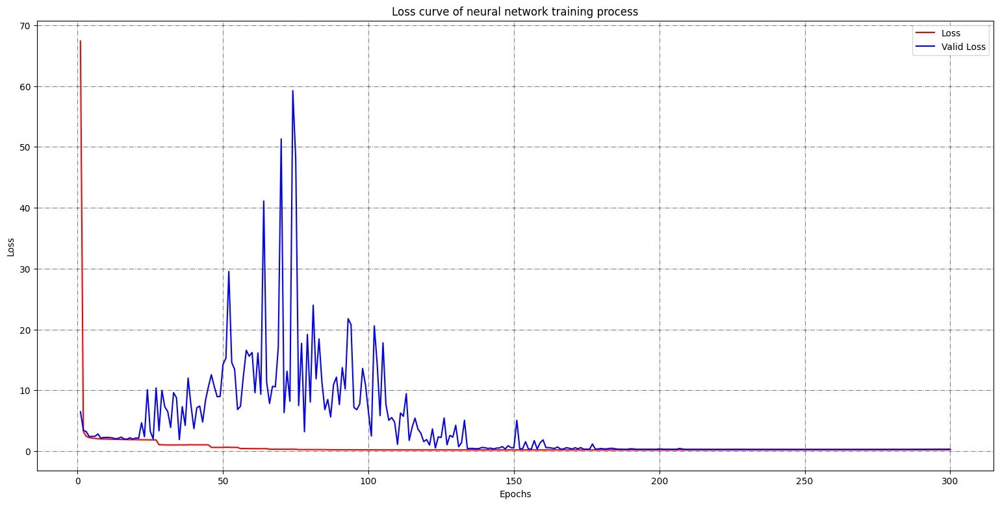

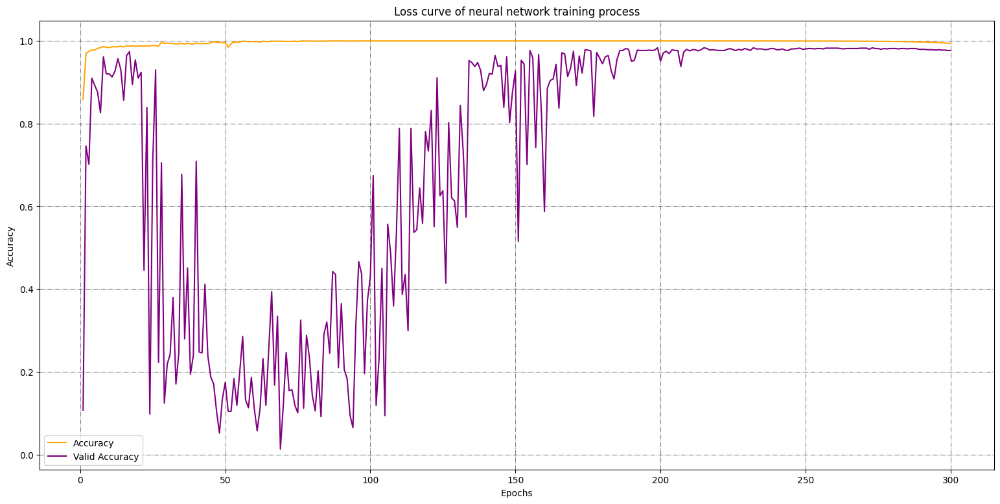

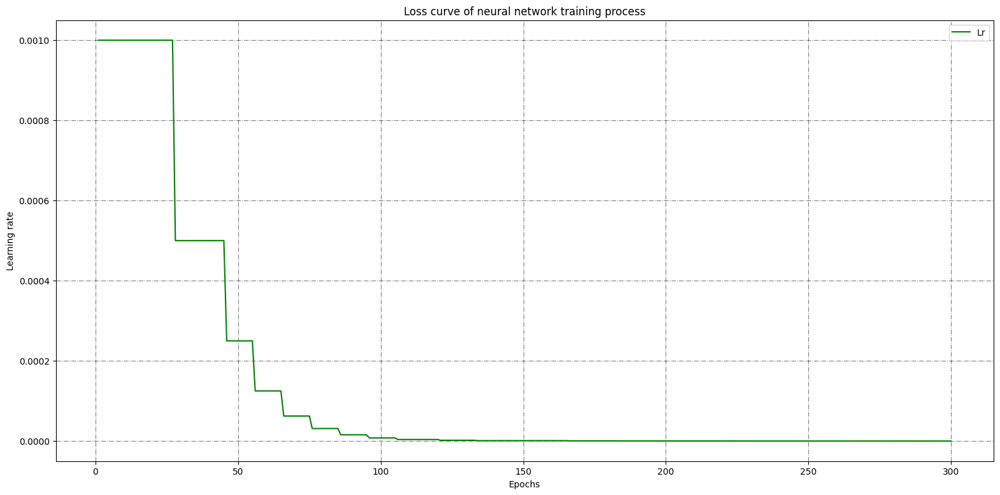

In [135]:
#绘制训练曲线图
TrainHistory=DataFrame(FNN_History.history)
Epoch=np.arange(1,TrainHistory.shape[0]+1)
Trainhistory_error=plt.figure(figsize=(19,9))    #损失函数曲线
Trainhistory_error_ax=Trainhistory_error.add_subplot(111)
Trainhistory_error_ax.set_title('Loss curve of neural network training process')
Trainhistory_error_ax.grid(color='black',linestyle='-.',alpha=0.5)
Trainhistory_error_ax.plot(Epoch,TrainHistory.loc[:,'loss'],linestyle='-',color='red',label='Loss')
Trainhistory_error_ax.plot(Epoch,TrainHistory.loc[:,'val_loss'],linestyle='-',color='blue',label='Valid Loss')
Trainhistory_error_ax.set_xlabel('Epochs')
Trainhistory_error_ax.set_ylabel('Loss')
plt.legend()
plt.show()
Trainhistory_accuracy=plt.figure(figsize=(19,9))    #精度曲线
Trainhistory_accuracy_ax=Trainhistory_accuracy.add_subplot(111)
Trainhistory_accuracy_ax.set_title('Loss curve of neural network training process')
Trainhistory_accuracy_ax.grid(color='black',linestyle='-.',alpha=0.5)
Trainhistory_accuracy_ax.plot(Epoch,TrainHistory.loc[:,'accuracy'],linestyle='-',color='orange',label='Accuracy')
Trainhistory_accuracy_ax.plot(Epoch,TrainHistory.loc[:,'val_accuracy'],linestyle='-',color='purple',label='Valid Accuracy')
Trainhistory_accuracy_ax.set_xlabel('Epochs')
Trainhistory_accuracy_ax.set_ylabel('Accuracy')
plt.legend()
plt.show()
Trainhistory_lr=plt.figure(figsize=(19,9))    #学习率曲线
Trainhistory_lr_ax=Trainhistory_lr.add_subplot(111)
Trainhistory_lr_ax.set_title('Loss curve of neural network training process')
Trainhistory_lr_ax.grid(color='black',linestyle='-.',alpha=0.5)
Trainhistory_lr_ax.plot(Epoch,TrainHistory.loc[:,'lr'],linestyle='-',color='green',label='Lr')
Trainhistory_lr_ax.set_xlabel('Epochs')
Trainhistory_lr_ax.set_ylabel('Learning rate')
plt.legend()
plt.show()

In [136]:
FNN.evaluate(TestData_DL)    #测试模型结果

133/133 [==============================] - 1s 5ms/step - loss: 0.3255 - accuracy: 0.9759


[0.32549795508384705, 0.9758854508399963]

In [137]:
FNN.save('Disease_class/DiseaseClass_Deeplearning/FNN_Disease.h5')    #保存模型

In [140]:
FNN.save('Disease_class/DiseaseClass_Deeplearning/FNN_Disease')    #保存模型

INFO:tensorflow:Assets written to: Disease_class/DiseaseClass_Deeplearning/FNN_Disease/assets


In [139]:
def ANN_Evaluate(model,X_train,y_train,X_test,y_test):
    Target_list=[0,1,2,3,4,5,6,7,8]
    #转化训练数据集
    train_pred=[]    #模型训练数据集
    ANNPredictProba_train=model.predict(X_train)    #获取模型预测数据
    for data_train in ANNPredictProba_train:
        data_train=Target_list[np.argmax(data_train)]    #获取预测数据
        train_pred.append(data_train)
    #转化测试数据集
    test_pred=[]    #模型测试数据集
    ANNPredictProba_test=model.predict(X_test)    #获取模型预测数据
    for data_test in ANNPredictProba_test:
        datatest_pred=Target_list[np.argmax(data_test)]    #获取预测数据
        test_pred.append(datatest_pred)
    precision_train=precision_score(y_train,train_pred,average='micro')
    recall_train=recall_score(y_train,train_pred,average='micro')
    f1_train=f1_score(y_train,train_pred,average='micro')
    accuracy_train=accuracy_score(y_train,train_pred)
    print('模型训练准确率为:{0},召回率为:{1},f1分数为:{2},精度为:{3}'.format(precision_train,recall_train,f1_train,accuracy_train))
    precision_test=precision_score(y_test,test_pred,average='micro')
    recall_test=recall_score(y_test,test_pred,average='micro')
    f1_test=f1_score(y_test,test_pred,average='micro')
    accuracy_test=accuracy_score(y_test,test_pred)
    print('模型测试准确率为:{0},召回率为:{1},f1分数为:{2},精度为:{3}'.format(precision_test,recall_test,f1_test,accuracy_test))
    print('---------------------训练数据集报告---------------------')
    print(classification_report(y_train,train_pred,target_names=DiseaseType))
    print('---------------------测试数据集报告---------------------')
    print(classification_report(y_test,test_pred,target_names=DiseaseType))
ANN_Evaluate(FNN,Train_Data,Train_Disease,Test_Data,Test_Disease)

42/42 [==============================] - 0s 3ms/step
模型训练准确率为:0.9918959668300038,召回率为:0.9918959668300038,f1分数为:0.9918959668300038,精度为:0.9918959668300038
模型测试准确率为:0.975885455915599,召回率为:0.975885455915599,f1分数为:0.975885455915599,精度为:0.975885455915599
---------------------训练数据集报告---------------------
                      precision    recall  f1-score   support

           Alzheimer       0.95      0.98      0.97       601
              Graves       1.00      1.00      1.00       604
          Huntington       0.99      0.98      0.99       585
           Parkinson       1.00      0.99      0.99       601
rheumatoid arthritis       0.99      1.00      1.00       587
       schizophrenia       1.00      0.99      0.99       575
   Sjogrens syndrome       1.00      1.00      1.00       575
              stroke       1.00      1.00      1.00       589
     type 2 diabetes       0.99      1.00      1.00       589

            accuracy                           0.99      5306
           macro 

比较不同疾病个体的DNA甲基化差异

In [105]:
#读取数据
ComparisonData=pd.read_excel('/mnt/workspace/Disease_class/Feature_Data_ClassDisease/ComparisonData.xlsx')
ComparisonData=ComparisonData.iloc[:,1:]
ComparisonData.head(10)

,cg03130627,cg16378352,cg23651808,cg10096929,cg01922433,cg11447335,cg02770835,cg11027217,cg24828811,cg17916447,...,cg17926234,cg16053651,cg10744200,age,gender,sample_type,disease,disease_encode,sample_type_encode,gender_encode
0,-4.585271,-2.600812,-1.093021,-1.277029,2.163468,2.010774,0.519260,-1.945225,1.456115,2.482634,...,-3.256540,2.174329,4.112908,88.0,F,disease tissue,Alzheimer's disease,1,1,0.0
1,-3.374769,-2.427712,-1.077132,-2.020410,1.991711,1.502429,0.388746,-1.489058,1.592260,2.253116,...,-3.543689,2.174329,2.664729,92.0,F,disease tissue,Alzheimer's disease,1,1,0.0
2,-3.439160,-2.276579,-0.954183,-1.900305,2.648415,2.110522,0.708031,-2.039899,2.152700,2.570129,...,-3.580953,1.945225,2.785946,93.0,F,disease tissue,Alzheimer's disease,1,1,0.0
3,-3.837361,-3.076403,-0.914682,-2.401172,2.059685,3.149987,0.384596,-1.972920,1.839820,2.218738,...,-3.175661,2.069693,2.555085,96.0,F,disease tissue,Alzheimer's disease,1,1,0.0
4,-3.472874,-2.185284,-1.179996,-1.599394,2.131436,2.020410,0.184485,-1.436670,1.502429,2.079779,...,-3.580953,2.540233,4.178048,91.0,M,disease tissue,Alzheimer's disease,1,1,1.0
5,-3.938986,-2.525567,-0.974195,-2.079779,2.059685,2.110522,1.585160,-1.814692,1.330612,2.131436,...,-3.374769,1.726235,3.201956,80.0,M,disease tissue,Alzheimer's disease,1,1,1.0
6,-3.439160,-2.427712,-0.944243,-1.936120,2.207487,2.069693,0.758205,-1.695385,1.543240,2.163468,...,-3.472874,2.337277,3.343970,79.0,F,disease tissue,Alzheimer's disease,1,1,0.0
7,-2.823096,-2.511081,-0.632117,-1.529517,2.616463,2.253116,0.269567,-1.423834,1.806416,2.555085,...,-3.439160,2.264792,3.543689,77.0,M,disease tissue,Alzheimer's disease,1,1,1.0
8,-3.701353,-2.337277,-0.904911,-2.001208,2.253116,1.963624,-0.212757,-1.564056,1.734052,2.540233,...,-3.507691,2.276579,3.886935,85.0,F,disease tissue,Alzheimer's disease,1,1,0.0
9,-3.406479,-2.616463,-0.944243,-1.687774,2.120936,2.174329,-0.298130,-1.773795,1.475799,2.230092,...,-3.284902,2.039899,3.659672,80.0,M,disease tissue,Alzheimer's disease,1,1,1.0


In [106]:
#填充空缺数据
ComparisonData['gender'].fillna('F',inplace=True)
ComparisonData['gender_encode'].fillna(0,inplace=True)

In [107]:
ComparisonData.isnull().sum()

cg03130627            0
cg16378352            0
cg23651808            0
cg10096929            0
cg01922433            0
cg11447335            0
cg02770835            0
cg11027217            0
cg24828811            0
cg17916447            0
cg06857865            0
cg05845757            0
cg11917413            0
cg09227621            0
cg04562683            0
cg09681335            0
cg04871364            0
cg17926234            0
cg16053651            0
cg10744200            0
age                   0
gender                0
sample_type           0
disease               0
disease_encode        0
sample_type_encode    0
gender_encode         0
dtype: int64

In [108]:
#监测并替换异常数据
import numpy as np
ModeComparisonData=ComparisonData.mode().iloc[0,:]    #获取众数数据
CG_Feature=Data.columns[:-7]    #获取甲基化基因数据
for cg in CG_Feature:
    Monitor_data=ComparisonData.loc[:,cg]    #提取监测数据
    Q1=np.percentile(Monitor_data,25)    #计算Q1值
    Q3=np.percentile(Monitor_data,75)    #计算Q3值
    IQR=Q3-Q1                            #计算IQR
    lower_bound=Q1-1.5 * IQR    #计算下限  
    upper_bound=Q3+1.5 * IQR     #计算上限
    outlier_value=[]    #存放异常数据
    for value in Monitor_data:    #检测并处理异常数据
        if value<lower_bound or value>upper_bound:
            outlier_value.append(value)    #添加异常数据
    ComparisonData[cg]=Monitor_data.replace(outlier_value,ModeData[cg])    #使用众数替换异常数据

比较不同疾病下正常个体于患病个体的差异

In [109]:
#比较正常个体
ComparisonDataGroup0=ComparisonData.loc[ComparisonData['disease_encode']==0,:]    #正常个体
ComparisonDataGroup1=ComparisonData.loc[ComparisonData['disease_encode']==1,:]    #Alzheimer's disease
ComparisonDataGroup2=ComparisonData.loc[ComparisonData['disease_encode']==2,:]    #Graves' disease
ComparisonDataGroup3=ComparisonData.loc[ComparisonData['disease_encode']==3,:]    #Huntington's disease
ComparisonDataGroup4=ComparisonData.loc[ComparisonData['disease_encode']==4,:]    #Parkinson's disease
ComparisonDataGroup5=ComparisonData.loc[ComparisonData['disease_encode']==5,:]    #rheumatoid arthritis
ComparisonDataGroup6=ComparisonData.loc[ComparisonData['disease_encode']==6,:]    #schizophrenia
ComparisonDataGroup7=ComparisonData.loc[ComparisonData['disease_encode']==7,:]    #Sjogren's syndrome
ComparisonDataGroup8=ComparisonData.loc[ComparisonData['disease_encode']==8,:]    #stroke
ComparisonDataGroup9=ComparisonData.loc[ComparisonData['disease_encode']==9,:]    #type 2 diabetes
ComparisonDataGroups=[ComparisonDataGroup1,ComparisonDataGroup2,ComparisonDataGroup3,ComparisonDataGroup4,ComparisonDataGroup5,
                      ComparisonDataGroup6,ComparisonDataGroup7,ComparisonDataGroup8,ComparisonDataGroup9]    #疾病数据
DiseaseName=['Alzheimer','Graves','Huntington','Parkinson','rheumatoid arthritis','schizophrenia','Sjogrens syndrome',
             'stroke','type 2 diabetes']    #疾病名称
ComparisonMannWhitneyU_Result=DataFrame()
DiseaseName,ComparisonMannWhitneyU_stats,ComparisonMannWhitneyU_pvalue=[],[],[]
for Group in tqdm(ComparisonDataGroups):    #循环疾病数据
    for cg in CG_Feature:    #循环CG数据
        GroupDisease_CG=Group.loc[:,cg]    #获取患病个体CG数据
        GroupContral_CG=ComparisonDataGroup0.loc[:,cg]    #获取正常个体CG数据
        mannwhitneyu_stats,mannwhitneyu_pvalue=mannwhitneyu(GroupDisease_CG,GroupContral_CG)
        if mannwhitneyu_pvalue<0.01:
            diseasename=Group.iloc[0,-4]    #提取疾病数据
            DiseaseName.append(diseasename)
            ComparisonMannWhitneyU_stats.append(mannwhitneyu_stats)    #添加统计量
            ComparisonMannWhitneyU_pvalue.append(mannwhitneyu_pvalue)    #添加P值
ComparisonMannWhitneyU_Result['Disease']=DiseaseName
ComparisonMannWhitneyU_Result['Mann-Whitney U Stats']=ComparisonMannWhitneyU_stats
ComparisonMannWhitneyU_Result['Mann-Whitney U Pvalue']=ComparisonMannWhitneyU_pvalue

100%|██████████| 9/9 [00:01<00:00,  8.63it/s]


In [110]:
ComparisonMannWhitneyU_Result.to_excel('/mnt/workspace/Disease_class/DiseaseClass_Deeplearning/ComparisonMannWhitneyU_Result.xlsx','UTF-8')